In [2]:
#import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from pandas.api.types import CategoricalDtype
from collections import Counter
from itertools import combinations
import scipy.stats as stats
from bokeh.io import output_notebook
output_notebook()
from bokeh.plotting import figure, show
from ipywidgets import interact, widgets
from bokeh.palettes import Set2, Set3
from scipy.stats import shapiro, kstest
from scipy.stats import boxcox

#display all the contents
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.width', None) 

#Ignore SettingWithCopyWarnings
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)

Loading BokehJS ...

In [3]:
#import raw datasets
r_LC = pd.read_csv("Raw Datasets/1_LC.csv")
r_LR = pd.read_csv("Raw Datasets/2_LR.csv")
r_LG = pd.read_csv("Raw Datasets/3_LG.csv")
r_MC = pd.read_csv("Raw Datasets/4_MC.csv")
r_MR = pd.read_csv("Raw Datasets/5_MR.csv")
r_MG = pd.read_csv("Raw Datasets/6_MG.csv")
r_FC = pd.read_csv("Raw Datasets/7_FC.csv")
r_FR = pd.read_csv("Raw Datasets/8_FR.csv")
r_FG = pd.read_csv("Raw Datasets/9_FG.csv")

In [4]:
#Raw datasets lists
A_r = [r_LC, r_LR, r_LG, r_MC, r_MR, r_MG, r_FC, r_FR, r_FG]

L_r = [r_LC, r_LR, r_LG]
M_r = [r_MC, r_MR, r_MG]
F_r = [r_FC, r_FR, r_FG]

In [5]:
def remove_all_spaces(datasets):
    if isinstance(datasets, pd.DataFrame):
        datasets = [datasets]

    for dataset in datasets:
        dataset.columns = dataset.columns.str.replace(r"\s+", "", regex=True)
        
        for col in dataset.select_dtypes(include=["object"]).columns:
            dataset[col] = dataset[col].str.strip()

remove_all_spaces(A_r)

In [6]:
r_LC

,StartDate,EndDate,Status,IPAddress,Progress,Duration(inseconds),Finished,RecordedDate,ResponseId,RecipientLastName,RecipientFirstName,RecipientEmail,ExternalReference,LocationLatitude,LocationLongitude,DistributionChannel,UserLanguage,Q_RecaptchaScore,DEMO-1,DEMO-2,DEMO-3,DEMO-4,DEMO-4_8_TEXT,DEMO-5,DEMO-5_5_TEXT,DEMO-6,DEMO-7,DEMO-7_9_TEXT,DEMO-8,DEMO-8_8_TEXT,DEMO-9,DEMO-9_4_TEXT,DEMO-10,DEMO-11,DEMO-11_6_TEXT,DEMO-12,DEMO-12_6_TEXT,DEMO-13,DEMO-13_5_TEXT,DEMO-14,DEMO-14_6_TEXT,DEMO-15,DEMO-15_4_TEXT,DEMO-16_1,DEMO-16_2,DEMO-17,DEMO-17_7_TEXT,DEMO-18_1,LOVE-1,LOVE-1_6_TEXT,LOVE-2,LOVE-3,LOVE-4,LOVE-5,LOVE-5_8_TEXT,LOVE-6,LOVE-6_7_TEXT,LOVE-7,LOVE-7_9_TEXT,LOVE-8,LOVE-8_6_TEXT,LOVE-9,LOVE-9_6_TEXT,LOVE-10,LOVE-10_6_TEXT,LOVE-11,LOVE-11_6_TEXT,LOVE-12-16_1,LOVE-12-16_2,LOVE-12-16_3,LOVE-12-16_4,LOVE-12-16_5,CULT-1,CULT-2,CULT-3,CULT-4,CULT-5-13_1,CULT-5-13_2,CULT-5-13_3,CULT-5-13_4,CULT-5-13_5,CULT-5-13_6,CULT-5-13_7,CULT-5-13_8,CONT-1,CONT-2
0,Start Date,End Date,Response Type,IP Address,Progress,Duration (in seconds),Finished,Recorded Date,Response ID,Recipient Last Name,Recipient First Name,Recipient Email,External Data Reference,Location Latitude,Location Longitude,Distribution Channel,User Language,Q_RecaptchaScore,What is your gender,"Your age is (please enter numbers only)\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.)",Which faculty are you enrolled in,What is your ethnicity/racial background - Selected Choice,What is your ethnicity/racial background - Other (please specify below) - Text,Where were you born - Selected Choice,Where were you born - Other (please specify) - Text,Do you have a religious belief,What is your religious belief - Selected Choice,What is your religious belief - Other (please specify below) - Text,What is the marital status of your parents - Selected Choice,What is the marital status of your parents - Other (please specify below) - Text,Were you born as a biological child or adopted into the family - Selected Choice,Were you born as a biological child or adopted into the family - Other (please specify below) - Text,What is the situation regarding siblings in your family,What is your birth order in the family - Selected Choice,What is your birth order in the family - Other (please specify below) - Text,Other children in your family include your - Selected Choice,Other children in your family include your - Other (please specify below) - Text,What is the situation regarding the other children in your family (excluding yourself) becoming family members - Selected Choice,What is the situation regarding the other children in your family (excluding yourself) becoming family members - Other (please specify below) - Text,"In your daily life, which family member do you feel you interact with more closely - Selected Choice","In your daily life, which family member do you feel you interact with more closely - I interact more closely with someone else (please specify below) - Text","In your daily life, which family member do you feel you interact with more closely - Selected Choice","In your daily life, which family member do you feel you interact with more closely - I interact more closely with someone else (please specify below) - Text","What is the education level of your parents\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - Father","What is the education level of your parents\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - Mother",What is your main source of living expenses - Selected Choice,What is your main source of living expenses - Other (please specify below) - Text,"What is your approximate monthly living expense\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - In MOP",What is

In [7]:
unwanted_columns = ['StartDate', 'EndDate', 'Status', 'IPAddress',
       'Duration (in seconds)', 'Finished', 'RecordedDate', 'RecipientLastName', 'RecipientFirstName', 'RecipientEmail',
       'ExternalReference', 'LocationLatitude', 'LocationLongitude',
       'DistributionChannel', 'UserLanguage', 'Q_RecaptchaScore', 'FERT-3_NPS_GROUP']

#delete unwanted columns
#Note that this function will change the value of the original dataframe directly
def del_unwanted_columns(datasets, unwanted_columns):
    if isinstance(datasets, pd.DataFrame):
        datasets = [datasets]

    for i, dataset in enumerate(datasets):
        dataset.drop(columns=unwanted_columns, inplace=True, errors='ignore')

del_unwanted_columns(A_r, unwanted_columns)

In [8]:
#Encoding rules
coding_DEMO = {"DEMO-1": "GEN", "DEMO-2": "AGE", "DEMO-3": "FACULTY", "DEMO-4": "RACE", "DEMO-4_8_TEXT": "RACE_Other", 
               "DEMO-5": "BIRTH_PLACE", "DEMO-5_5_TEXT": "BIRTH_PLACE_Other", "DEMO-6": "HAVE_BELIEF",
               "DEMO-7": "RELIGION", "DEMO-7_9_TEXT": "RELIGION_Other", "DEMO-8": "MARR_STATUS", "DEMO-8_8_TEXT": "MARR_STATUS_Other",
               "DEMO-9": "BIOKIDS", 'DEMO-9_4_TEXT': 'BIOKIDS_Other',
               "DEMO-10": "HAVE_SIBLINGS", "DEMO-11": "BIRTH_ORDER", "DEMO-11_6_TEXT": "BIRTH_ORDER_Other",
               "DEMO-12": "WHO_SIBLINGS", "DEMO-12_6_TEXT": "WHO_SIBLINGS_Other", "DEMO-13": "BIO_SIBLINGS", 
               "DEMO-13_5_TEXT": "BIO_SIBLINGS_Other", "DEMO-14": "CLOSE_FAMILY", "DEMO-14_6_TEXT": "CLOSE_FAMILY_Other",
               "DEMO-15": "CLOSE_FAMILY_NS", "DEMO-15_4_TEXT": "CLOSE_FAMILY_NS_Other", "DEMO-16_1": "FATHER_EDU", 
               "DEMO-16_2": "MOTHER_EDU", "DEMO-17": "INCOME_SOURCE", "DEMO-17_7_TEXT": "INCOME_SOURCE_Other",
               "DEMO-18_1": "INCOME",
               #Some of the columns of M part has been changed previously
               "RACE_8_TEXT": "RACE_Other", "BIRTH_PLACE_5_TEXT": "BIRTH_PLACE_Other",
               "RELIGION_9_TEXT": "RELIGION_Other", "MARR_STATUS_8_TEXT": "MARR_STATUS_Other",
               "BIRTH_ORDER_6_TEXT": "BIRTH_ORDER_Other", "WHO_SIBLINGS_6_TEXT": "WHO_SIBLINGS_Other",
               "BIO_SIBLINGS_5_TEXT": "BIO_SIBLINGS_Other", "CLOSE_FAMILY_6_TEXT": "CLOSE_FAMILY_Other" ,
               "CLOSE_FAMILY_NS_4_TEXT": "CLOSE_FAMILY_NS_Other", "PAR_EDU_1": "FATHER_EDU", "PAR_EDU_2": "MOTHER_EDU",
               "INCOME_SOURCE_7_TEXT": "INCOME_SOURCE_Other", "INCOME_1": "INCOME", 'BIOKIDS_4_TEXT': 'BIOKIDS_Other'
              }

#Note that this function will change the name of columns directly 
def coding_datasets(datasets, rule):
    if isinstance(datasets, pd.DataFrame):
        datasets = [datasets]
        
    for dataset in datasets:
        dataset.rename(columns=rule, inplace=True)

coding_datasets(A_r, coding_DEMO)

In [9]:
#Specify rules to combine datasets
DEMO_rule = ['Duration(inseconds)', 'Progress', 'ResponseId', 'GEN', 'AGE', 'FACULTY', 'RACE',
       'RACE_Other', 'BIRTH_PLACE', 'BIRTH_PLACE_Other', 'HAVE_BELIEF',
       'RELIGION', 'RELIGION_Other', 'MARR_STATUS', 'MARR_STATUS_Other',
       'BIOKIDS', 'BIOKIDS_Other', 'HAVE_SIBLINGS', 'BIRTH_ORDER', 'BIRTH_ORDER_Other',
       'WHO_SIBLINGS', 'WHO_SIBLINGS_Other', 'BIO_SIBLINGS',
       'BIO_SIBLINGS_Other', 'CLOSE_FAMILY', 'CLOSE_FAMILY_Other',
       'CLOSE_FAMILY_NS', 'CLOSE_FAMILY_NS_Other', 'FATHER_EDU', 'MOTHER_EDU',
       'INCOME_SOURCE', 'INCOME_SOURCE_Other', 'INCOME']


def get_combined(datasets, rule):
    if not isinstance(datasets, list):
        datasets = [datasets]
    filtered_datasets = []
    
    for dataset in datasets:
        filtered_datasets.append(dataset[rule])

    combined_dataset = pd.concat(filtered_datasets, ignore_index=True)

    return combined_dataset

DEMO_dataset = get_combined(A_r, DEMO_rule)
DEMO_dataset

,Duration(inseconds),Progress,ResponseId,GEN,AGE,FACULTY,RACE,RACE_Other,BIRTH_PLACE,BIRTH_PLACE_Other,HAVE_BELIEF,RELIGION,RELIGION_Other,MARR_STATUS,MARR_STATUS_Other,BIOKIDS,BIOKIDS_Other,HAVE_SIBLINGS,BIRTH_ORDER,BIRTH_ORDER_Other,WHO_SIBLINGS,WHO_SIBLINGS_Other,BIO_SIBLINGS,BIO_SIBLINGS_Other,CLOSE_FAMILY,CLOSE_FAMILY_Other,CLOSE_FAMILY_NS,CLOSE_FAMILY_NS_Other,FATHER_EDU,MOTHER_EDU,INCOME_SOURCE,INCOME_SOURCE_Other,INCOME
0,Duration (in seconds),Progress,Response ID,What is your gender,"Your age is (please enter numbers only)\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.)",Which faculty are you enrolled in,What is your ethnicity/racial background - Selected Choice,What is your ethnicity/racial background - Other (please specify below) - Text,Where were you born - Selected Choice,Where were you born - Other (please specify) - Text,Do you have a religious belief,What is your religious belief - Selected Choice,What is your religious belief - Other (please specify below) - Text,What is the marital status of your parents - Selected Choice,What is the marital status of your parents - Other (please specify below) - Text,Were you born as a biological child or adopted into the family - Selected Choice,Were you born as a biological child or adopted into the family - Other (please specify below) - Text,What is the situation regarding siblings in your family,What is your birth order in the family - Selected Choice,What is your birth order in the family - Other (please specify below) - Text,Other children in your family include your - Selected Choice,Other children in your family include your - Other (please specify below) - Text,What is the situation regarding the other children in your family (excluding yourself) becoming family members - Selected Choice,What is the situation regarding the other children in your family (excluding yourself) becoming family members - Other (please specify below) - Text,"In your daily life, which family member do you feel you interact with more closely - Selected Choice","In your daily life, which family member do you feel you interact with more closely - I interact more closely with someone else (please specify below) - Text","In your daily life, which family member do you feel you interact with more closely - Selected Choice","In your daily life, which family member do you feel you interact with more closely - I interact more closely with someone else (please specify below) - Text","What is the education level of your parents\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - Father","What is the education level of your parents\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - Mother",What is your main source of living expenses - Selected Choice,What is your main source of living expenses - Other (please specify below) - Text,"What is your approximate monthly living expense\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - In MOP"
1,"{""ImportId"":""duration""}","{""ImportId"":""progress""}","{""ImportId"":""_recordId""}","{""ImportId"":""QID4""}","{""ImportId"":""QID115_TEXT""}","{""ImportId"":""QID17""}","{""ImportId"":""QID18""}","{""ImportId"":""QID18_8_TEXT""}","{""ImportId"":""QID22""}","{""ImportId"":""QID22_5_TEXT""}","{""ImportId"":""QID99""}","{""ImportId"":""QID100""}","{""ImportId"":""QID100_9_TEXT""}","{""ImportId"":""QID19""}","{""ImportId"":""QID19_8_TEXT""}","{""ImportId"":""QID66""}","{""ImportId"":""QID66_4_TEXT""}","{""ImportId"":""QID20""}","{""ImportId"":""QID21""}","{""ImportId"":""QID21_6_TEXT""}","{""ImportId"":""QID23""}","{""ImportId"":""QID23_6_TEXT""}","{""ImportId"":""QID67""}","{""ImportId"":""QID67_5_TEXT""}","{""ImportId"":""QID68""}","{""ImportId"":""QID6

In [10]:
def remove_non_numeric_rows(dataset, column_name):
    if column_name not in dataset.columns:
        raise ValueError(f"Column '{column_name}' not found in the dataset.")

    dataset[column_name] = pd.to_numeric(dataset[column_name], errors='coerce')
    dataset.dropna(subset=[column_name], inplace=True)
    dataset.reset_index(drop=True, inplace=True)

#Duration should never be NaN
remove_non_numeric_rows(DEMO_dataset, "Duration(inseconds)")
DEMO_dataset

,Duration(inseconds),Progress,ResponseId,GEN,AGE,FACULTY,RACE,RACE_Other,BIRTH_PLACE,BIRTH_PLACE_Other,HAVE_BELIEF,RELIGION,RELIGION_Other,MARR_STATUS,MARR_STATUS_Other,BIOKIDS,BIOKIDS_Other,HAVE_SIBLINGS,BIRTH_ORDER,BIRTH_ORDER_Other,WHO_SIBLINGS,WHO_SIBLINGS_Other,BIO_SIBLINGS,BIO_SIBLINGS_Other,CLOSE_FAMILY,CLOSE_FAMILY_Other,CLOSE_FAMILY_NS,CLOSE_FAMILY_NS_Other,FATHER_EDU,MOTHER_EDU,INCOME_SOURCE,INCOME_SOURCE_Other,INCOME
0,2033.0,100,R_4MM1ltT1Nhg82pr,男,20,Faculty of Arts and Humanities,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Father,Mother",NaN,Master's degree,Bachelor's degree,Family support (provided by parents or other family members),NaN,2275
1,292.0,100,R_4X4Yrj2WHp3iDX9,女,21,Faculty of Health Sciences,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mother,NaN,Bachelor's degree,NaN,Family support (provided by parents or other family members),NaN,4746
2,205.0,100,R_4fHRrHvAjNYuldI,男,20,Faculty of Science and Technology,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mother,NaN,Secondary school,NaN,Family support (provided by parents or other family members),NaN,2945
3,211.0,100,R_4eLd0ZLstEsjVTS,女,22,Faculty of Education,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Father,Mother",NaN,Bachelor's degree,Secondary school,Family support (provided by parents or other family members),NaN,3356
4,324.0,100,R_4lWRnxmPQ3kFsRP,女,23,Faculty of Arts and Humanities,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Father,Mother",NaN,Master's degree,Secondary school,Income from work (part-time or full-time),NaN,5016
5,198.0,100,R_4ROKFSz1JdilXnh,男,19,Faculty of Business Administration,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Father,NaN,Bachelor's degree,Bachelor's degree,Family support (provided by parents or other family members),NaN,3995
6,169.0,100,R_4EzYKjL9wbP1Us5,女,21,Faculty of Arts and Humanities,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mother,NaN,Bachelor's degree,NaN,Family support (provided by parents or other family members),NaN,5090
7,244.0,100,R_4U4mfSPHyCRuRet,男,20,Faculty of Business Administration,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Prefer not to say,NaN,Secondary school,Doctoral degree,Family support (provided by parents or other family members),NaN,3821
8,464.0,100,R_4CuLdKeUOOcBDJT,女,18,Faculty of the Law,Chinese,NaN,Hong Kong/Macau,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,Have siblings,Youngest son/daughter,NaN,Older brother,NaN,All were born as biological children,NaN,Mother,NaN,NaN,NaN,Secondary school,Secondary school,"Family support (provided by parents or other family members),Income from work (part-time or full-time),Savings or personal savings",NaN,537
9,255.0,100,R_4CszNhIpvegU2Wh,女,19,Faculty of Business Administration,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,Have siblings,Youngest son/daughter,NaN,Older brother,NaN,All were born as biological children,NaN,"Father,Mother,Older brother/younger brother",NaN,NaN,NaN,Bachelor's degree,NaN,Family support (provided by parents or other family members),NaN,4027


In [11]:
#Delete responses whose progress is less than 30
DEMO_dataset["Progress"] = pd.to_numeric(DEMO_dataset["Progress"], errors="coerce")
DEMO_dataset = DEMO_dataset[(DEMO_dataset["Progress"] >= 30) & (DEMO_dataset["Duration(inseconds)"] >= 60)]
DEMO_dataset.reset_index(drop=True, inplace=True)

DEMO_dataset

,Duration(inseconds),Progress,ResponseId,GEN,AGE,FACULTY,RACE,RACE_Other,BIRTH_PLACE,BIRTH_PLACE_Other,HAVE_BELIEF,RELIGION,RELIGION_Other,MARR_STATUS,MARR_STATUS_Other,BIOKIDS,BIOKIDS_Other,HAVE_SIBLINGS,BIRTH_ORDER,BIRTH_ORDER_Other,WHO_SIBLINGS,WHO_SIBLINGS_Other,BIO_SIBLINGS,BIO_SIBLINGS_Other,CLOSE_FAMILY,CLOSE_FAMILY_Other,CLOSE_FAMILY_NS,CLOSE_FAMILY_NS_Other,FATHER_EDU,MOTHER_EDU,INCOME_SOURCE,INCOME_SOURCE_Other,INCOME
0,2033.0,100,R_4MM1ltT1Nhg82pr,男,20,Faculty of Arts and Humanities,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Father,Mother",NaN,Master's degree,Bachelor's degree,Family support (provided by parents or other family members),NaN,2275
1,292.0,100,R_4X4Yrj2WHp3iDX9,女,21,Faculty of Health Sciences,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mother,NaN,Bachelor's degree,NaN,Family support (provided by parents or other family members),NaN,4746
2,205.0,100,R_4fHRrHvAjNYuldI,男,20,Faculty of Science and Technology,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mother,NaN,Secondary school,NaN,Family support (provided by parents or other family members),NaN,2945
3,211.0,100,R_4eLd0ZLstEsjVTS,女,22,Faculty of Education,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Father,Mother",NaN,Bachelor's degree,Secondary school,Family support (provided by parents or other family members),NaN,3356
4,324.0,100,R_4lWRnxmPQ3kFsRP,女,23,Faculty of Arts and Humanities,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Father,Mother",NaN,Master's degree,Secondary school,Income from work (part-time or full-time),NaN,5016
5,198.0,100,R_4ROKFSz1JdilXnh,男,19,Faculty of Business Administration,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Father,NaN,Bachelor's degree,Bachelor's degree,Family support (provided by parents or other family members),NaN,3995
6,169.0,100,R_4EzYKjL9wbP1Us5,女,21,Faculty of Arts and Humanities,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mother,NaN,Bachelor's degree,NaN,Family support (provided by parents or other family members),NaN,5090
7,244.0,100,R_4U4mfSPHyCRuRet,男,20,Faculty of Business Administration,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,No siblings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Prefer not to say,NaN,Secondary school,Doctoral degree,Family support (provided by parents or other family members),NaN,3821
8,464.0,100,R_4CuLdKeUOOcBDJT,女,18,Faculty of the Law,Chinese,NaN,Hong Kong/Macau,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,Have siblings,Youngest son/daughter,NaN,Older brother,NaN,All were born as biological children,NaN,Mother,NaN,NaN,NaN,Secondary school,Secondary school,"Family support (provided by parents or other family members),Income from work (part-time or full-time),Savings or personal savings",NaN,537
9,255.0,100,R_4CszNhIpvegU2Wh,女,19,Faculty of Business Administration,Chinese,NaN,Mainland China,NaN,No,NaN,NaN,Parents are married,NaN,Born as a biological child,NaN,Have siblings,Youngest son/daughter,NaN,Older brother,NaN,All were born as biological children,NaN,"Father,Mother,Older brother/younger brother",NaN,NaN,NaN,Bachelor's degree,NaN,Family support (provided by parents or other family members),NaN,4027


In [12]:
def remove_empty_columns(dataset):
    dataset.dropna(axis=1, how="all", inplace=True)
    return None

remove_empty_columns(DEMO_dataset)

In [13]:
#Transfer value in Other columns to corresponding variable columns
def handle_other_columns(dataset):
    for col in dataset.columns:
        if col.endswith("_Other"):
            main_col = col.replace("_Other", "")

            if main_col in dataset.columns:
                mask = dataset[col].notna()
                dataset.loc[mask, main_col] = dataset.loc[mask, col]

            dataset.drop(columns=col, inplace=True)

handle_other_columns(DEMO_dataset)

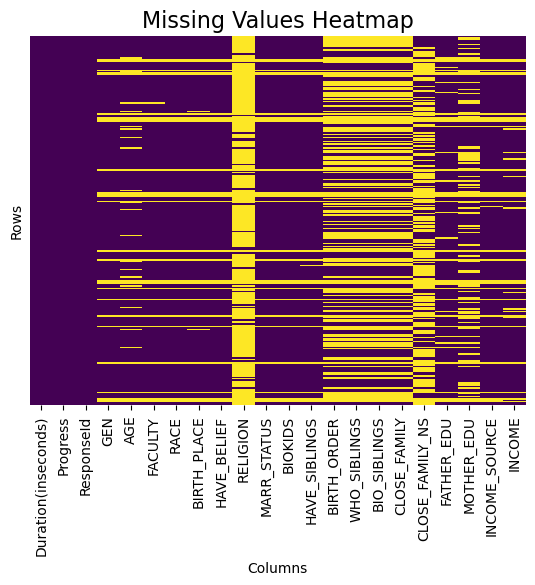

In [14]:
#Function to visualize NaNs
def visualize_nan(dataset, columns):
    missing_columns = [col for col in columns if col not in dataset.columns]
    if missing_columns:
        raise ValueError(f"The following columns are not in the dataset: {columns}")
    selected_data = dataset[columns].isnull()
    sns.heatmap(selected_data, cbar=False, cmap="viridis", yticklabels=False)
    
    plt.title("Missing Values Heatmap", fontsize=16)
    plt.xlabel("Columns")
    plt.ylabel("Rows")
    plt.show()

visualize_nan(DEMO_dataset, DEMO_dataset.columns)

In [15]:
#Change dtypes of AGE and INCOME to numeric
DEMO_dataset["AGE"] = pd.to_numeric(DEMO_dataset["AGE"], errors="coerce")
DEMO_dataset["INCOME"] = pd.to_numeric(DEMO_dataset["INCOME"], errors="coerce")
DEMO_dataset.dtypes

Duration(inseconds)    float64
Progress                 int64
ResponseId              object
GEN                     object
AGE                    float64
FACULTY                 object
RACE                    object
BIRTH_PLACE             object
HAVE_BELIEF             object
RELIGION                object
MARR_STATUS             object
BIOKIDS                 object
HAVE_SIBLINGS           object
BIRTH_ORDER             object
WHO_SIBLINGS            object
BIO_SIBLINGS            object
CLOSE_FAMILY            object
CLOSE_FAMILY_NS         object
FATHER_EDU              object
MOTHER_EDU              object
INCOME_SOURCE           object
INCOME                 float64
dtype: object

In [16]:
#Mapping of answers
GEN_map = {'男': 'Male', '女': 'Female', '非二元性別/第三性別': 'Non-binary/Third Gender', '不願透露': 'Prefer not to say'}
DEMO_dataset.loc[:, "GEN"] = DEMO_dataset["GEN"].replace(GEN_map)

FACULTY_map = {'教育學院 FED': 'FED' ,
               '其他': 'Other', '科技學院 FST': 'FST', 
               '健康科學學院 FHS': 'FHS', 
               '微電子研究院 IME': 'IME', '工商管理學院 FBA': 'FBA',
               '社會科學學院 FSS': 'FSS', '法學院 FLL': 'FLL',
               '人文學院 FAH': 'FAH',
               'Faculty of Arts and Humanities': 'FAH', 'Faculty of Health Sciences': 'FHS',
               'Faculty of Science and Technology': 'FST', 'Faculty of Education': 'FED',
               'Faculty of Business Administration': 'FBA', 'Faculty of the Law': 'FLL',
               'Faculty of Social Sciences': 'FSS', 'Institute of Applied Physics and Materials Engineering': 'IAPME',
               'Institute of Collaborative Innovation': 'ICI',
               'Institute of Chinese Medical Sciences': 'ICMS',
               'Asia-Pacific Academy of Economics and Management': 'APAEM',
               'Institute of Microelectronics': 'IME'}
DEMO_dataset.loc[:, "FACULTY"] = DEMO_dataset["FACULTY"].replace(FACULTY_map)

RACE_map = {'華人': 'Chinese'}
DEMO_dataset.loc[:, "RACE"] = DEMO_dataset["RACE"].replace(RACE_map)

BIRTH_PLACE_map = {'中國大陸': 'Mainland China', '香港/澳門': 'Hong Kong/Macau', 
                   '不願透露': 'Prefer not to say', '阿根廷': 'Argentina'}
DEMO_dataset.loc[:, "BIRTH_PLACE"] = DEMO_dataset["BIRTH_PLACE"].replace(BIRTH_PLACE_map)

HAVE_BELIEF_map = {'否': 'No', '不願透露': 'Prefer not to say', '是': 'Yes'}
DEMO_dataset.loc[:, "HAVE_BELIEF"] = DEMO_dataset["HAVE_BELIEF"].replace(HAVE_BELIEF_map)

RELIGION_map = {'佛教': 'Buddhism', '天主教': 'Catholicism'}
DEMO_dataset.loc[:, "RELIGION"] = DEMO_dataset["RELIGION"].replace(RELIGION_map)

MARR_STATUS_map = {'父母結婚': 'Parents are married', '父母分居': 'Parents are separated', '不願透露': 'Prefer not to say'}
DEMO_dataset.loc[:, "MARR_STATUS"] = DEMO_dataset["MARR_STATUS"].replace(MARR_STATUS_map)

BIOKIDS_map = {'Don’t have a kid': np.nan, '以生物學上的子女身份出生': 'Born as a biological child'} #Obviously a wrong response
DEMO_dataset.loc[:, "BIOKIDS"] = DEMO_dataset["BIOKIDS"].replace(BIOKIDS_map)

HAVE_SIBLINGS_map = {'有兄弟姐妹': 'Have siblings', '無兄弟姐妹': 'No siblings' , '不願透露': 'Prefer not to say'}
DEMO_dataset.loc[:, "HAVE_SIBLINGS"] = DEMO_dataset["HAVE_SIBLINGS"].replace(HAVE_SIBLINGS_map)

BIRTH_ORDER_map = {'長子/長女': 'Oldest son/daughter',
       '次子/次女': 'Middle son/daughter', '幼子/幼女': 'Youngest son/daughter', 'twins': 'Twins', '两个同父异母的姐姐': 'Youngest son/daughter',
                  'Only child': np.nan}
DEMO_dataset.loc[:, "BIRTH_ORDER"] = DEMO_dataset["BIRTH_ORDER"].replace(BIRTH_ORDER_map)

WHO_SIBLINGS_map = {'哥哥': 'Older brother',
    '弟弟': 'Younger brother', '弟弟,妹妹': 'Younger brother,Younger sister',
    '妹妹': 'Younger sister',
    '两个姐姐都在美国留学': 'Older sister,Older sister',
    'two younger half sisters': 'Younger sister',
    '同父異母的妹妹': 'Younger sister',
    '不願透露': 'Prefer not to say',
    'twins': np.nan, 'NO': 'Prefer not to say'}
DEMO_dataset.loc[:, "WHO_SIBLINGS"] = DEMO_dataset["WHO_SIBLINGS"].replace(WHO_SIBLINGS_map)

BIO_SIBLINGS_map = {'NO': 'Prefer not to say', '全部以生物學上的子女身份出生': 'All were born as biological children'}
DEMO_dataset.loc[:, "BIO_SIBLINGS"] = DEMO_dataset["BIO_SIBLINGS"].replace(BIO_SIBLINGS_map)

CLOSE_FAMILY_map = {'parents': 'Father,Mother', '朋友': 'Prefer not to say', 
                    'Prefer not to say,I interact more closely with someone else (please specify below)': np.nan,
                    '都差不多': 'Prefer not to say', '奶奶': 'Grand parents', '都一样': 'Prefer not to say',
                    'I interact more closely with someone else (please specify below)': np.nan, 'My friend': np.nan,
                    '不願透露': 'Prefer not to say', '父親,母親': 'Father,Mother', 
                    '姐姐/妹妹,哥哥/弟弟': 'Older sister/younger sister,Older brother/younger brother', 
                    '母親': 'Mother', '哥哥/弟弟': 'Older brother/younger brother', '父親': 'Father',
       '父親,母親,姐姐/妹妹': 'Father,Mother,Older sister/younger sister', '表弟，表哥':'Cousins'}
DEMO_dataset.loc[:, "CLOSE_FAMILY"] = DEMO_dataset["CLOSE_FAMILY"].replace(CLOSE_FAMILY_map)

CLOSE_FAMILY_NS_map = {'parents': 'Father,Mother', '朋友': 'Prefer not to say', 
                    '伴侶': np.nan, '外婆': 'Grand parents',
                    '都差不多': 'Prefer not to say', 'grandma': 'Grand parents', '都很密切': 'Prefer not to say',
                    'I interact more closely with someone else (please specify below)': np.nan, '朋友': np.nan,
                    '不願透露': 'Prefer not to say', '父親,母親': 'Father,Mother', 
                    '姐姐/妹妹,哥哥/弟弟': 'Older sister/younger sister,Older brother/younger brother', 
                    '母親': 'Mother', '哥哥/弟弟': 'Older brother/younger brother', '父親': 'Father',
                    'I interact more closely with someone else (please specify below)': np.nan, 
                    '我與其他人的互動更為密切（請在下方欄註明）': np.nan}
DEMO_dataset.loc[:, "CLOSE_FAMILY_NS"] = DEMO_dataset["CLOSE_FAMILY_NS"].replace(CLOSE_FAMILY_NS_map)

FATHER_EDU_map = {'中學': 'Secondary school', '博士學位': 'Doctoral degree', '小學': 'Primary school',
       '學士學位': "Bachelor's degree", '碩士學位': "Master's degree"}
DEMO_dataset.loc[:, "FATHER_EDU"] = DEMO_dataset["FATHER_EDU"].replace(FATHER_EDU_map)


MOTHER_EDU_map = {'中學': 'Secondary school', '博士學位': 'Doctoral degree', '小學': 'Primary school',
       '學士學位': "Bachelor's degree", '碩士學位': "Master's degree"}
DEMO_dataset.loc[:, "MOTHER_EDU"] = DEMO_dataset["MOTHER_EDU"].replace(MOTHER_EDU_map)

INCOME_SOURCE_map = {'家庭支持（父母或其他家庭成員提供）,工作收入（兼職或全職）': 'Family support (provided by parents or other family members),Income from work (part-time or full-time)', 
                  '家庭支持（父母或其他家庭成員提供）,獎學金或助學金': 'Family support (provided by parents or other family members),Scholarships or financial aid',
                  '家庭支持（父母或其他家庭成員提供）': 'Family support (provided by parents or other family members)', 
                  '不願透露': 'Prefer not to say', '儲蓄或個人存款': 'Savings or personal savings',
                  '家庭支持（父母或其他家庭成員提供）,獎學金或助學金,工作收入（兼職或全職）,儲蓄或個人存款':'Family support (provided by parents or other family members),Scholarships or financial aid,Income from work (part-time or full-time),Savings or personal savings',
                  '工作收入（兼職或全職）': 'Income from work (part-time or full-time)',
                  '家庭支持（父母或其他家庭成員提供）,獎學金或助學金,工作收入（兼職或全職）': 'Family support (provided by parents or other family members),Scholarships or financial aid,Income from work (part-time or full-time)',
                  '家庭支持（父母或其他家庭成員提供）,工作收入（兼職或全職）,儲蓄或個人存款': 'Family support (provided by parents or other family members),Income from work (part-time or full-time),Savings or personal savings', 
                  '家庭支持（父母或其他家庭成員提供）,助學貸款': 'Family support (provided by parents or other family members),Student loans',
                  '投資': 'Investment'
                   }
DEMO_dataset.loc[:, "INCOME_SOURCE"] = DEMO_dataset["INCOME_SOURCE"].replace(INCOME_SOURCE_map)

In [17]:
#Standarize for shrter labels for INCOME_SOURCE
INCOME_SOURCE_map = {
                  'Family support (provided by parents or other family members)': 'Family support',
                  'Income from work (part-time or full-time)': 'Salary',
                  'Family support (provided by parents or other family members),Income from work (part-time or full-time),Savings or personal savings': 'Family support,Salary,Savings',
                  'Family support (provided by parents or other family members),Income from work (part-time or full-time)': 'Family support,Salary',
                  'Family support (provided by parents or other family members),Scholarships or financial aid,Income from work (part-time or full-time)': 'Family support,Scholarship,Salary',
                  'Family support (provided by parents or other family members),Prefer not to say': 'Family support',
                  'Family support (provided by parents or other family members),Savings or personal savings': 'Family support,Savings',
                  'Income from work (part-time or full-time),Student loans,Savings or personal savings': 'Salary,Loan,Savings',
                  'Family support (provided by parents or other family members),Scholarships or financial aid': 'Family support,Scholarship',
                  'Income from work (part-time or full-time),Savings or personal savings': 'Salary,Savings',
                  'Family support (provided by parents or other family members),Scholarships or financial aid,Savings or personal savings': 'Family support,Scholarship,Savings',
                  'Family support (provided by parents or other family members),Scholarships or financial aid,Income from work (part-time or full-time),Savings or personal savings': 'Family support,Scholarship,Salary,Savings',
                  'Student loans': 'Loan',
                  'Family support (provided by parents or other family members),Income from work (part-time or full-time),Student loans': 'Family support,Salary,Loan',
                  'Family support (provided by parents or other family members),Scholarships or financial aid,Income from work (part-time or full-time),Student loans,Savings or personal savings': 'Family support,Scholarship,Salary,Loan,Savings',
                  'Savings or personal savings': 'Savings',
                  'Family support (provided by parents or other family members),Student loans': 'Family support,Loan',
                  'Scholarships or financial aid': 'Scholarship',
                  'Income from work (part-time or full-time),Student loans': 'Salary,Loan' 
                   }
DEMO_dataset.loc[:, "INCOME_SOURCE"] = DEMO_dataset["INCOME_SOURCE"].replace(INCOME_SOURCE_map)

In [18]:
#CategoricalDtype
categories_order_1 = ['Primary school', 'Secondary school', "Bachelor's degree", "Master's degree", "Doctor's degree"]
edu_dtype = CategoricalDtype(categories=categories_order_1, ordered=True)
DEMO_dataset['FATHER_EDU'] = DEMO_dataset['FATHER_EDU'].astype(edu_dtype)
DEMO_dataset['MOTHER_EDU'] = DEMO_dataset['MOTHER_EDU'].astype(edu_dtype)

categories_order_2 = ['Twins', 'Youngest son/daughter', 'Middle son/daughter', 'Oldest son/daughter']
birth_dtype = CategoricalDtype(categories=categories_order_2, ordered=True)
DEMO_dataset['BIRTH_ORDER'] = DEMO_dataset['BIRTH_ORDER'].astype(birth_dtype)

In [19]:
options = ['GEN', 'AGE',
       'FACULTY', 'RACE', 'BIRTH_PLACE', 'HAVE_BELIEF', 'RELIGION',
       'MARR_STATUS', 'BIOKIDS', 'HAVE_SIBLINGS', 'BIRTH_ORDER',
       'BIO_SIBLINGS',
       'FATHER_EDU', 'MOTHER_EDU']
dropdown = widgets.Dropdown(
    options=options,
    value="GEN",
    description="Variable"
)
dropdown

Dropdown(description='Variable', options=('GEN', 'AGE', 'FACULTY', 'RACE', 'BIRTH_PLACE', 'HAVE_BELIEF', 'RELI…

In [20]:
#Create an iteractive drawer of DV's count plot
@interact
def display_plot(variable=dropdown):
    data_clean = DEMO_dataset.dropna(subset=[variable])

    count_data = data_clean[variable].value_counts(normalize=True).reset_index()
    count_data.columns = [variable, 'percentage']
    count_data['percentage'] = (count_data['percentage'] * 100).round(2)

    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=variable, data=data_clean, palette='Set2')

    total = len(data_clean)
    for p in ax.patches:
        height = p.get_height()
        percentage = (height / total) * 100
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{percentage:.1f}%', ha='center', fontsize=12)

    plt.title(f'Distribution of {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, axis='y', alpha=0.3)
    plt.show()

    if variable == 'BIRTH_PLACE':
        data_clean = DEMO_dataset.dropna(subset=[variable])
        data_clean['Student_Type'] = data_clean[variable].apply(lambda x: 'Local Students' if x == 'Hong Kong/Macau' else 'Non-Local Students')

        plt.figure(figsize=(10, 6))
        ax = sns.countplot(x='Student_Type', data=data_clean, palette='Set2')

        total = len(data_clean)
        for p in ax.patches:
            height = p.get_height()
            percentage = (height / total) * 100
            ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{percentage:.1f}%', ha='center', fontsize=12)

        plt.title(f'Distribution of Local vs Non-Local Students', fontsize=16)
        plt.xlabel('Student Type', fontsize=12)
        plt.ylabel('Frequency', fontsize=12)
        plt.grid(True, axis='y', alpha=0.3)

        plt.tight_layout()
        plt.show()
        

interactive(children=(Dropdown(description='Variable', options=('GEN', 'AGE', 'FACULTY', 'RACE', 'BIRTH_PLACE'…

In [21]:
dropdown = widgets.Dropdown(
    options=options,
    value="GEN",
    description="Variable"
)
@interact
def display_distribution(variable=dropdown):
    if variable not in DEMO_dataset.columns:
        print(f"Invalid variable: {variable}")
        return
    
    pmf = DEMO_dataset[variable].value_counts(normalize=True)
    pmf = pmf.sort_index()

    plt.figure(figsize=(10, 6))
    pmf.plot(kind='bar', color='lightgreen', edgecolor='black')
    plt.title(f'Probability Mass Function (PMF) for {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Probability', fontsize=12)
    plt.grid(True, axis='y', alpha=0.3)
    plt.xticks(rotation=45)
    plt.show()

    if variable in ["AGE", "BIRTH_ORDER", "FATHER_EDU", "MOTHER_EDU"]:
        cdf = pmf.cumsum()

        plt.figure(figsize=(10, 6))
        plt.step(cdf.index, cdf.values, where='mid', color='skyblue')
        plt.title(f'Cumulative Distribution Function (CDF) for {variable}', fontsize=16)
        plt.xlabel(variable, fontsize=12)
        plt.ylabel('Cumulative Probability', fontsize=12)
        plt.grid(True, axis='y', alpha=0.3)
        plt.show()

interactive(children=(Dropdown(description='Variable', options=('GEN', 'AGE', 'FACULTY', 'RACE', 'BIRTH_PLACE'…

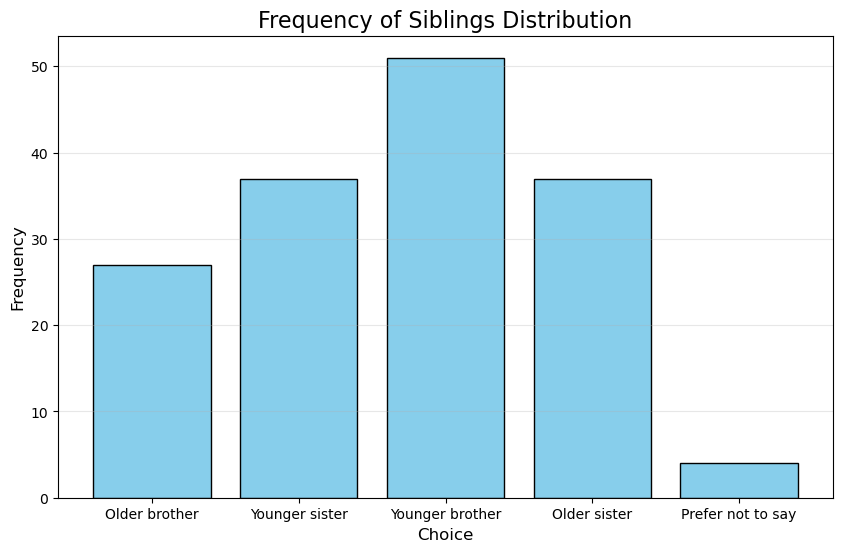

In [22]:
siblings_data = DEMO_dataset['WHO_SIBLINGS'].dropna()
WHO_SIBLINGS_all_choices = siblings_data.str.split(',')
flat_choices = [item.strip() for sublist in WHO_SIBLINGS_all_choices for item in sublist]

from collections import Counter
choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of Siblings Distribution', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

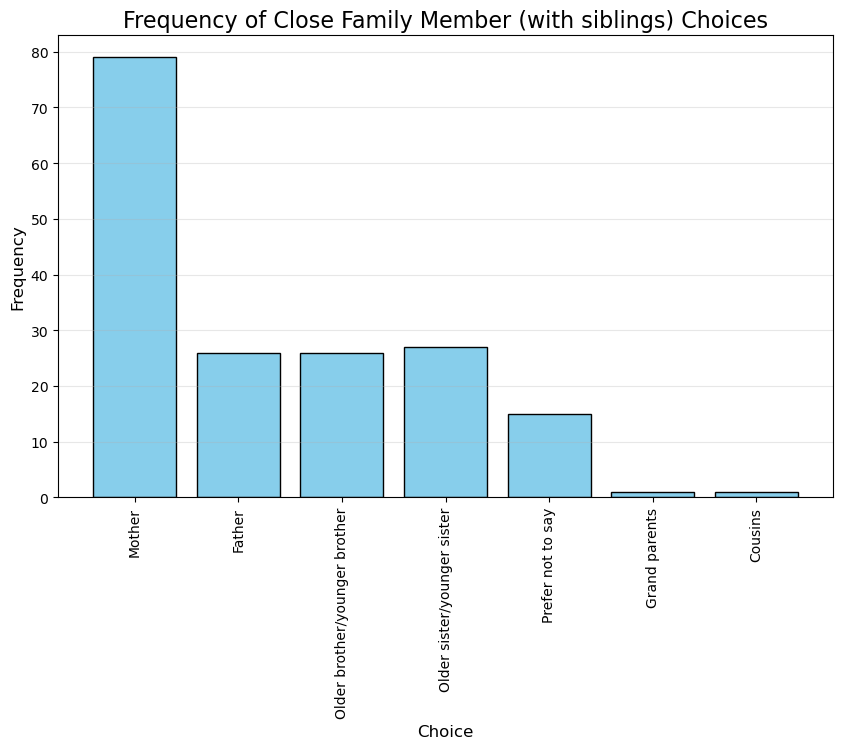

In [23]:
close_family_data = DEMO_dataset['CLOSE_FAMILY'].dropna()
CLOSE_FAMILY_all_choices = close_family_data.str.split(',')
flat_choices = [item.strip() for sublist in CLOSE_FAMILY_all_choices for item in sublist]

from collections import Counter
choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of Close Family Member (with siblings) Choices', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=90)
plt.show()

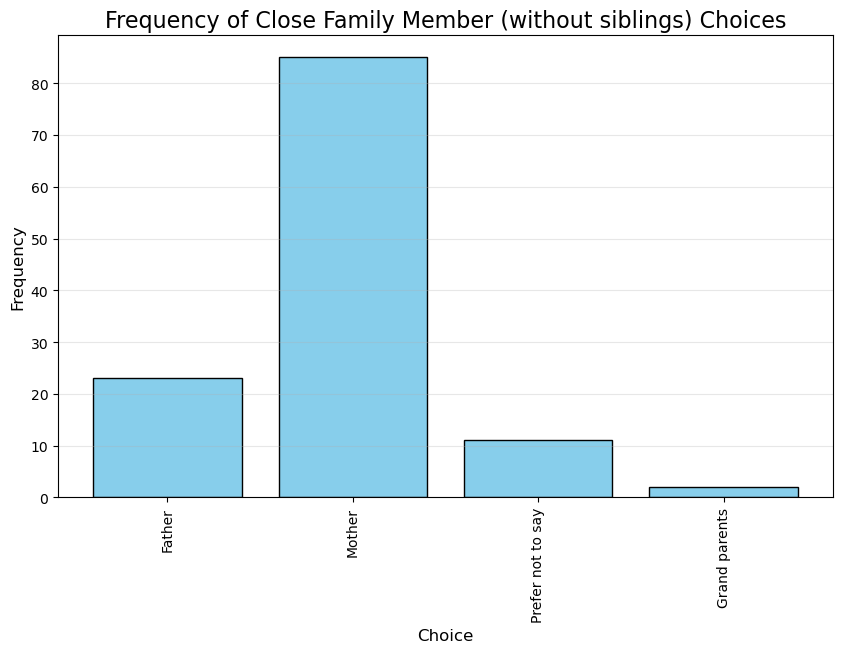

In [24]:
close_family_ns_data = DEMO_dataset['CLOSE_FAMILY_NS'].dropna()
CLOSE_FAMILY_NS_all_choices = close_family_ns_data.str.split(',')
flat_choices = [item.strip() for sublist in CLOSE_FAMILY_NS_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of Close Family Member (without siblings) Choices', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=90)
plt.show()

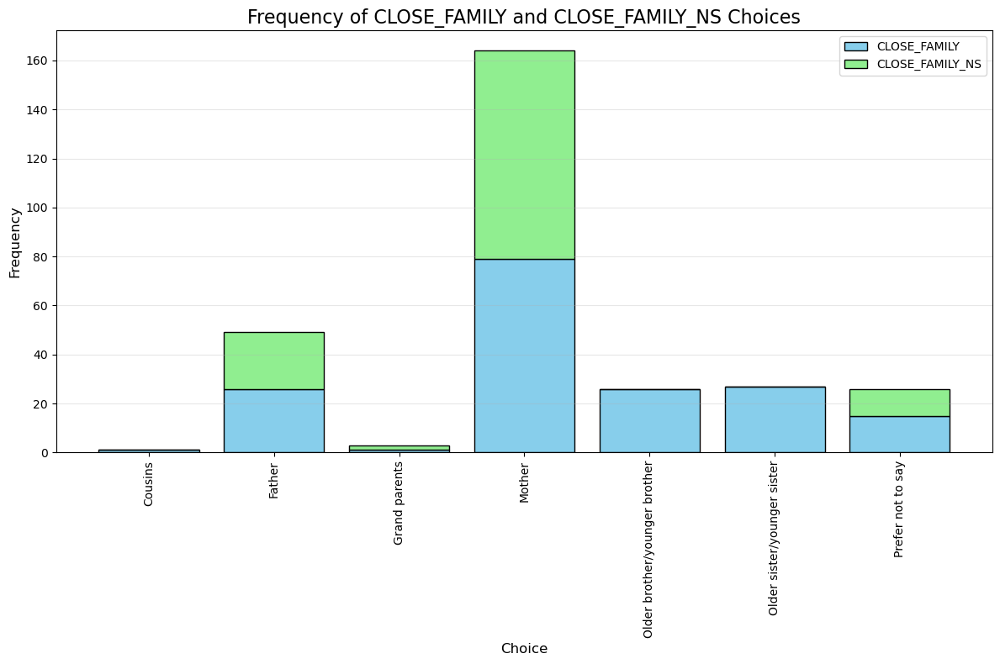

In [25]:
#Frequency of splitted choices: "CLOSE_FAMILY"
close_family_data = DEMO_dataset['CLOSE_FAMILY'].dropna()
CLOSE_FAMILY_all_choices = close_family_data.str.split(',')
flat_choices_cf = [item.strip() for sublist in CLOSE_FAMILY_all_choices for item in sublist]
cf_counts = Counter(flat_choices_cf)

close_family_ns_data = DEMO_dataset['CLOSE_FAMILY_NS'].dropna()
CLOSE_FAMILY_NS_all_choices = close_family_ns_data.str.split(',')
flat_choices_cfns = [item.strip() for sublist in CLOSE_FAMILY_NS_all_choices for item in sublist]
cfns_counts = Counter(flat_choices_cfns)

all_choices = set(cf_counts.keys()).union(set(cfns_counts.keys()))
combined_data = {
    'Choice': list(all_choices),
    'CLOSE_FAMILY': [cf_counts.get(choice, 0) for choice in all_choices],
    'CLOSE_FAMILY_NS': [cfns_counts.get(choice, 0) for choice in all_choices]
}
combined_df = pd.DataFrame(combined_data)

combined_df = combined_df.sort_values(by='Choice')
plt.figure(figsize=(12, 8))

plt.bar(combined_df['Choice'], combined_df['CLOSE_FAMILY'], label='CLOSE_FAMILY', color='skyblue', edgecolor='black')

plt.bar(combined_df['Choice'], combined_df['CLOSE_FAMILY_NS'], bottom=combined_df['CLOSE_FAMILY'], label='CLOSE_FAMILY_NS', color='lightgreen', edgecolor='black')

plt.title('Frequency of CLOSE_FAMILY and CLOSE_FAMILY_NS Choices', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

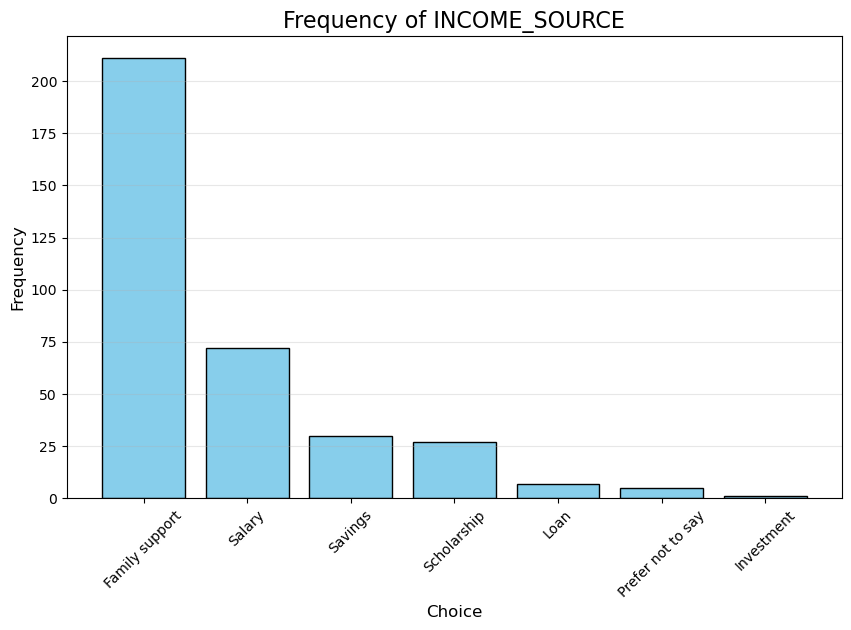

In [26]:
#Frequency of splitted choices: "INCOME_SOURCE"
income_source_data = DEMO_dataset['INCOME_SOURCE'].dropna()
INCOME_SOURCE_all_choices = income_source_data.str.split(',')
flat_choices_is = [item.strip() for sublist in INCOME_SOURCE_all_choices for item in sublist]
is_counts = Counter(flat_choices_is)

choice_df = pd.DataFrame(is_counts.items(), columns=['Choice', 'Frequency'])
plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of INCOME_SOURCE', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation = 45)
plt.show()

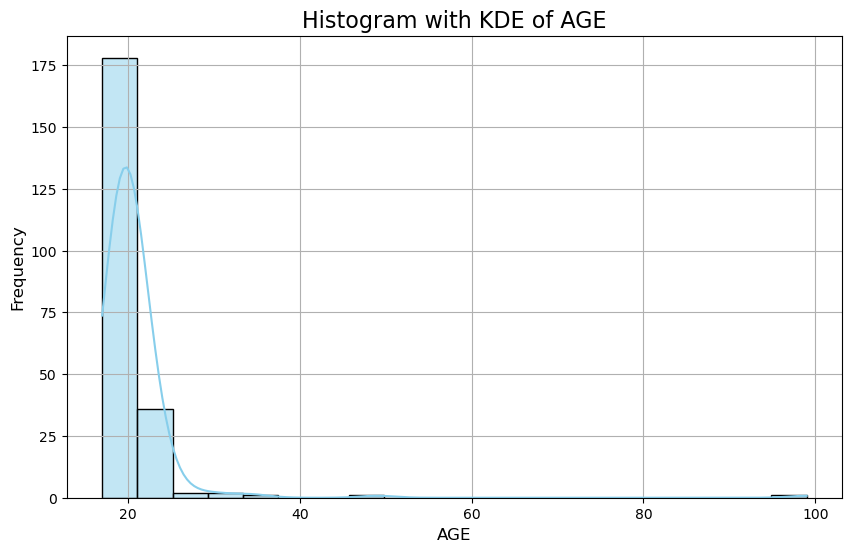

In [27]:
#CV: AGE
plt.figure(figsize=(10, 6))
sns.histplot(DEMO_dataset['AGE'], kde=True, color='skyblue', bins=20)
plt.title('Histogram with KDE of AGE', fontsize=16)
plt.xlabel('AGE', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

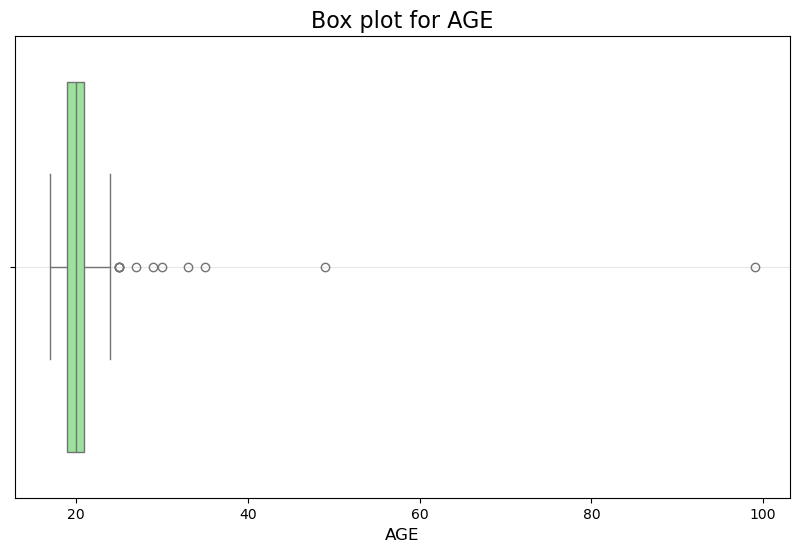

In [28]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=DEMO_dataset['AGE'], color='lightgreen')
plt.title('Box plot for AGE', fontsize=16)
plt.xlabel('AGE', fontsize=12)
plt.grid(True, axis='y', alpha=0.3)
plt.show()

In [29]:
DEMO_dataset['AGE'].describe()

count    221.000000
mean      20.728507
std        6.091615
min       17.000000
25%       19.000000
50%       20.000000
75%       21.000000
max       99.000000
Name: AGE, dtype: float64

In [30]:
#Clean outliers
data_age = DEMO_dataset.copy()
data_age = data_age.dropna(subset=["AGE"])

data_age = data_age[data_age["AGE"] < 40].reset_index(drop=True)

In [31]:
data_age['AGE'].describe()

count    219.000000
mean      20.242009
std        2.332630
min       17.000000
25%       19.000000
50%       20.000000
75%       21.000000
max       35.000000
Name: AGE, dtype: float64

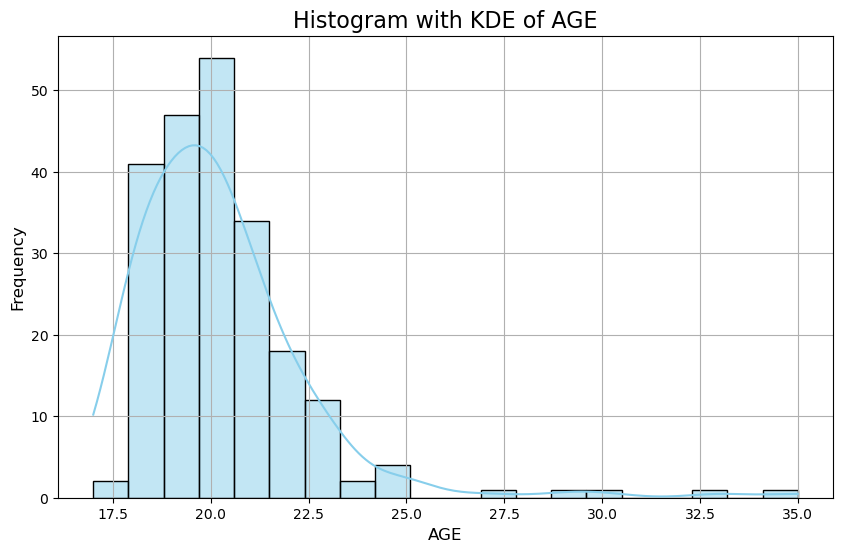

In [32]:
plt.figure(figsize=(10, 6))
sns.histplot(data_age['AGE'], kde=True, color='skyblue', bins=20)
plt.title('Histogram with KDE of AGE', fontsize=16)
plt.xlabel('AGE', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/414990641.py:8: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', label='Normal Distribution Fit', color='red')


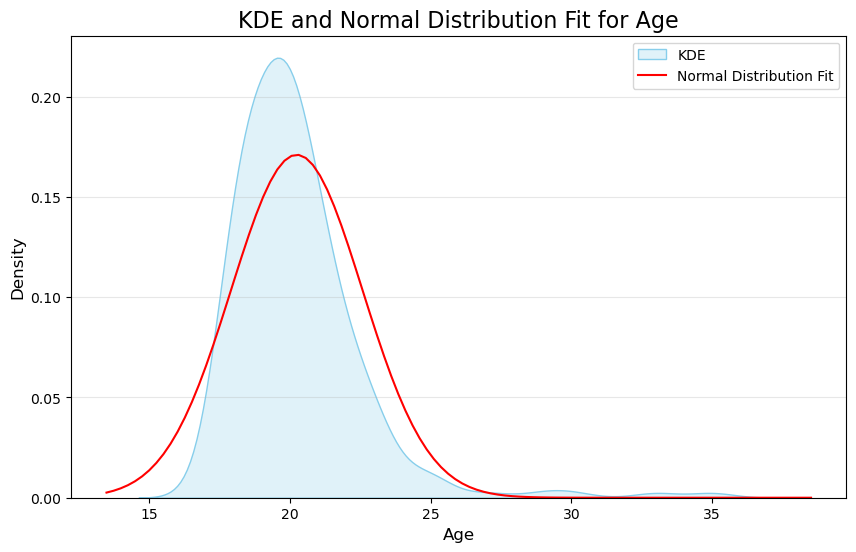

In [33]:
#AGE is collected as integers

plt.figure(figsize=(10, 6))
sns.kdeplot(data_age['AGE'].dropna(), color='skyblue', fill=True, label='KDE')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, data_age['AGE'].mean(), data_age['AGE'].std())
plt.plot(x, p, 'k', label='Normal Distribution Fit', color='red')
plt.title('KDE and Normal Distribution Fit for Age', fontsize=16)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend()
plt.grid(True, axis='y', alpha=0.3)
plt.show()

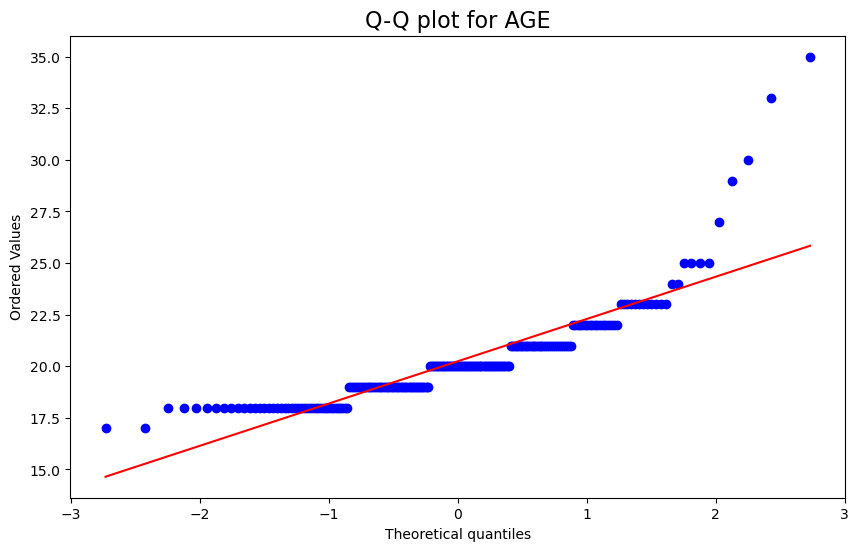

In [34]:
data_age = data_age.dropna(subset=["AGE"])
data_age["AGE"] = pd.to_numeric(data_age["AGE"], errors='coerce')

data_age = data_age.dropna(subset=["AGE"])

plt.figure(figsize=(10, 6))
stats.probplot(data_age["AGE"], dist="norm", plot=plt)
plt.title('Q-Q plot for AGE', fontsize=16)
plt.show()

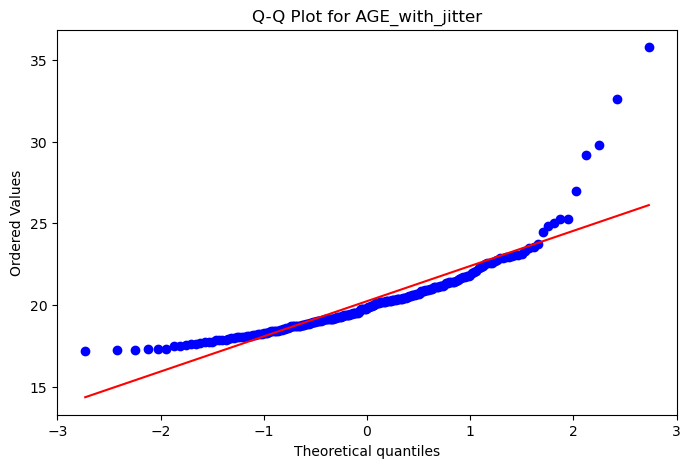

In [35]:
#Add jitter to AGE
np.random.seed(42)
data_age['AGE_with_jitter'] = data_age['AGE'] + np.random.normal(0, 0.5, size=len(data_age))

plt.figure(figsize=(8, 5))
stats.probplot(data_age['AGE_with_jitter'], dist="norm", plot=plt)
plt.title('Q-Q Plot for AGE_with_jitter')
plt.show()

In [36]:
shapiro_test = shapiro(data_age['AGE_with_jitter'])
print(f"Shapiro-Wilk Test Statistic: {shapiro_test.statistic}, p-value: {shapiro_test.pvalue}")

kstest_result = kstest(data_age['AGE_with_jitter'], 'norm', args=(data_age['AGE_with_jitter'].mean(), data_age['AGE_with_jitter'].std()))
print(f"Kolmogorov-Smirnov Test Statistic: {kstest_result.statistic}, p-value: {kstest_result.pvalue}")

Shapiro-Wilk Test Statistic: 0.7994028996673309, p-value: 4.536641368841173e-16
Kolmogorov-Smirnov Test Statistic: 0.12036479432506231, p-value: 0.003191949490969404


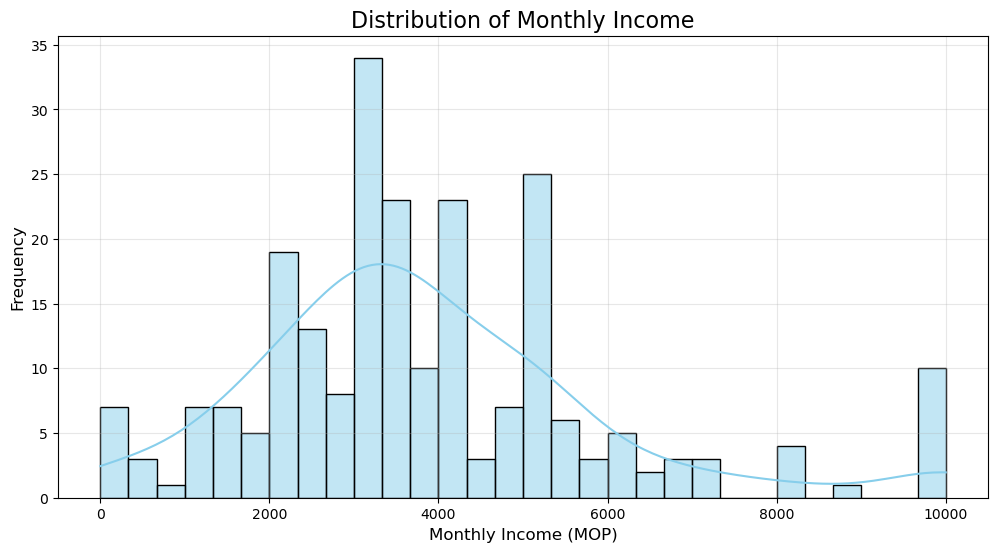

In [37]:
plt.figure(figsize=(12, 6))
sns.histplot(DEMO_dataset['INCOME'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Monthly Income', fontsize=16)
plt.xlabel('Monthly Income (MOP)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

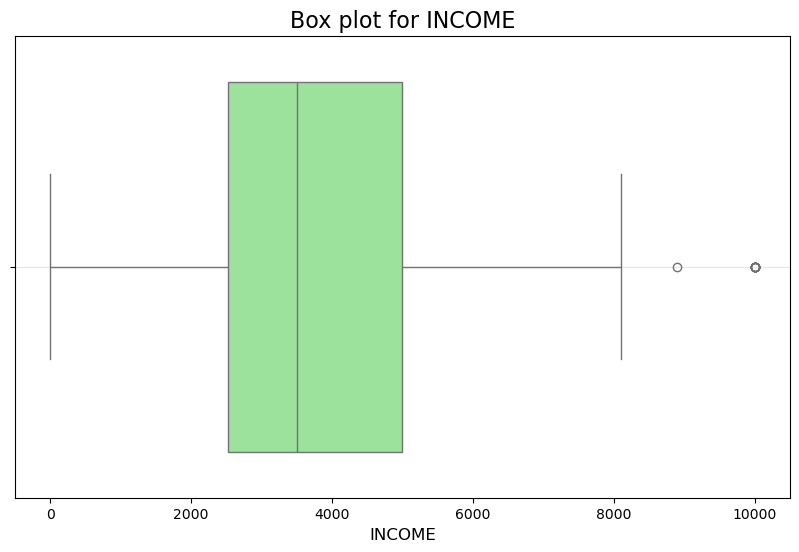

In [38]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=DEMO_dataset['INCOME'], color='lightgreen')
plt.title('Box plot for INCOME', fontsize=16)
plt.xlabel('INCOME', fontsize=12)
plt.grid(True, axis='y', alpha=0.3)
plt.show()

In [39]:
DEMO_dataset['INCOME'].describe()

count      232.000000
mean      3849.297414
std       2095.803459
min          0.000000
25%       2521.500000
50%       3502.500000
75%       5000.000000
max      10000.000000
Name: INCOME, dtype: float64

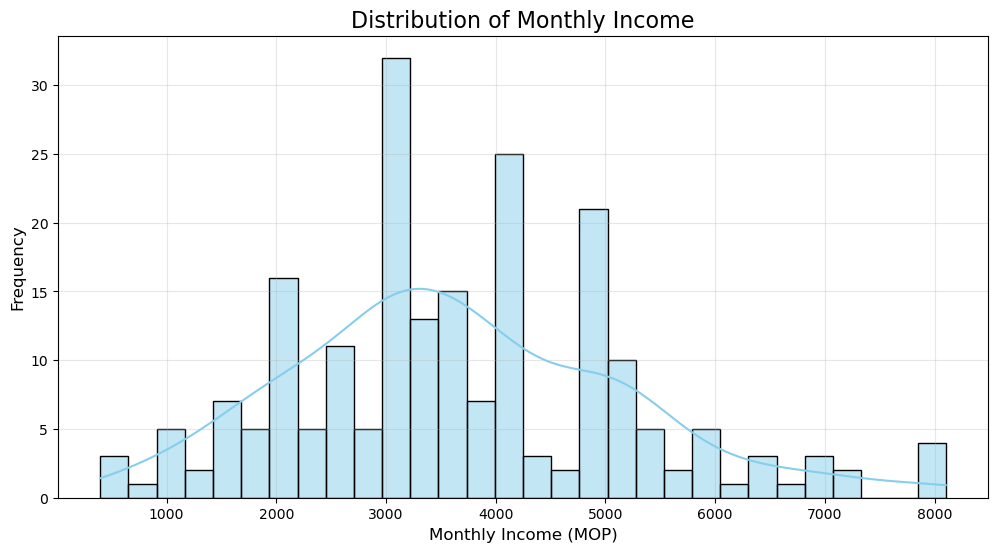

In [40]:
data_income = DEMO_dataset.copy()
data_income = data_income.dropna(subset=["INCOME"])
data_income["INCOME"] = pd.to_numeric(data_income["INCOME"], errors='coerce')

data_income = data_income[(data_income["INCOME"] > 100) & (data_income["INCOME"] < 8500)].reset_index(drop=True)

plt.figure(figsize=(12, 6))
sns.histplot(data_income['INCOME'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Monthly Income', fontsize=16)
plt.xlabel('Monthly Income (MOP)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/3335222381.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', label='Normal Distribution Fit', color='red')


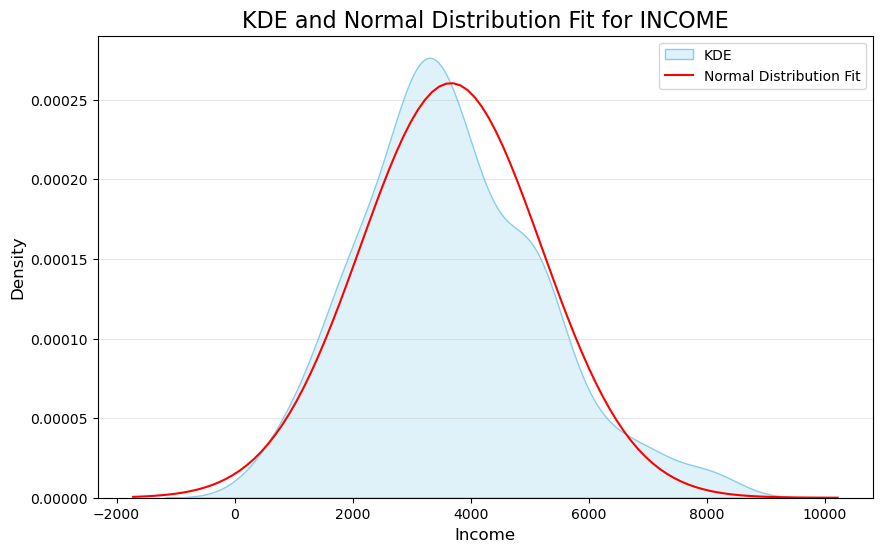

In [41]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data_income['INCOME'].dropna(), color='skyblue', fill=True, label='KDE')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, data_income['INCOME'].mean(), data_income['INCOME'].std())
plt.plot(x, p, 'k', label='Normal Distribution Fit', color='red')
plt.title('KDE and Normal Distribution Fit for INCOME', fontsize=16)
plt.xlabel('Income', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend()
plt.grid(True, axis='y', alpha=0.3)
plt.show()

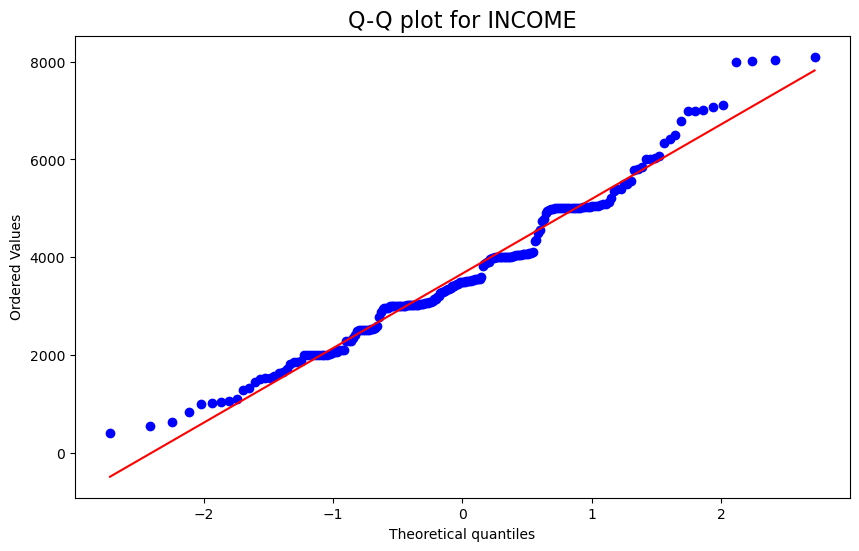

In [42]:
data_income = data_income.dropna(subset=["INCOME"])
data_income["INCOME"] = pd.to_numeric(data_income["INCOME"], errors='coerce')

data_income = data_income.dropna(subset=["INCOME"])

plt.figure(figsize=(10, 6))
stats.probplot(data_income["INCOME"], dist="norm", plot=plt)
plt.title('Q-Q plot for INCOME', fontsize=16)
plt.show()

In [43]:
shapiro_test = shapiro(data_income['INCOME'])
print(f"Shapiro-Wilk Test Statistic: {shapiro_test.statistic}, p-value: {shapiro_test.pvalue}")

kstest_result = kstest(data_income['INCOME'], 'norm', args=(data_income['INCOME'].mean(), data_income['INCOME'].std()))
print(f"Kolmogorov-Smirnov Test Statistic: {kstest_result.statistic}, p-value: {kstest_result.pvalue}")

Shapiro-Wilk Test Statistic: 0.97500174012882, p-value: 0.0007491015925940995
Kolmogorov-Smirnov Test Statistic: 0.0951210766699101, p-value: 0.038900485366602844


In [44]:
#boxcox transform
data_income['INCOME_boxcox'], lam = boxcox(data_income['INCOME'] + 1e-3)
print(f"Box-Cox Lambda: {lam}")

shapiro_test_boxcox = shapiro(data_income['INCOME_boxcox'])
print(f"Shapiro-Wilk Test (Box-Cox Transformed): Test Statistic = {shapiro_test_boxcox.statistic}, p-value = {shapiro_test_boxcox.pvalue}")

Box-Cox Lambda: 0.6258416675405485
Shapiro-Wilk Test (Box-Cox Transformed): Test Statistic = 0.9896331988840861, p-value = 0.12653705475015348


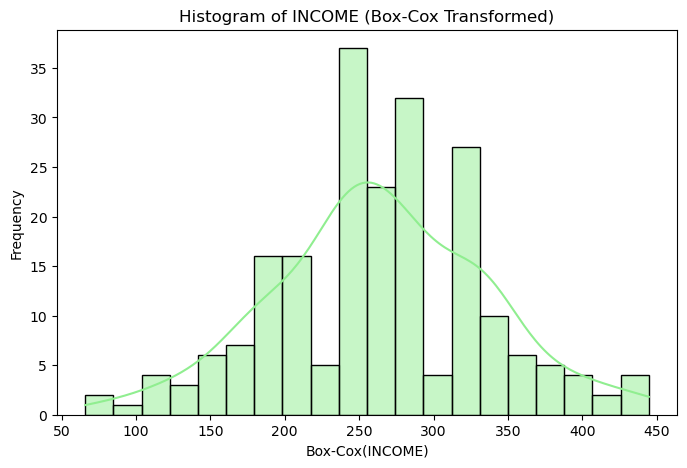

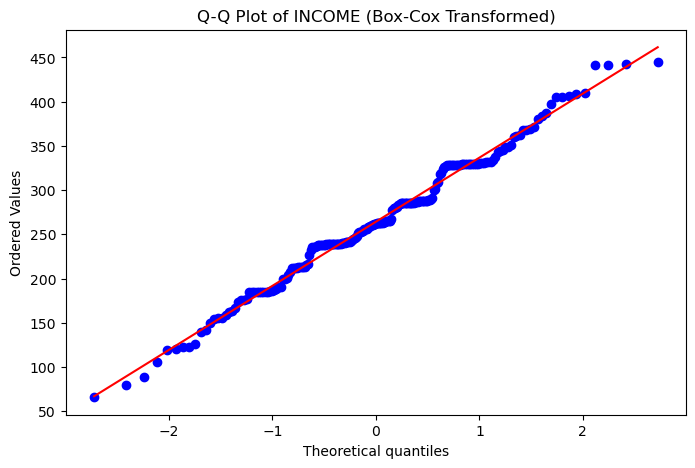

In [45]:
plt.figure(figsize=(8, 5))
sns.histplot(data_income['INCOME_boxcox'], kde=True, bins=20, color='lightgreen', edgecolor='black')
plt.title('Histogram of INCOME (Box-Cox Transformed)')
plt.xlabel('Box-Cox(INCOME)')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(8, 5))
stats.probplot(data_income['INCOME_boxcox'], dist="norm", plot=plt)
plt.title('Q-Q Plot of INCOME (Box-Cox Transformed)')
plt.show()

In [46]:
#Encoding rules
coding_FERT = {
    'FERT-0': 'R_MARR_STATUS', 'FERT-0_6_TEXT': 'MARR_STATUS_Other', 'FERT-1': 'PLAN_FERT',
    'FERT-2': 'PARTNER_PLAN_FERT', 'FERT-3': 'SCALE_PLAN_FERT', 'FERT-4': 'CHILD_NUM', 'FERT-4_7_TEXT': 'CHILD_NUM_Other',
    'FERT-5': 'DISCUSS_CHILD', 'FERT-6_1': 'BEST_FERT_AGE', 'FERT-7': 'CHILD_GEN', 'FERT-7_5_TEXT': 'CHILD_GEN_Other', 'FERT-8': 'FACTOR_FERT_PLAN',
    'FERT-8_10_TEXT': 'FACTOR_FERT_PLAN_Other', 'FERT-9': 'FERT_PURPOSE', 'FERT-9_9_TEXT': 'FERT_PURPOSE_Other', 'FERT-10': 'FERT_VALUE', 'FERT-11': 'FERT_CAREER',
    'FERT-12': 'WHO_PARENT', 'FERT-12_6_TEXT': 'WHO_PARENT_Other', 'FERT-13': 'CHILD_NUM_INFLUENCE', 'FERT-14': 'PARENT_RESPONS', 'FERT-14_6_TEXT': 'PARENT_RESPONS_Other',
    'FERT-15': 'FACTOR_FERT', 'FERT-15_6_TEXT': 'FACTOR_FERT_Other'
}

#Note that this function will change the name of columns directly 
def coding_datasets(datasets, rule):
    if isinstance(datasets, pd.DataFrame):
        datasets = [datasets]
        
    for dataset in datasets:
        dataset.rename(columns=rule, inplace=True)

coding_datasets(A_r, coding_FERT)

In [47]:
#Specify rules to combine datasets
FERT_rule = ['Duration(inseconds)', 'Progress', 'ResponseId', 'R_MARR_STATUS', 'MARR_STATUS_Other',
       'PLAN_FERT', 'PARTNER_PLAN_FERT', 'SCALE_PLAN_FERT', 'CHILD_NUM',
       'CHILD_NUM_Other', 'DISCUSS_CHILD', 'BEST_FERT_AGE', 'CHILD_GEN',
       'CHILD_GEN_Other', 'FACTOR_FERT_PLAN', 'FACTOR_FERT_PLAN_Other',
       'FERT_PURPOSE', 'FERT_PURPOSE_Other', 'FERT_VALUE', 'FERT_CAREER',
       'WHO_PARENT', 'WHO_PARENT_Other', 'CHILD_NUM_INFLUENCE',
       'PARENT_RESPONS', 'PARENT_RESPONS_Other', 'FACTOR_FERT',
       'FACTOR_FERT_Other']

def get_combined(datasets, rule):
    if not isinstance(datasets, list):
        datasets = [datasets]
    filtered_datasets = []
    
    for dataset in datasets:
        filtered_datasets.append(dataset[rule])

    combined_dataset = pd.concat(filtered_datasets, ignore_index=True)

    return combined_dataset

FERT_dataset = get_combined(F_r, FERT_rule)

In [48]:
remove_non_numeric_rows(FERT_dataset, "Duration(inseconds)")

#Delete responses whose progress is less than 30
FERT_dataset["Progress"] = pd.to_numeric(DEMO_dataset["Progress"], errors="coerce")
FERT_dataset = FERT_dataset[(FERT_dataset["Progress"] >= 30) & (FERT_dataset["Duration(inseconds)"] >= 60)]
FERT_dataset.reset_index(drop=True, inplace=True)

remove_empty_columns(FERT_dataset)
handle_other_columns(FERT_dataset)

FERT_dataset

,Duration(inseconds),Progress,ResponseId,R_MARR_STATUS,PLAN_FERT,PARTNER_PLAN_FERT,SCALE_PLAN_FERT,CHILD_NUM,DISCUSS_CHILD,BEST_FERT_AGE,CHILD_GEN,FACTOR_FERT_PLAN,FERT_PURPOSE,FERT_VALUE,FERT_CAREER,WHO_PARENT,CHILD_NUM_INFLUENCE,PARENT_RESPONS,FACTOR_FERT
0,447.0,100,R_47s5DedX78LLBVS,單身,也許或也許不,NaN,4,1個,NaN,27,是，偏好女孩,"經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本,政策及社會保障（如育兒補貼、教育政策等）,個人生活目標或價值觀,子女性別或數量偏好",生育不應關於目的,一般,有消極影響,父母共同分擔,可能有消極影響,"提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障,鼓勵子女的自立和自信","自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況,子女的教育和成長環境"
1,295.0,100,R_4Ca2zvmoQSUMBpZ,戀愛中,可能是,可能是,8,1個,很少討論,28,沒有特定偏好,"經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本,政策及社會保障（如育兒補貼、教育政策等）,個人生活目標或價值觀","延續家庭血脈,增加家庭成員，豐富家庭生活,為晚年生活提供保障",比較重要,不確定,父母共同分擔,有積極影響，但子女人數適中為佳,"提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障,鼓勵子女的自立和自信","自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況,子女的教育和成長環境"
2,310.0,100,R_61yGq0BbR3mQUIA,單身,可能是,NaN,5,2個,NaN,28,沒有特定偏好,"經濟狀況,伴侶或家庭支持,健康狀況,生活品質,教育及撫養成本","體驗為人父母的生活,增加家庭成員，豐富家庭生活",比較重要,不確定,父母共同分擔,有積極影響，但子女人數適中為佳,"提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障,鼓勵子女的自立和自信","自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況,子女的教育和成長環境"
3,292.0,100,R_4doQaomT3baf8x1,單身,可能是,NaN,6,2個,NaN,30,沒有特定偏好,"經濟狀況,職業發展,健康狀況,教育及撫養成本","增加家庭成員，豐富家庭生活,為晚年生活提供保障,配合伴侶的意願",一般,沒有影響,主力由母親負責,有積極影響，但子女人數適中為佳,"提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障","自身經濟狀況,工作穩定性和職業前景,健康狀況,子女的教育和成長環境"
4,265.0,100,R_4hYhfQvgjU3c7Nh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,493.0,100,R_4GHXi48OWR2YIaR,戀愛中,肯定不,肯定是,2,1個,很少討論,29,是，偏好女孩,"經濟狀況,職業發展,健康狀況,生活品質,教育及撫養成本",生育不應關於目的,不太重要,有消極影響,父母共同分擔,可能有消極影響,"提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障,鼓勵子女的自立和自信","自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況"
6,115.0,100,R_4iSRf3iurNKVv1v,單身,不願透露,NaN,5,2個,NaN,24,不願透露,經濟狀況,生育不應關於目的,非常重要,有積極影響,父母共同分擔,有積極影響，子女越多越幸福,提供良好的生活和教育環境,自身經濟狀況
7,293.0,100,R_43rkgAEB7SiiDbX,單身,肯定不,NaN,3,0個,NaN,28,沒有特定偏好,"經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本,政策及社會保障（如育兒補貼、教育政策等）,個人生活目標或價值觀",生育不應關於目的,一般,有消極影響,父母共同分擔,沒有影響,"提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女創造經濟保障","自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況"
8,232.0,100,R_4POfxETmlBmGfAf,單身,肯定是,NaN,8,2個,NaN,26,沒有特定偏好,"經濟狀況,伴侶或家庭支持,健康狀況,生活品質,教育及撫養成本","延續家庭血脈,增加家庭成員，豐富家庭生活,為晚年生活提供保障,滿足社會或家庭的期望",比較重要,有消極影響,父母共同分擔,有積極影響，但子女人數適中為佳,"提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障,鼓勵子女的自立和自信","自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況,子女的教育和成長環境"
9,219.0,100,R_4UWmj0iN8D45TNv,單身,肯定不,NaN,0,0個,NaN,NaN,沒有特定偏好,個人生活目標或價值觀,為晚年生活提供保障,沒有價值,有消極影響,保姆或其他專業人士,可能有消極影響,為子女創造經濟保障,"自身經濟狀況,工作穩定性和職業前景,健康狀況"


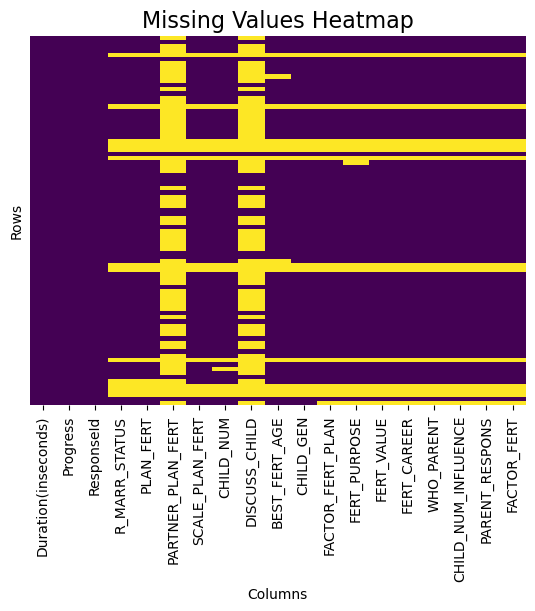

In [49]:
visualize_nan(FERT_dataset, FERT_dataset.columns)

In [50]:
FERT_dataset["SCALE_PLAN_FERT"] = pd.to_numeric(FERT_dataset["SCALE_PLAN_FERT"], errors="coerce")
FERT_dataset["BEST_FERT_AGE"] = pd.to_numeric(FERT_dataset["BEST_FERT_AGE"], errors="coerce")

In [51]:
FERT_dataset.dtypes

Duration(inseconds)    float64
Progress                 int64
ResponseId              object
R_MARR_STATUS           object
PLAN_FERT               object
PARTNER_PLAN_FERT       object
SCALE_PLAN_FERT        float64
CHILD_NUM               object
DISCUSS_CHILD           object
BEST_FERT_AGE          float64
CHILD_GEN               object
FACTOR_FERT_PLAN        object
FERT_PURPOSE            object
FERT_VALUE              object
FERT_CAREER             object
WHO_PARENT              object
CHILD_NUM_INFLUENCE     object
PARENT_RESPONS          object
FACTOR_FERT             object
dtype: object

In [52]:
#Mapping of answers
R_MARR_STATUS_map = {'單身': 'Single', '戀愛中': 'In a relationship', '不願透露': 'Prefer not to say', '訂婚/已婚': 'Engaged/Married',
                     '<label data-runtime-class-q-checked="runtime.Choices.1.Selected" for="QR~QID33~1" id="QID33-1-label">Single': 'Single',
                     '<label data-runtime-class-q-checked="runtime.Choices.2.Selected" for="QR~QID33~2" id="QID33-2-label">In a relationship': 'In a relationship'}
FERT_dataset.loc[:, "R_MARR_STATUS"] = FERT_dataset["R_MARR_STATUS"].replace(R_MARR_STATUS_map)

PLAN_FERT_map = {
    '也許或也許不': 'I am not sure', '可能是': 'Maybe yes', '肯定不': 'Absolutely not', '不願透露': 'Prefer not to say', '肯定是': 'Yes, definitely'
}
FERT_dataset.loc[:, "PLAN_FERT"] = FERT_dataset["PLAN_FERT"].replace(PLAN_FERT_map)

PARTNER_PLAN_FERT_map = {
    '可能是': 'Maybe yes', '肯定是': 'Yes, definitely', '也許或也許不': 'I am not sure'
}
FERT_dataset.loc[:, "PARTNER_PLAN_FERT"] = FERT_dataset["PARTNER_PLAN_FERT"].replace(PARTNER_PLAN_FERT_map)

SCALE_PLAN_FERT_map = {
    '可能是': 'Maybe yes', '肯定是': 'Yes, definitely', '也許或也許不': 'I am not sure'
}
FERT_dataset.loc[:, "SCALE_PLAN_FERT"] = FERT_dataset["SCALE_PLAN_FERT"].replace(SCALE_PLAN_FERT_map)

CHILD_NUM_map = {
    '1個': '1', '2個': '2', '0個': '0'
}
FERT_dataset.loc[:, "CHILD_NUM"] = FERT_dataset["CHILD_NUM"].replace(CHILD_NUM_map)
FERT_dataset["CHILD_NUM"] = pd.to_numeric(FERT_dataset["CHILD_NUM"], errors="coerce")

DISCUSS_CHILD_map = {
    '很少討論': 'We rarely discuss it', '是，我們經常討論': 'Yes, we discuss it frequently'
}
FERT_dataset.loc[:, "DISCUSS_CHILD"] = FERT_dataset["DISCUSS_CHILD"].replace(DISCUSS_CHILD_map)

CHILD_GEN_map = {
    '是，偏好女孩': 'Yes, I prefer girl', '沒有特定偏好': 'No special preference', '不願透露': 'Prefer not to say', '一男一女': 'No special preference'
}
FERT_dataset.loc[:, "CHILD_GEN"] = FERT_dataset["CHILD_GEN"].replace(CHILD_GEN_map)

FACTOR_FERT_PLAN_map = {
    '經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本,政策及社會保障（如育兒補貼、教育政策等）,個人生活目標或價值觀,子女性別或數量偏好': 'Financial situation,Support from family or partner,Career and work development,Life quality,Cost of education and parenting,Policies and social security (such as childcare subsidies, education policies, etc.),Personal life goals or values,Preference for the gender or number of children',
       '經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本,政策及社會保障（如育兒補貼、教育政策等）,個人生活目標或價值觀': 'Financial situation,Support from family or partner,Career and work development,Health state,Life quality,Cost of education and parenting,Policies and social security (such as childcare subsidies, education policies, etc.),Personal life goals or values',
       '經濟狀況,伴侶或家庭支持,健康狀況,生活品質,教育及撫養成本': 'Financial situation,Support from family or partner,Health state,Life quality,Cost of education and parenting', 
       '經濟狀況,職業發展,健康狀況,教育及撫養成本': 'Financial situation,Career and work development,Health state,Cost of education and parenting',
       '經濟狀況,職業發展,健康狀況,生活品質,教育及撫養成本': 'Financial situation,Career and work development,Health state,Life quality,Cost of education and parenting', 
       '經濟狀況': 'Financial situation', '個人生活目標或價值觀': 'Personal life goals or values',
       '經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本': 'Financial situation,Support from family or partner,Career and work development,Health state,Life quality,Cost of education and parenting', 
       '伴侶或家庭支持,健康狀況,生活品質': 'Support from family or partner,Health state,Life quality',
       '教育及撫養成本,個人生活目標或價值觀': 'Cost of education and parenting,Personal life goals or values', 
       '政策及社會保障（如育兒補貼、教育政策等）': 'Policies and social security (such as childcare subsidies, education policies, etc.)',
       '經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本,個人生活目標或價值觀': 'Financial situation,Support from family or partner,Career and work development,Health state,Life quality,Cost of education and parenting,Personal life goals or values', 
       '其他（請在下方欄註明）': np.nan,
       '經濟狀況,健康狀況,教育及撫養成本':'Financial situation,Health state,Cost of education and parenting',
       '經濟狀況,伴侶或家庭支持,職業發展,生活品質,個人生活目標或價值觀': 'Financial situation,Support from family or partner,Career and work development,Life quality,Personal life goals or values',
       '經濟狀況,職業發展,個人生活目標或價值觀': 'Financial situation,Career and work development,Personal life goals or values', 
       '經濟狀況,伴侶或家庭支持,職業發展,健康狀況,教育及撫養成本': 'Financial situation,Support from family or partner,Career and work development,Health state,Cost of education and parenting',
       '經濟狀況,職業發展,健康狀況': 'Financial situation,Career and work development,Health state', 
       '經濟狀況,伴侶或家庭支持,職業發展,健康狀況':'Financial situation,Support from family or partner,Career and work development,Health state',
       '經濟狀況,伴侶或家庭支持,職業發展,健康狀況,生活品質,教育及撫養成本,政策及社會保障（如育兒補貼、教育政策等）': 'Financial situation,Support from family or partner,Career and work development,Health state,Life quality,Cost of education and parenting,Policies and social security (such as childcare subsidies, education policies, etc.)'
}
FERT_dataset.loc[:, "FACTOR_FERT_PLAN"] = FERT_dataset["FACTOR_FERT_PLAN"].replace(FACTOR_FERT_PLAN_map)

FERT_PURPOSE_map = {
    '生育不應關於目的': 'It is not about goal', 
    '延續家庭血脈,增加家庭成員，豐富家庭生活,為晚年生活提供保障': 'Continue the family line,Increase family members and enrich family life,Provide security for old age',
    '體驗為人父母的生活,增加家庭成員，豐富家庭生活': 'Experience parenthood,Increase family members and enrich family life', 
    '增加家庭成員，豐富家庭生活,為晚年生活提供保障,配合伴侶的意願': "Experience parenthood,Increase family members and enrich family life,Provide security for old age,Align with the partner's wishes",
    '延續家庭血脈,增加家庭成員，豐富家庭生活,為晚年生活提供保障,滿足社會或家庭的期望': 'Continue the family line,Increase family members and enrich family life,Provide security for old age,Meet social or family expectations', 
    '為晚年生活提供保障': 'Provide security for old age',
    '生育不應關於目的,體驗為人父母的生活,增加家庭成員，豐富家庭生活,配合伴侶的意願,滿足社會或家庭的期望': "It is not about goal,Experience parenthood,Increase family members and enrich family life,Align with the partner's wishes,Meet social or family expectations",
    '體驗為人父母的生活,增加家庭成員，豐富家庭生活,個人成就感或人生使命': 'Experience parenthood,Increase family members and enrich family life,Personal fulfillment or life mission', 
    '個人成就感或人生使命':'Personal fulfillment or life mission', 
    '其他（請在下方欄註明）': np.nan,
    '生育不應關於目的,增加家庭成員，豐富家庭生活,為晚年生活提供保障': 'It is not about goal,Increase family members and enrich family life,Provide security for old age', 
    '滿足社會或家庭的期望': 'Meet social or family expectations',
    '延續家庭血脈,增加家庭成員，豐富家庭生活':'Continue the family line,Increase family members and enrich family life',
    '喜欢小孩子': 'Experience parenthood', 'Love': "Align with the partner's wishes"
}
FERT_dataset.loc[:, "FERT_PURPOSE"] = FERT_dataset["FERT_PURPOSE"].replace(FERT_PURPOSE_map)

FERT_VALUE_map = {
    '一般': 'Average', '比較重要': 'Relatively important', '不太重要': 'Not very important', '非常重要': 'Very important', '沒有價值':'No value'}
FERT_dataset.loc[:, "FERT_VALUE"] = FERT_dataset["FERT_VALUE"].replace(FERT_VALUE_map)

FERT_CAREER_map = {
    '有消極影響': 'Negative impact', '不確定': 'Not sure', '沒有影響': 'No impact', '有積極影響': 'Positive impact'}
FERT_dataset.loc[:, "FERT_CAREER"] = FERT_dataset["FERT_CAREER"].replace(FERT_CAREER_map)

WHO_PARENT_map = {
    '父母共同分擔': 'Both parents', '主力由母親負責': 'Primarily the mother', '保姆或其他專業人士': 'Nannies or other professionals'}
FERT_dataset.loc[:, "WHO_PARENT"] = FERT_dataset["WHO_PARENT"].replace(WHO_PARENT_map)

CHILD_NUM_INFLUENCE_map = {
    '可能有消極影響': 'May have a negative impact', 
    '有積極影響，但子女人數適中為佳': 'Positive impact, but an moderate number. of children is the best',
    '有積極影響，子女越多越幸福': 'Positive impact; the more children, the happier the family', 
    '沒有影響': 'No impact', '不確定': 'Not sure'}
FERT_dataset.loc[:, "CHILD_NUM_INFLUENCE"] = FERT_dataset["CHILD_NUM_INFLUENCE"].replace(CHILD_NUM_INFLUENCE_map)

PARENT_RESPONS_map = {
       '提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障,鼓勵子女的自立和自信': "Provide good living and educational environment,Support the development of children's personalities and interests,Become a moral example for children,Create economic security for children,Encourage children's independence and self-confidence",
       '提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女樹立道德榜樣,為子女創造經濟保障':"Provide good living and educational environment,Support the development of children's personalities and interests,Become a moral example for children,Create economic security for children",
       '提供良好的生活和教育環境': 'Provide good living and educational environment', 
       '提供良好的生活和教育環境,支持子女個性和興趣的發展,為子女創造經濟保障': "Provide good living and educational environment,Support the development of children's personalities and interests,Create economic security for children", 
       '為子女創造經濟保障': "Create economic security for children",
       '其他（請在下方欄註明）': np.nan, 
       '提供良好的生活和教育環境,為子女樹立道德榜樣,鼓勵子女的自立和自信': "Provide good living and educational environment,Become a moral example for children,Encourage children's independence and self-confidence",
       '提供良好的生活和教育環境,支持子女個性和興趣的發展': "Provide good living and educational environment,Support the development of children's personalities and interests"
}
FERT_dataset.loc[:, "PARENT_RESPONS"] = FERT_dataset["PARENT_RESPONS"].replace(PARENT_RESPONS_map)

FACTOR_FERT_map = {
       '自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況,子女的教育和成長環境': 'Personal financial situation,Support level from partner and family,Job stability and career prospects,Health status,Education and growth environment for children',
       '自身經濟狀況,工作穩定性和職業前景,健康狀況,子女的教育和成長環境': 'Personal financial situation,Job stability and career prospects,Health status,Education and growth environment for children',
       '自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景,健康狀況': 'Personal financial situation,Support level from partner and family,Job stability and career prospects,Health status', 
       '自身經濟狀況': 'Personal financial situation',
       '自身經濟狀況,工作穩定性和職業前景,健康狀況': 'Personal financial situation,Job stability and career prospects,Health status', 
       '自身經濟狀況,健康狀況': 'Personal financial situation,Health status', 
       '伴侶和家庭的支持程度,健康狀況': 'Support level from partner and family,Health status',
       '自身經濟狀況,工作穩定性和職業前景,子女的教育和成長環境': 'Personal financial situation,Job stability and career prospects,Education and growth environment for children',
       '自身經濟狀況,伴侶和家庭的支持程度': 'Personal financial situation,Support level from partner and family', 
       '子女的教育和成長環境': 'Education and growth environment for children',
       '自身經濟狀況,伴侶和家庭的支持程度,工作穩定性和職業前景': 'Personal financial situation,Support level from partner and family,Job stability and career prospects'
}
FERT_dataset.loc[:, "FACTOR_FERT"] = FERT_dataset["FACTOR_FERT"].replace(FACTOR_FERT_map)

In [53]:
FERT_dataset.columns

Index(['Duration(inseconds)', 'Progress', 'ResponseId', 'R_MARR_STATUS',
       'PLAN_FERT', 'PARTNER_PLAN_FERT', 'SCALE_PLAN_FERT', 'CHILD_NUM',
       'DISCUSS_CHILD', 'BEST_FERT_AGE', 'CHILD_GEN', 'FACTOR_FERT_PLAN',
       'FERT_PURPOSE', 'FERT_VALUE', 'FERT_CAREER', 'WHO_PARENT',
       'CHILD_NUM_INFLUENCE', 'PARENT_RESPONS', 'FACTOR_FERT'],
      dtype='object')

In [54]:
#CategoricalDtype
categories_order_3 = ['Absolutely not', 'Maybe not', 'I am not sure', 'Maybe yes', 'Yes, definitely', 'Prefer not to say']
plan_fert_dtype = CategoricalDtype(categories=categories_order_3, ordered=True)
FERT_dataset['PLAN_FERT'] = FERT_dataset['PLAN_FERT'].astype(plan_fert_dtype)

categories_order_4 = ['We never discuss it', 'We rarely discuss it', 'Occasionally, we discuss it', 'Yes, we discuss it frequently']
discuss_dtype = CategoricalDtype(categories=categories_order_4, ordered=True)
FERT_dataset['DISCUSS_CHILD'] = FERT_dataset['DISCUSS_CHILD'].astype(discuss_dtype)

categories_order_5 = ['No value', 'Not very important', 'Average', 'Relatively important', 'Very important']
value_dtype = CategoricalDtype(categories=categories_order_5, ordered=True)
FERT_dataset['FERT_VALUE'] = FERT_dataset['FERT_VALUE'].astype(value_dtype)

In [55]:
options_FERT = ['R_MARR_STATUS',
       'PLAN_FERT', 'PARTNER_PLAN_FERT', 'SCALE_PLAN_FERT', 'CHILD_NUM',
       'DISCUSS_CHILD', 'BEST_FERT_AGE', 'CHILD_GEN',
       'FERT_VALUE', 'FERT_CAREER', 'WHO_PARENT',
       'CHILD_NUM_INFLUENCE']
dropdown = widgets.Dropdown(
    options=options_FERT,
    value="R_MARR_STATUS",
    description="Variable"
)
dropdown

Dropdown(description='Variable', options=('R_MARR_STATUS', 'PLAN_FERT', 'PARTNER_PLAN_FERT', 'SCALE_PLAN_FERT'…

In [56]:
#Create an iteractive drawer of DV's count plot
@interact
def display_plot(variable=dropdown):
    data_clean = FERT_dataset.dropna(subset=[variable])

    count_data = data_clean[variable].value_counts(normalize=True).reset_index()
    count_data.columns = [variable, 'percentage']
    count_data['percentage'] = (count_data['percentage'] * 100).round(2)

    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=variable, data=data_clean, palette='Set2')

    total = len(data_clean)
    for p in ax.patches:
        height = p.get_height()
        percentage = (height / total) * 100
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{percentage:.1f}%', ha='center', fontsize=12)

    plt.title(f'Distribution of {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(True, axis='y', alpha=0.3)
    plt.show()

interactive(children=(Dropdown(description='Variable', options=('R_MARR_STATUS', 'PLAN_FERT', 'PARTNER_PLAN_FE…

In [57]:
dropdown = widgets.Dropdown(
    options=options_FERT,
    value="R_MARR_STATUS",
    description="Variable"
)
@interact
def display_distribution(variable=dropdown):
    if variable not in FERT_dataset.columns:
        print(f"Invalid variable: {variable}")
        return
    
    pmf = FERT_dataset[variable].value_counts(normalize=True)
    pmf = pmf.sort_index()

    plt.figure(figsize=(10, 6))
    pmf.plot(kind='bar', color='lightgreen', edgecolor='black')
    plt.title(f'Probability Mass Function (PMF) for {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Probability', fontsize=12)
    plt.grid(True, axis='y', alpha=0.3)
    plt.xticks(rotation=90)
    plt.show()

    if variable in ['PLAN_FERT', 'DISCUSS_CHILD', 'FERT_VALUE', 'SCALE_PLAN_FERT', 'BEST_FERT_AGE']:
        cdf = pmf.cumsum()

        plt.figure(figsize=(10, 6))
        plt.step(cdf.index, cdf.values, where='mid', color='skyblue')
        plt.title(f'Cumulative Distribution Function (CDF) for {variable}', fontsize=16)
        plt.xlabel(variable, fontsize=12)
        plt.ylabel('Cumulative Probability', fontsize=12)
        plt.grid(True, axis='y', alpha=0.3)
        plt.show()

interactive(children=(Dropdown(description='Variable', options=('R_MARR_STATUS', 'PLAN_FERT', 'PARTNER_PLAN_FE…

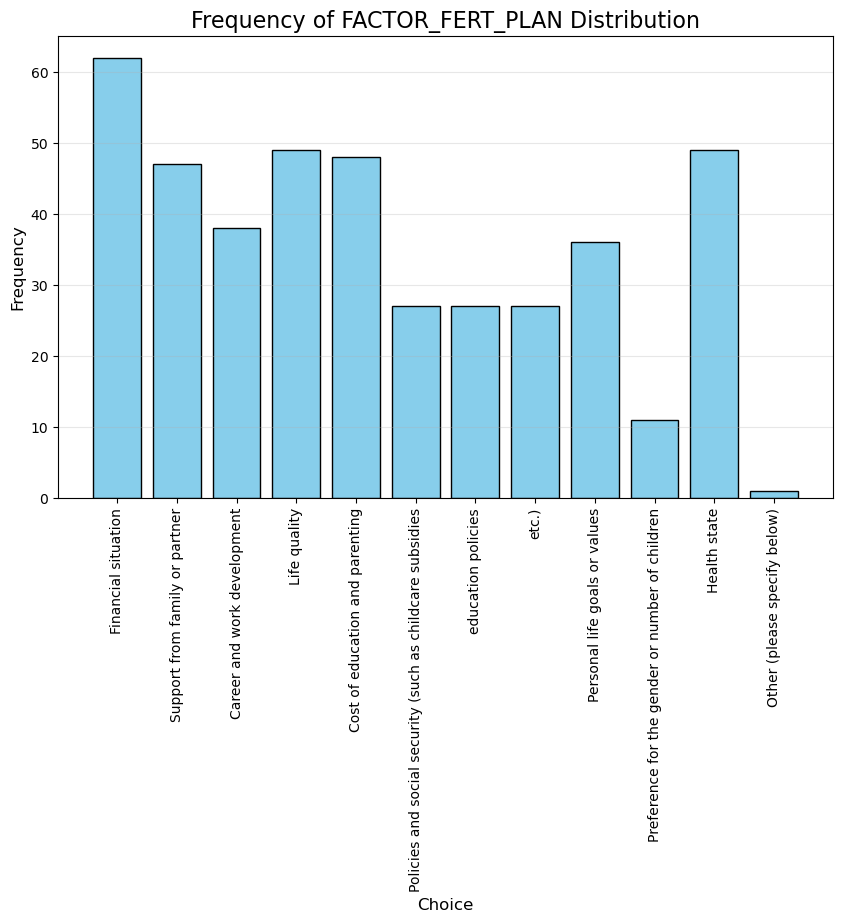

In [58]:
#Multi-selection variables 'FACTOR_FERT_PLAN', 'FERT_PURPOSE', 'PARENT_RESPONS', 'FACTOR_FERT'
FACTOR_FERT_PLAN_data = FERT_dataset['FACTOR_FERT_PLAN'].dropna()
FACTOR_FERT_PLAN_all_choices = FACTOR_FERT_PLAN_data.str.split(',')
flat_choices = [item.strip() for sublist in FACTOR_FERT_PLAN_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of FACTOR_FERT_PLAN Distribution', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

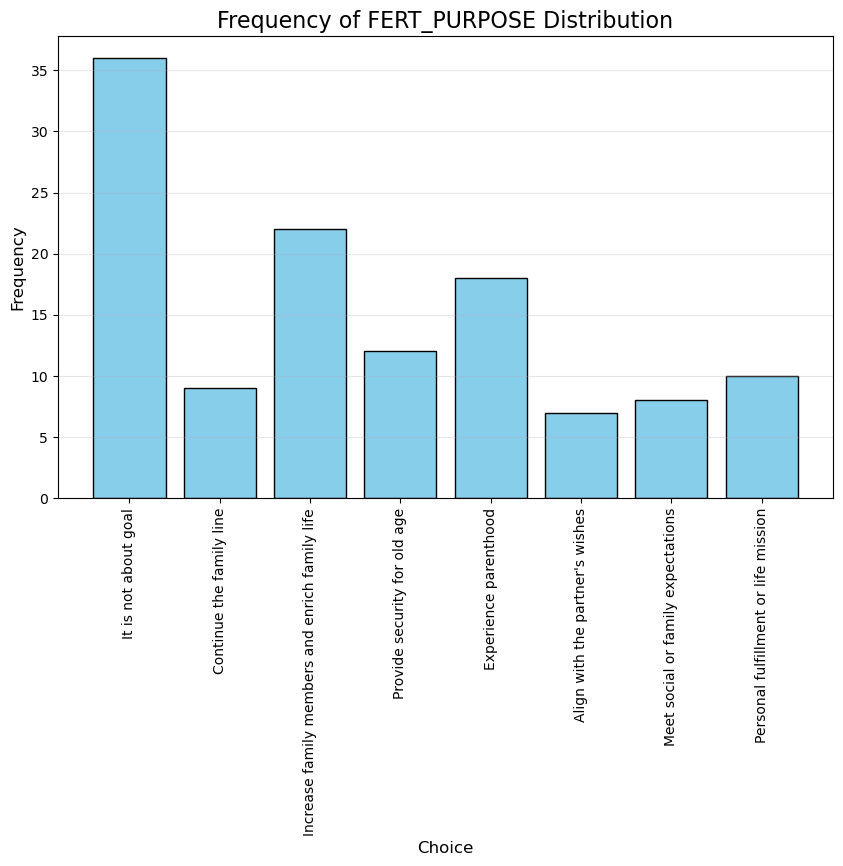

In [59]:
FERT_PURPOSE_data = FERT_dataset['FERT_PURPOSE'].dropna()
FERT_PURPOSE_all_choices = FERT_PURPOSE_data.str.split(',')
flat_choices = [item.strip() for sublist in FERT_PURPOSE_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of FERT_PURPOSE Distribution', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

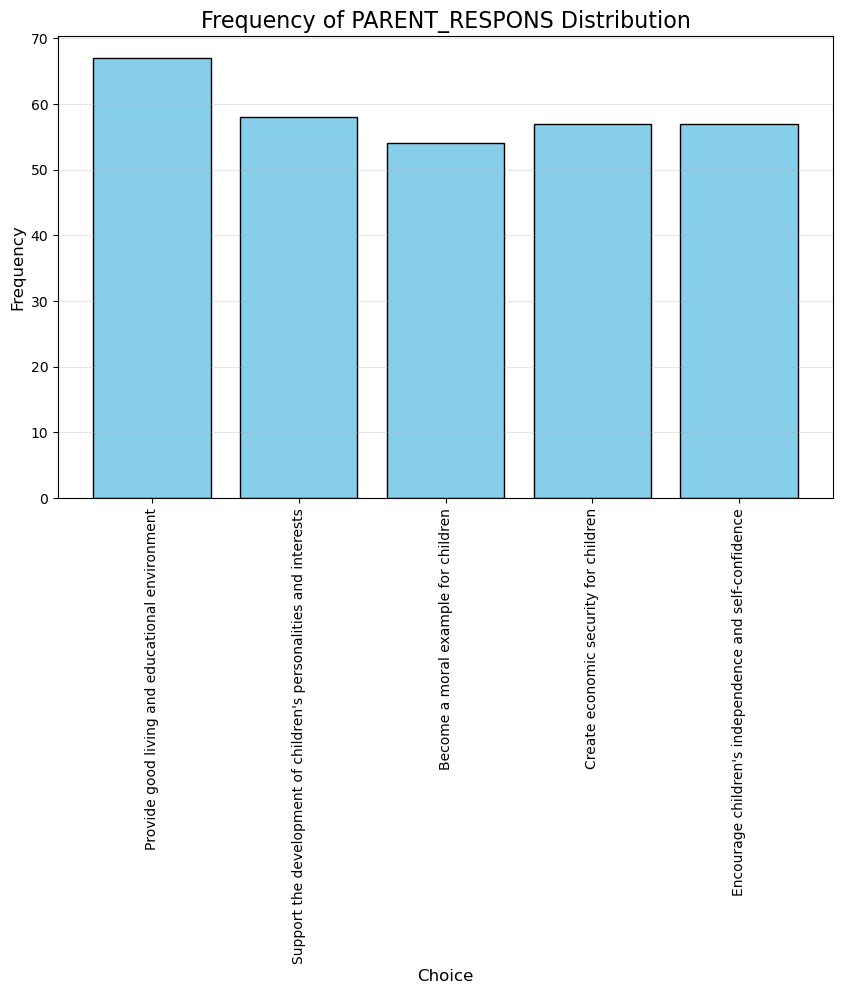

In [60]:
PARENT_RESPONS_data = FERT_dataset['PARENT_RESPONS'].dropna()
PARENT_RESPONS_all_choices = PARENT_RESPONS_data.str.split(',')
flat_choices = [item.strip() for sublist in PARENT_RESPONS_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of PARENT_RESPONS Distribution', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

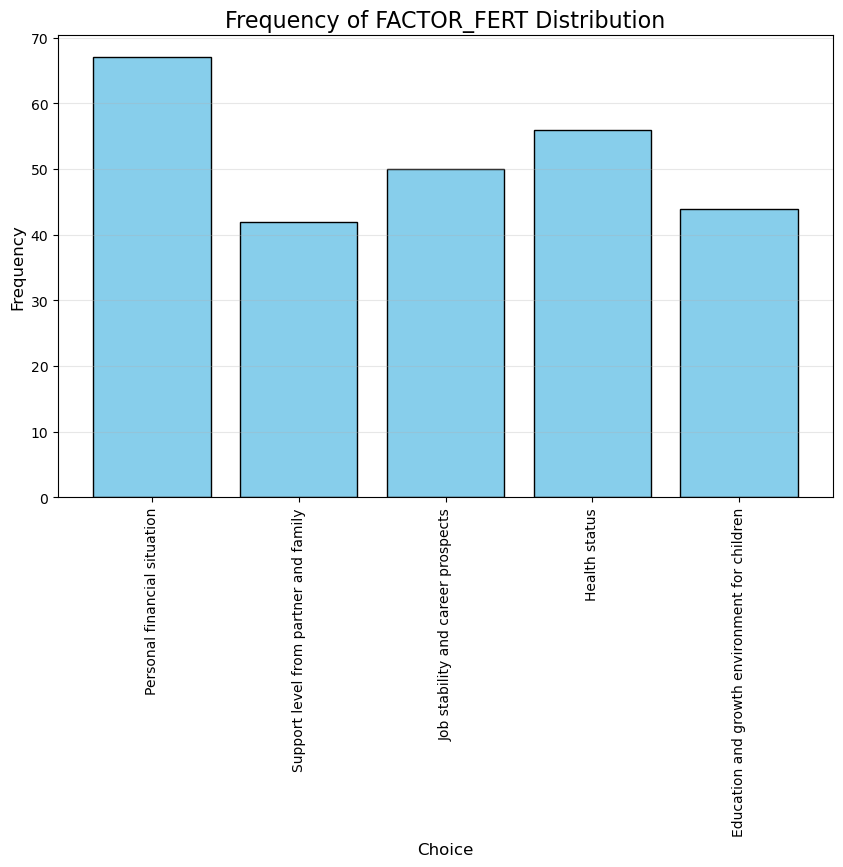

In [61]:
FACTOR_FERT_data = FERT_dataset['FACTOR_FERT'].dropna()
FACTOR_FERT_all_choices = FACTOR_FERT_data.str.split(',')
flat_choices = [item.strip() for sublist in FACTOR_FERT_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of FACTOR_FERT Distribution', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

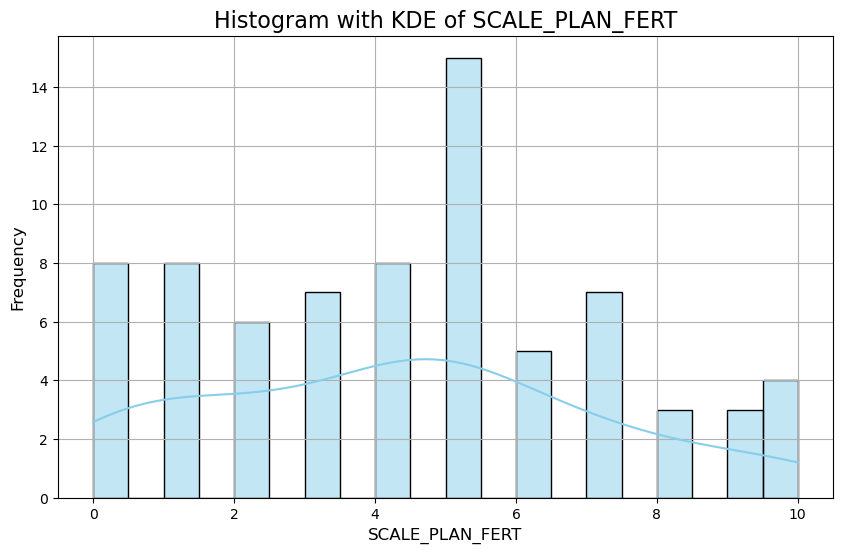

In [62]:
#CV: SCALE_PLAN_FERT, BEST_FERT_AGE
plt.figure(figsize=(10, 6))
sns.histplot(FERT_dataset['SCALE_PLAN_FERT'], kde=True, color='skyblue', bins=20)
plt.title('Histogram with KDE of SCALE_PLAN_FERT', fontsize=16)
plt.xlabel('SCALE_PLAN_FERT', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

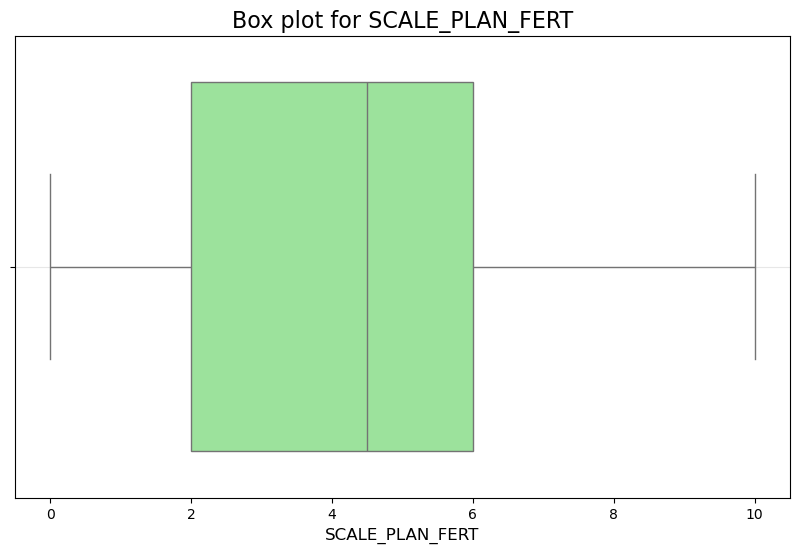

In [63]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=FERT_dataset['SCALE_PLAN_FERT'], color='lightgreen')
plt.title('Box plot for SCALE_PLAN_FERT', fontsize=16)
plt.xlabel('SCALE_PLAN_FERT', fontsize=12)
plt.grid(True, axis='y', alpha=0.3)
plt.show()

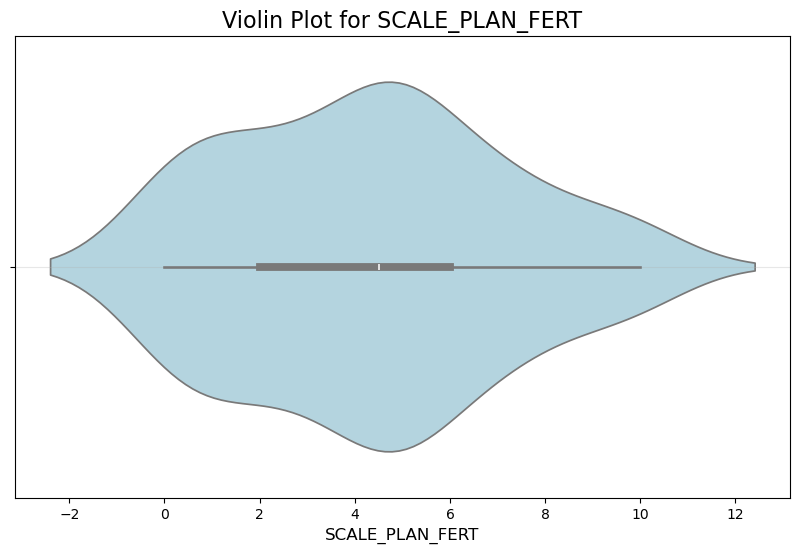

In [64]:
plt.figure(figsize=(10, 6))
sns.violinplot(
    x=FERT_dataset['SCALE_PLAN_FERT'],
    color='lightblue',
)
plt.title('Violin Plot for SCALE_PLAN_FERT', fontsize=16)
plt.xlabel('SCALE_PLAN_FERT', fontsize=12)
plt.grid(True, axis='y', alpha=0.3)
plt.show()

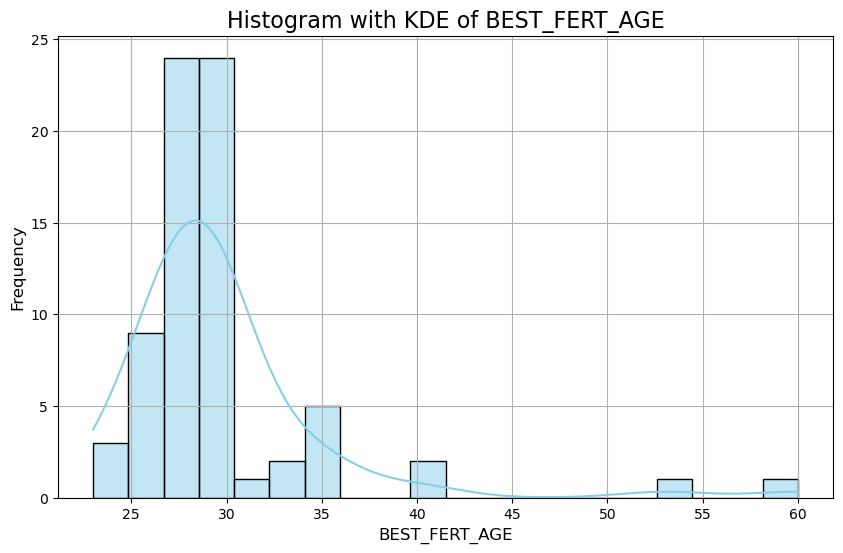

In [65]:
plt.figure(figsize=(10, 6))
sns.histplot(FERT_dataset['BEST_FERT_AGE'], kde=True, color='skyblue', bins=20)
plt.title('Histogram with KDE of BEST_FERT_AGE', fontsize=16)
plt.xlabel('BEST_FERT_AGE', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

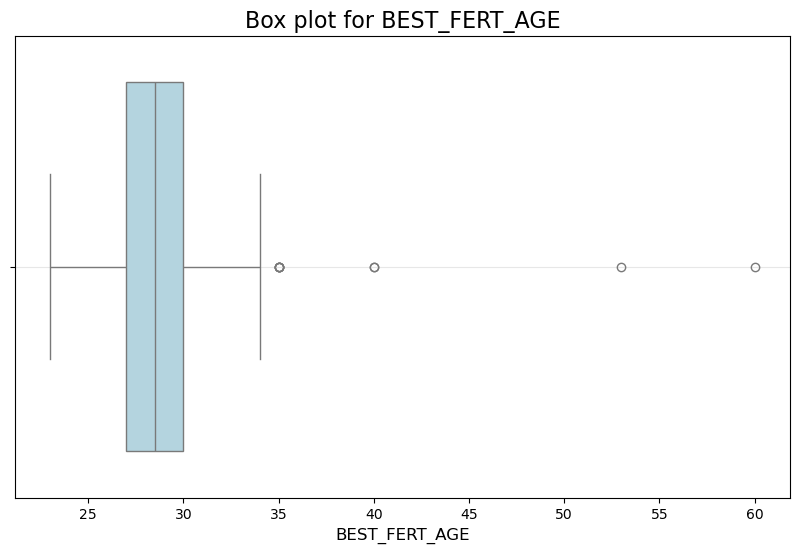

In [66]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=FERT_dataset['BEST_FERT_AGE'], color='lightblue')
plt.title('Box plot for BEST_FERT_AGE', fontsize=16)
plt.xlabel('BEST_FERT_AGE', fontsize=12)
plt.grid(True, axis='y', alpha=0.3)
plt.show()

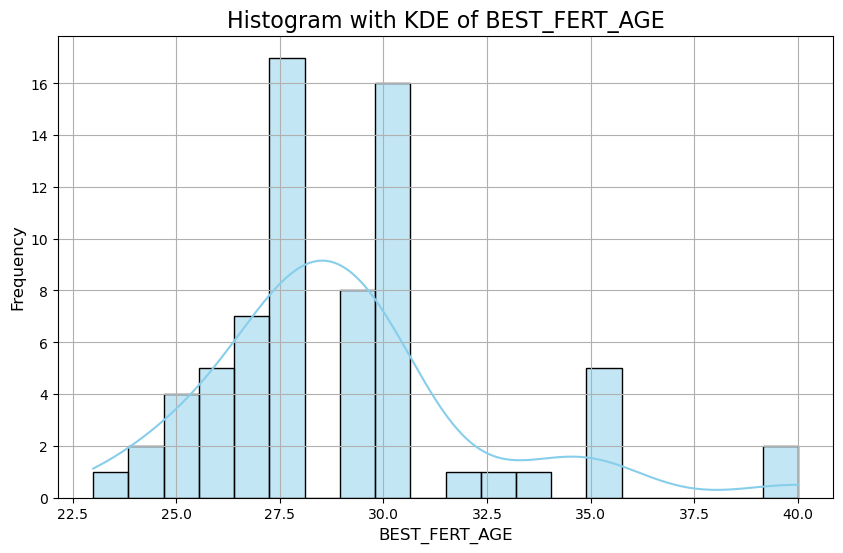

In [67]:
data_fert_age = FERT_dataset[(FERT_dataset["BEST_FERT_AGE"] > 18) & (FERT_dataset["BEST_FERT_AGE"] < 50)].reset_index(drop=True)

plt.figure(figsize=(10, 6))
sns.histplot(data_fert_age['BEST_FERT_AGE'], kde=True, color='skyblue', bins=20)
plt.title('Histogram with KDE of BEST_FERT_AGE', fontsize=16)
plt.xlabel('BEST_FERT_AGE', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

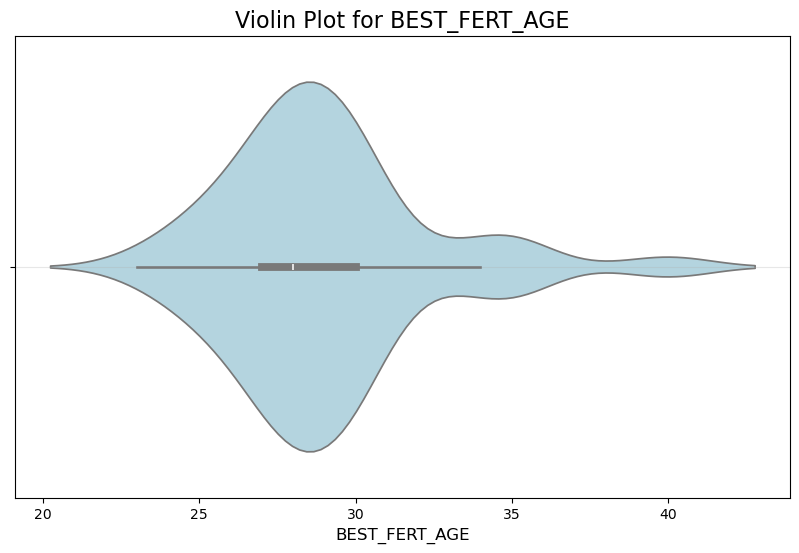

In [68]:
plt.figure(figsize=(10, 6))
sns.violinplot(
    x=data_fert_age['BEST_FERT_AGE'],
    color='lightblue',
)
plt.title('Violin Plot for BEST_FERT_AGE', fontsize=16)
plt.xlabel('BEST_FERT_AGE', fontsize=12)
plt.grid(True, axis='y', alpha=0.3)
plt.show()

/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/1210564030.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', label='Normal Distribution Fit', color='red')


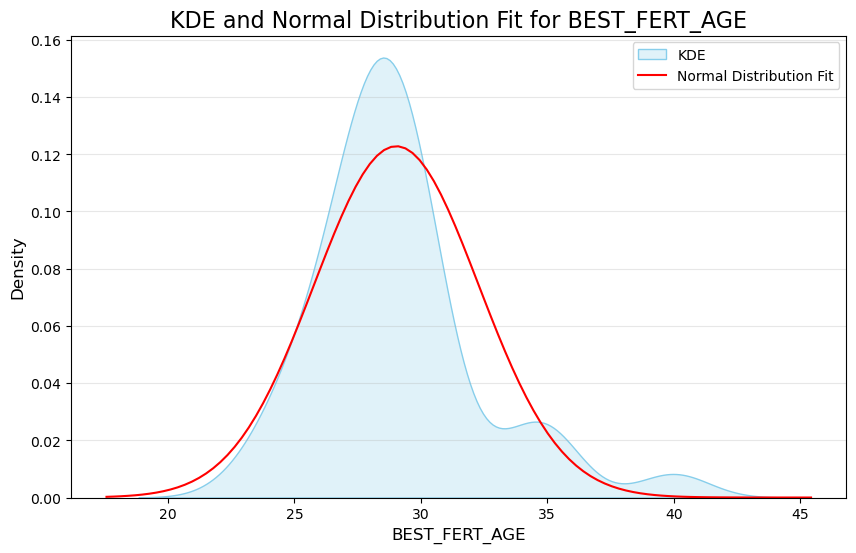

In [69]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data_fert_age['BEST_FERT_AGE'].dropna(), color='skyblue', fill=True, label='KDE')
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, data_fert_age['BEST_FERT_AGE'].mean(), data_fert_age['BEST_FERT_AGE'].std())
plt.plot(x, p, 'k', label='Normal Distribution Fit', color='red')
plt.title('KDE and Normal Distribution Fit for BEST_FERT_AGE', fontsize=16)
plt.xlabel('BEST_FERT_AGE', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend()
plt.grid(True, axis='y', alpha=0.3)
plt.show()

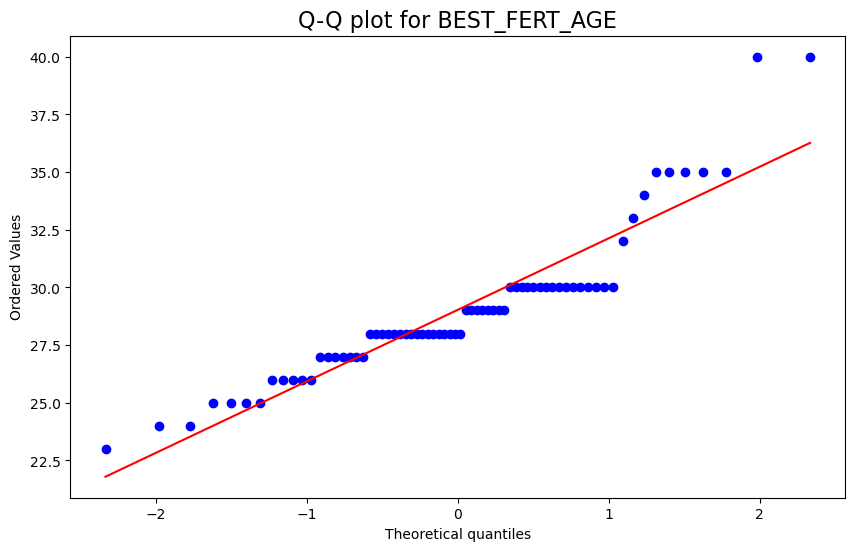

In [70]:
plt.figure(figsize=(10, 6))
stats.probplot(data_fert_age['BEST_FERT_AGE'], dist="norm", plot=plt)
plt.title('Q-Q plot for BEST_FERT_AGE', fontsize=16)
plt.show()

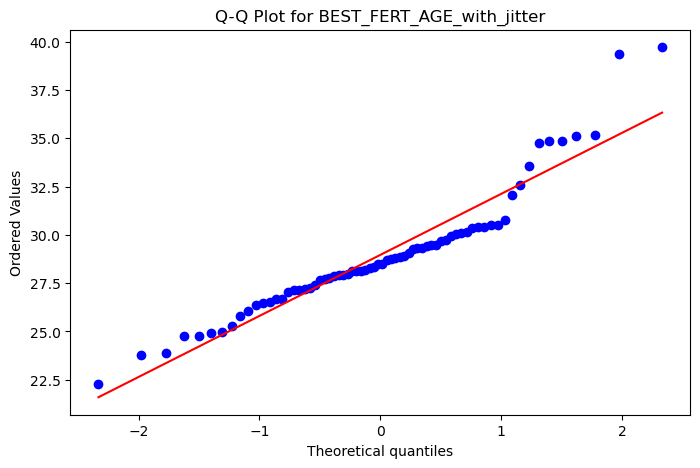

In [71]:
#Add jitter to BEST_FERT_AGE
np.random.seed(42)
data_fert_age['BEST_FERT_AGE_with_jitter'] = data_fert_age['BEST_FERT_AGE'] + np.random.normal(0, 0.5, size=len(data_fert_age))

plt.figure(figsize=(8, 5))
stats.probplot(data_fert_age['BEST_FERT_AGE_with_jitter'], dist="norm", plot=plt)
plt.title('Q-Q Plot for BEST_FERT_AGE_with_jitter')
plt.show()

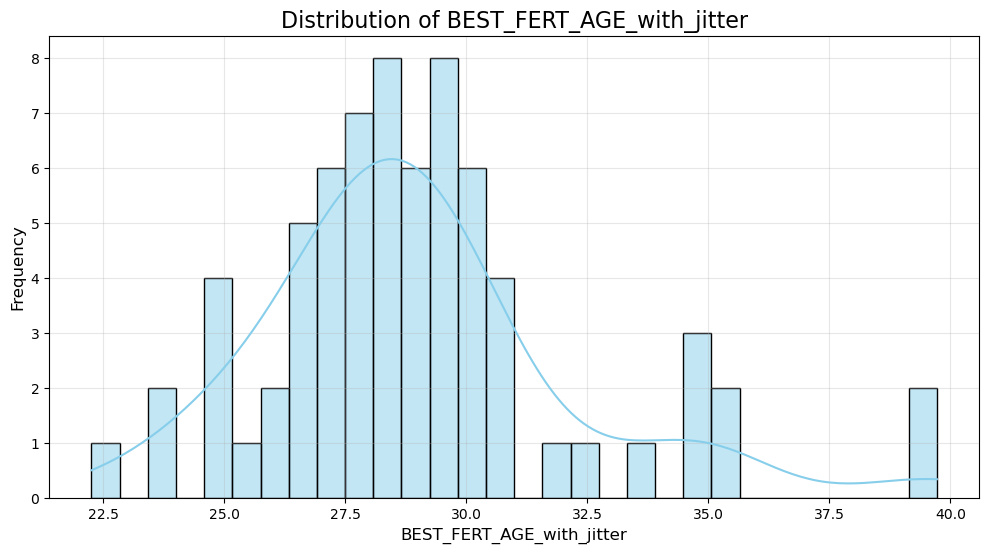

In [72]:
plt.figure(figsize=(12, 6))
sns.histplot(data_fert_age['BEST_FERT_AGE_with_jitter'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of BEST_FERT_AGE_with_jitter', fontsize=16)
plt.xlabel('BEST_FERT_AGE_with_jitter', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

In [73]:
shapiro_test = shapiro(data_fert_age['BEST_FERT_AGE'])
print(f"Shapiro-Wilk Test Statistic: {shapiro_test.statistic}, p-value: {shapiro_test.pvalue}")

kstest_result = kstest(data_fert_age['BEST_FERT_AGE'], 'norm', args=(data_fert_age['BEST_FERT_AGE'].mean(), data_fert_age['BEST_FERT_AGE'].std()))
print(f"Kolmogorov-Smirnov Test Statistic: {kstest_result.statistic}, p-value: {kstest_result.pvalue}")

Shapiro-Wilk Test Statistic: 0.8819506261275806, p-value: 8.06095327993255e-06
Kolmogorov-Smirnov Test Statistic: 0.23958251732432978, p-value: 0.0005082310044058217


In [74]:
shapiro_test = shapiro(data_fert_age['BEST_FERT_AGE_with_jitter'])
print(f"Shapiro-Wilk Test Statistic: {shapiro_test.statistic}, p-value: {shapiro_test.pvalue}")

kstest_result = kstest(data_fert_age['BEST_FERT_AGE_with_jitter'], 'norm', args=(data_fert_age['BEST_FERT_AGE_with_jitter'].mean(), data_fert_age['BEST_FERT_AGE_with_jitter'].std()))
print(f"Kolmogorov-Smirnov Test Statistic: {kstest_result.statistic}, p-value: {kstest_result.pvalue}")

Shapiro-Wilk Test Statistic: 0.9162091913331291, p-value: 0.0001802993430490658
Kolmogorov-Smirnov Test Statistic: 0.15747149629125023, p-value: 0.05544703315793398


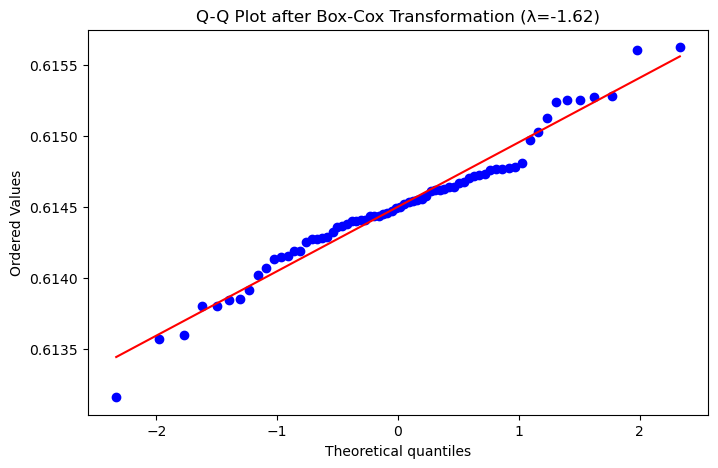

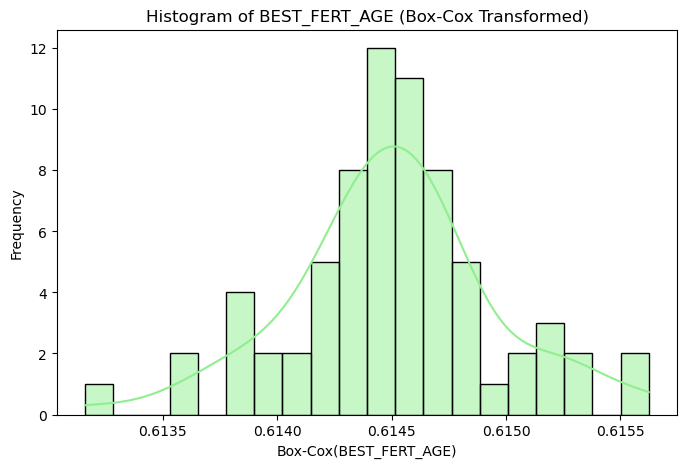

In [75]:
data_fert_age['BEST_FERT_AGE_boxcox'], lambda_boxcox = boxcox(data_fert_age['BEST_FERT_AGE_with_jitter'] + 1e-3)

plt.figure(figsize=(8, 5))
stats.probplot(data_fert_age['BEST_FERT_AGE_boxcox'], dist="norm", plot=plt)
plt.title(f"Q-Q Plot after Box-Cox Transformation (λ={lambda_boxcox:.2f})")
plt.show()

plt.figure(figsize=(8, 5))
sns.histplot(data_fert_age['BEST_FERT_AGE_boxcox'], kde=True, bins=20, color='lightgreen', edgecolor='black')
plt.title('Histogram of BEST_FERT_AGE (Box-Cox Transformed)')
plt.xlabel('Box-Cox(BEST_FERT_AGE)')
plt.ylabel('Frequency')
plt.show()

In [76]:
shapiro_test = shapiro(data_fert_age['BEST_FERT_AGE_boxcox'])
print(f"Shapiro-Wilk Test Statistic: {shapiro_test.statistic}, p-value: {shapiro_test.pvalue}")

kstest_result = kstest(data_fert_age['BEST_FERT_AGE_boxcox'], 'norm', args=(data_fert_age['BEST_FERT_AGE_boxcox'].mean(), data_fert_age['BEST_FERT_AGE_boxcox'].std()))
print(f"Kolmogorov-Smirnov Test Statistic: {kstest_result.statistic}, p-value: {kstest_result.pvalue}")

Shapiro-Wilk Test Statistic: 0.9730796265975867, p-value: 0.1360571543479992
Kolmogorov-Smirnov Test Statistic: 0.11041668354599843, p-value: 0.3357984614587086


In [77]:
r_MC

,Progress,Duration(inseconds),ResponseId,GEN,AGE,FACULTY,RACE,RACE_Other,BIRTH_PLACE,BIRTH_PLACE_Other,HAVE_BELIEF,RELIGION,RELIGION_Other,MARR_STATUS,MARR_STATUS_Other,BIOKIDS,BIOKIDS_Other,HAVE_SIBLINGS,BIRTH_ORDER,BIRTH_ORDER_Other,WHO_SIBLINGS,WHO_SIBLINGS_Other,BIO_SIBLINGS,BIO_SIBLINGS_Other,CLOSE_FAMILY,CLOSE_FAMILY_Other,CLOSE_FAMILY_NS,CLOSE_FAMILY_NS_Other,FATHER_EDU,MOTHER_EDU,INCOME_SOURCE,INCOME_SOURCE_Other,INCOME,MAR_STATUS,MAR_STATUS_6_TEXT,WILLING_MAR,WILLING_MAR_7_TEXT,MAR_AGE,MAR_CHOICE,MAR_IMPORTANCE,MAR_PERS_1,MAR_PERS_2,MAR_PERS_3,MAR_PERS_4,MAR_PERS_5,MAR_FACTORS_1,MAR_FACTORS_2,MAR_FACTORS_3,MAR_FACTORS_4,MAR_FACTORS_5,MAR_FACTORS_6,BEFORE_SEX,BEFORE_SEX_6_TEXT,PARTNER_BEFORE_SEX,PARTNER_BEFORE_SEX_6_TEXT,R_BEFORE_SEX,R_BEFORE_SEX_6_TEXT,ARRANGED_MAR,ARRANGED_MAR_6_TEXT,EXCPET_MAR,EXCPET_MAR_6_TEXT,CULT_MARR_ATT,CULT_FERT_ATT,CULT-3,CULT-4,CULT-5-13_1,CULT-5-13_2,CULT-5-13_3,CULT-5-13_4,CULT-5-13_5,CULT-5-13_6,CULT-5-13_7,CULT-5-13_8,CONT-1,CONT-2
0,Progress,Duration (in seconds),Response ID,What is your gender,"Your age is (please enter numbers only)\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.)",Which faculty are you enrolled in,What is your ethnicity/racial background - Selected Choice,What is your ethnicity/racial background - Other (please specify below) - Text,Where were you born - Selected Choice,Where were you born - Other (please specify) - Text,Do you have a religious belief,What is your religious belief - Selected Choice,What is your religious belief - Other (please specify below) - Text,What is the marital status of your parents - Selected Choice,What is the marital status of your parents - Other (please specify below) - Text,Were you born as a biological child or adopted into the family - Selected Choice,Were you born as a biological child or adopted into the family - Other (please specify below) - Text,What is the situation regarding siblings in your family,What is your birth order in the family - Selected Choice,What is your birth order in the family - Other (please specify below) - Text,Other children in your family include your - Selected Choice,Other children in your family include your - Other (please specify below) - Text,What is the situation regarding the other children in your family (excluding yourself) becoming family members - Selected Choice,What is the situation regarding the other children in your family (excluding yourself) becoming family members - Other (please specify below) - Text,"In your daily life, which family member do you feel you interact with more closely - Selected Choice","In your daily life, which family member do you feel you interact with more closely - I interact more closely with someone else (please specify below) - Text","In your daily life, which family member do you feel you interact with more closely - Selected Choice","In your daily life, which family member do you feel you interact with more closely - I interact more closely with someone else (please specify below) - Text","What is the education level of your parents\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - Father","What is the education level of your parents\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - Mother",What is your main source of living expenses - Selected Choice,What is your main source of living expenses - Other (please specify below) - Text,"What is your approximate monthly living expense\n\n(If you choose ""Prefer not to say,"" you do not need to answer this question and can continue with the rest of the survey.) - In MOP",What is your current marital status - Selected Choice,What is your current marital status - Other (please specify below) - Text,Do you want marry - Selected Choice,Do you want marry - Other（please specify below） - Tex

In [78]:
#Encoding rules
coding_MARR = {
    "MAR_STATUS": "R_MARR_STATUS",
    "MAR_STATUS_6_TEXT": "R_MARR_STSTUS_Other",
    "WILLING_MAR_7_TEXT": "WILLING_MAR_Other",
    "MAR_PERS_1": "LOVE_IN_MAR",
    "MAR_PERS_2": 'FIN_IN_MAR',
    "MAR_PERS_3": "TRAD_IN_MAR",
    "MAR_PERS_4": "COR_IN_MRA",
    "MAR_PERS_5": "FULFIL_IN_MRA",
    "MAR_FACTORS_1": "ECO",
    "MAR_FACTORS_2": "COM",
    "MAR_FACTORS_3": "PER",
    "MAR_FACTORS_4": "EMO",
    "MAR_FACTORS_5": "INT",
    "MAR_FACTORS_6": "LIF",
    "BEFORE_SEX_6_TEXT": "BEFORE_SEX_Other",
    "PARTNER_BEFORE_SEX_6_TEXT": "PARTNER_BEFORE_SEX_Other",
    "R_BEFORE_SEX_6_TEXT": "R_BEFORE_SEX_Other",
    "ARRANGED_MAR_6_TEXT": "ARRANGED_MAR_Other",
    "EXCPET_MAR_6_TEXT": "EXCPET_MAR_Other",
    "MAR_AGE_5_TEXT": "'MAR_AGE_5_Other",
    'PARTNER_BEFORE_SEX_12_TEXT': "PARTNER_BEFORE_SEX_Other",
    'R_BEFORE_SEX_15_TEXT': 'R_BEFORE_SEX_Other',
    'ARRANGED_MAR_13_TEXT': 'ARRANGED_MAR_Other',
    'EXCPET_MAR_13_TEXT': 'EXCPET_MAR_Other'
}

coding_datasets(M_r, coding_MARR)

In [79]:
MARR_rule = ['Duration(inseconds)', 'Progress', 'ResponseId', 'R_MARR_STATUS', 'R_MARR_STSTUS_Other',
       'WILLING_MAR', 'WILLING_MAR_Other', 'MAR_AGE', 'MAR_CHOICE',
       'MAR_IMPORTANCE', 'LOVE_IN_MAR', 'FIN_IN_MAR', 'TRAD_IN_MAR',
       'COR_IN_MRA', 'FULFIL_IN_MRA', 'ECO', 'COM', 'PER', 'EMO', 'INT', 'LIF',
       'BEFORE_SEX', 'PARTNER_BEFORE_SEX',
       'PARTNER_BEFORE_SEX_Other', 'R_BEFORE_SEX', 'R_BEFORE_SEX_Other',
       'ARRANGED_MAR', 'ARRANGED_MAR_Other', 'EXCPET_MAR', 'EXCPET_MAR_Other']

MARR_dataset = get_combined(M_r, MARR_rule)
MARR_dataset

,Duration(inseconds),Progress,ResponseId,R_MARR_STATUS,R_MARR_STSTUS_Other,WILLING_MAR,WILLING_MAR_Other,MAR_AGE,MAR_CHOICE,MAR_IMPORTANCE,LOVE_IN_MAR,FIN_IN_MAR,TRAD_IN_MAR,COR_IN_MRA,FULFIL_IN_MRA,ECO,COM,PER,EMO,INT,LIF,BEFORE_SEX,PARTNER_BEFORE_SEX,PARTNER_BEFORE_SEX_Other,R_BEFORE_SEX,R_BEFORE_SEX_Other,ARRANGED_MAR,ARRANGED_MAR_Other,EXCPET_MAR,EXCPET_MAR_Other
0,Duration (in seconds),Progress,Response ID,What is your current marital status - Selected Choice,What is your current marital status - Other (please specify below) - Text,Do you want marry - Selected Choice,Do you want marry - Other（please specify below） - Text,What do you think is the best age for marriage,Do you think most people will choose marriage as a part of their life,Do you think marriage is important for personal life,How much do you agree with the following statements - Marriage should be based on love,"How much do you agree with the following statements - Marriage can lack love, but must have financial basics",How much do you agree with the following statements - Marriage is a part of social tradition,How much do you agree with the following statements - Marriage not only requires love but also necessitates mutual development in both partners' careers and lives,How much do you agree with the following statements - The need for personal self-actualization in marriage should be given appropriate attention and respect,"Please drag and drop the following factors in order of importance based on your views on a happy marriage\n\n(If you chose ""Unwilling to disclose,"" you do not need to answer this question and can continue with the rest of the survey) - <strong>Financial arrangements</strong> (whether the couple's spending habits and financial views are aligned)","Please drag and drop the following factors in order of importance based on your views on a happy marriage\n\n(If you chose ""Unwilling to disclose,"" you do not need to answer this question and can continue with the rest of the survey) - <strong>Effective communication</strong> (having positive and stable communication that allows both parties to have a good experience)","Please drag and drop the following factors in order of importance based on your views on a happy marriage\n\n(If you chose ""Unwilling to disclose,"" you do not need to answer this question and can continue with the rest of the survey) - <strong>Compatibility of personality</strong> (whether the couple's personalities are complementary and can accept each other)","Please drag and drop the following factors in order of importance based on your views on a happy marriage\n\n(If you chose ""Unwilling to disclose,"" you do not need to answer this question and can continue with the rest of the survey) - <strong>Intimacy and emotional connection</strong> (the level of harmony in the couple's intimate relationship)","Please drag and drop the following factors in order of importance based on your views on a happy marriage\n\n(If you chose ""Unwilling to disclose,"" you do not need to answer this question and can continue with the rest of the survey) - <strong>Shared interests and hobbies</strong> (the ability to cultivate common interests beyond daily routines)","Please drag and drop the following factors in order of importance based on your views on a happy marriage\n\n(If you chose ""Unwilling to disclose,"" you do not need to answer this question and can continue with the rest of the survey) - <strong>Alignment of lifestyle views</strong> (mutual acceptance of different living habits and personal values/beliefs)",What is your attitude towards premarital sex or cohabitation - Selected Choice,Do you mind if your partner has had premarital sexual relations/cohabitation - Selected Choice,Do you mind if your partner has had premarital sexual relations/cohabitation - Other (please specify below) - Text,"If you have had premarital sexual relations/cohabitation, do you think your partner would mind - Selected Choice","If you have had premar

In [80]:
#Duration should never be NaN
remove_non_numeric_rows(MARR_dataset, "Duration(inseconds)")
MARR_dataset

,Duration(inseconds),Progress,ResponseId,R_MARR_STATUS,R_MARR_STSTUS_Other,WILLING_MAR,WILLING_MAR_Other,MAR_AGE,MAR_CHOICE,MAR_IMPORTANCE,LOVE_IN_MAR,FIN_IN_MAR,TRAD_IN_MAR,COR_IN_MRA,FULFIL_IN_MRA,ECO,COM,PER,EMO,INT,LIF,BEFORE_SEX,PARTNER_BEFORE_SEX,PARTNER_BEFORE_SEX_Other,R_BEFORE_SEX,R_BEFORE_SEX_Other,ARRANGED_MAR,ARRANGED_MAR_Other,EXCPET_MAR,EXCPET_MAR_Other
0,283.0,100,R_4nNEDda5Ob6V35o,Single,NaN,"Yes, I am very willing",NaN,26-30,"Yes, but more and more young people are leaning towards singleness","Relatively important, marriage can provide stability and support in life",Strongly agree,Somewhat disagree,Strongly agree,Strongly agree,Strongly agree,6,1,3,5,4,2,Completely supportive - believing it is a normal personal choice,"Somewhat supportive - as long as both parties are consenting, it won't affect my view of my partner",NaN,Somewhat supportive - My partner might be understanding as long as our current relationship is based on mutual respect and trust,NaN,Neutral - I do not have a clear opinion on arranged marriages; I believe that everyone's circumstances are different and individual choices should be respected,NaN,Friendship - A deep bond providing emotional support without romantic or sexual ties.,NaN
1,420.0,100,R_4pnH9vCtQ7Cs2Wk,In a relationship,NaN,"I am not sure yet, I need to consider more factors",NaN,26-30,"Unlikely, more and more people are choosing to remain unmarried or delaying marriage","Moderately important, the importance of marriage varies from person to person",Somewhat agree,Neither disagree nor agree,Somewhat agree,Somewhat agree,Strongly agree,4,1,2,6,3,5,Neutral - believing it is a personal choice and having no particular opinion,"Neutral - this is a personal privacy matter, and I won’t judge too much",NaN,"Neutral - My partner might consider this my personal privacy and not comment much, focusing instead on our current relationship",NaN,Somewhat opposed - I believe that arranged marriages may limit personal freedom and affect happiness,NaN,"Long-term partnership - A strong emotional bond between partners that signifies mutual commitment, even without legal marriage",NaN
2,545.0,100,R_49HlTUzfMSOvCRX,Single,NaN,"Not very willing, I have a reserved attitude towards marriage",NaN,20-25,"Yes, I think most people will choose to get married","Moderately important, the importance of marriage varies from person to person",Somewhat agree,Strongly agree,Neither disagree nor agree,Somewhat agree,Somewhat agree,3,1,4,2,6,5,Completely supportive - believing it is a normal personal choice,"Somewhat supportive - as long as both parties are consenting, it won't affect my view of my partner",NaN,Somewhat supportive - My partner might be understanding as long as our current relationship is based on mutual respect and trust,NaN,Neutral - I do not have a clear opinion on arranged marriages; I believe that everyone's circumstances are different and individual choices should be respected,NaN,"Cohabitation - Partners living together but not formally married, usually sharing economic and household responsibilities,Friendship - A deep bond providing emotional support without romantic or sexual ties.",NaN
3,1005.0,100,R_4FhsOVnNWqi7Lhf,Single,NaN,"Not very willing, I have a reserved attitude towards marriage",NaN,26-30,"Yes, but more and more young people are leaning towards singleness","Moderately important, the importance of marriage varies from person to person",Somewhat disagree,Strongly agree,Somewhat agree,Somewhat agree,Strongly agree,1,5,3,6,4,2,Completely supportive - believing it is a normal personal choice,"Somewhat supportive - as long as both parties are consenting, it won't affect my view of my partner",NaN,Somewhat supportive - My partner might be understanding as long as our current relationship is based on mutual respect and trust,NaN,Neutral - I do not have a clear opinion on arranged marriages; I believe that everyone's circumstances are different and individual choices should be respected,NaN,"

In [81]:
#Delete responses whose progress is less than 30
MARR_dataset["Progress"] = pd.to_numeric(MARR_dataset["Progress"], errors="coerce")
MARR_dataset = MARR_dataset[(MARR_dataset["Progress"] >= 30) & (MARR_dataset["Duration(inseconds)"] >= 60)]
MARR_dataset.reset_index(drop=True, inplace=True)

MARR_dataset

,Duration(inseconds),Progress,ResponseId,R_MARR_STATUS,R_MARR_STSTUS_Other,WILLING_MAR,WILLING_MAR_Other,MAR_AGE,MAR_CHOICE,MAR_IMPORTANCE,LOVE_IN_MAR,FIN_IN_MAR,TRAD_IN_MAR,COR_IN_MRA,FULFIL_IN_MRA,ECO,COM,PER,EMO,INT,LIF,BEFORE_SEX,PARTNER_BEFORE_SEX,PARTNER_BEFORE_SEX_Other,R_BEFORE_SEX,R_BEFORE_SEX_Other,ARRANGED_MAR,ARRANGED_MAR_Other,EXCPET_MAR,EXCPET_MAR_Other
0,283.0,100,R_4nNEDda5Ob6V35o,Single,NaN,"Yes, I am very willing",NaN,26-30,"Yes, but more and more young people are leaning towards singleness","Relatively important, marriage can provide stability and support in life",Strongly agree,Somewhat disagree,Strongly agree,Strongly agree,Strongly agree,6,1,3,5,4,2,Completely supportive - believing it is a normal personal choice,"Somewhat supportive - as long as both parties are consenting, it won't affect my view of my partner",NaN,Somewhat supportive - My partner might be understanding as long as our current relationship is based on mutual respect and trust,NaN,Neutral - I do not have a clear opinion on arranged marriages; I believe that everyone's circumstances are different and individual choices should be respected,NaN,Friendship - A deep bond providing emotional support without romantic or sexual ties.,NaN
1,420.0,100,R_4pnH9vCtQ7Cs2Wk,In a relationship,NaN,"I am not sure yet, I need to consider more factors",NaN,26-30,"Unlikely, more and more people are choosing to remain unmarried or delaying marriage","Moderately important, the importance of marriage varies from person to person",Somewhat agree,Neither disagree nor agree,Somewhat agree,Somewhat agree,Strongly agree,4,1,2,6,3,5,Neutral - believing it is a personal choice and having no particular opinion,"Neutral - this is a personal privacy matter, and I won’t judge too much",NaN,"Neutral - My partner might consider this my personal privacy and not comment much, focusing instead on our current relationship",NaN,Somewhat opposed - I believe that arranged marriages may limit personal freedom and affect happiness,NaN,"Long-term partnership - A strong emotional bond between partners that signifies mutual commitment, even without legal marriage",NaN
2,545.0,100,R_49HlTUzfMSOvCRX,Single,NaN,"Not very willing, I have a reserved attitude towards marriage",NaN,20-25,"Yes, I think most people will choose to get married","Moderately important, the importance of marriage varies from person to person",Somewhat agree,Strongly agree,Neither disagree nor agree,Somewhat agree,Somewhat agree,3,1,4,2,6,5,Completely supportive - believing it is a normal personal choice,"Somewhat supportive - as long as both parties are consenting, it won't affect my view of my partner",NaN,Somewhat supportive - My partner might be understanding as long as our current relationship is based on mutual respect and trust,NaN,Neutral - I do not have a clear opinion on arranged marriages; I believe that everyone's circumstances are different and individual choices should be respected,NaN,"Cohabitation - Partners living together but not formally married, usually sharing economic and household responsibilities,Friendship - A deep bond providing emotional support without romantic or sexual ties.",NaN
3,1005.0,100,R_4FhsOVnNWqi7Lhf,Single,NaN,"Not very willing, I have a reserved attitude towards marriage",NaN,26-30,"Yes, but more and more young people are leaning towards singleness","Moderately important, the importance of marriage varies from person to person",Somewhat disagree,Strongly agree,Somewhat agree,Somewhat agree,Strongly agree,1,5,3,6,4,2,Completely supportive - believing it is a normal personal choice,"Somewhat supportive - as long as both parties are consenting, it won't affect my view of my partner",NaN,Somewhat supportive - My partner might be understanding as long as our current relationship is based on mutual respect and trust,NaN,Neutral - I do not have a clear opinion on arranged marriages; I believe that everyone's circumstances are different and individual choices should be respected,NaN,"

In [82]:
remove_empty_columns(MARR_dataset)
handle_other_columns(MARR_dataset)

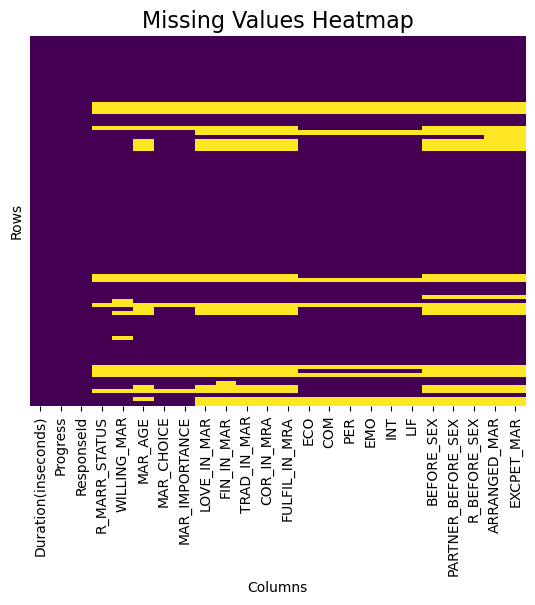

In [83]:
visualize_nan(MARR_dataset, MARR_dataset.columns)

In [84]:
MARR_dataset.dtypes

Duration(inseconds)    float64
Progress                 int64
ResponseId              object
R_MARR_STATUS           object
WILLING_MAR             object
MAR_AGE                 object
MAR_CHOICE              object
MAR_IMPORTANCE          object
LOVE_IN_MAR             object
FIN_IN_MAR              object
TRAD_IN_MAR             object
COR_IN_MRA              object
FULFIL_IN_MRA           object
ECO                     object
COM                     object
PER                     object
EMO                     object
INT                     object
LIF                     object
BEFORE_SEX              object
PARTNER_BEFORE_SEX      object
R_BEFORE_SEX            object
ARRANGED_MAR            object
EXCPET_MAR              object
dtype: object

In [85]:
MARR_dataset["ECO"] = pd.to_numeric(MARR_dataset["ECO"], errors="coerce")
MARR_dataset["COM"] = pd.to_numeric(MARR_dataset["COM"], errors="coerce")
MARR_dataset["PER"] = pd.to_numeric(MARR_dataset["PER"], errors="coerce")
MARR_dataset["EMO"] = pd.to_numeric(MARR_dataset["EMO"], errors="coerce")
MARR_dataset["INT"] = pd.to_numeric(MARR_dataset["INT"], errors="coerce")
MARR_dataset["LIF"] = pd.to_numeric(MARR_dataset["LIF"], errors="coerce")

In [86]:
#Mapping of answers
MAR_AGE_map = {'Other (please specify below)': np.nan}
MARR_dataset.loc[:, "MAR_AGE"] = MARR_dataset["MAR_AGE"].replace(MAR_AGE_map)

BEFORE_SEX_map = {'Other (please specify below)': np.nan}
MARR_dataset.loc[:, "BEFORE_SEX"] = MARR_dataset["BEFORE_SEX"].replace(BEFORE_SEX_map)

PARTNER_BEFORE_SEX_map = {'需要瞭解其motivation': np.nan, '独身主义，未考虑过': np.nan}
MARR_dataset.loc[:, "PARTNER_BEFORE_SEX"] = MARR_dataset["PARTNER_BEFORE_SEX"].replace(PARTNER_BEFORE_SEX_map)

R_BEFORE_SEX_map = {'沒有伴侶': np.nan, '独身主义，未考虑过': np.nan}
MARR_dataset.loc[:, "R_BEFORE_SEX"] = MARR_dataset["R_BEFORE_SEX"].replace(R_BEFORE_SEX_map)

ARRANGED_MAR_map = {'只能对于结果来评判，对于那些接受包办婚姻后自己认为过得幸福的就是好的，而对于那些婚后生活中都感到痛苦的就是不应该的。': "Neutral - I do not have a clear opinion on arranged marriages; I believe that everyone's circumstances are different and individual choices should be respected" }
MARR_dataset.loc[:, "ARRANGED_MAR"] = MARR_dataset["ARRANGED_MAR"].replace(ARRANGED_MAR_map)

EXCPET_MAR_map = {'沒有，因我認為沒有法律上效力，分開時難有保障': np.nan}
MARR_dataset.loc[:, "EXCPET_MAR"] = MARR_dataset["EXCPET_MAR"].replace(EXCPET_MAR_map)

INGRE_map = {'Strongly disagree': 1, 'Somewhat disagree': 2, 'Neither disagree nor agree': 3, 'Somewhat agree': 4, 'Strongly agree': 5}
MARR_dataset.loc[:, "LOVE_IN_MAR"] = MARR_dataset["LOVE_IN_MAR"].replace(INGRE_map)
MARR_dataset.loc[:, "FIN_IN_MAR"] = MARR_dataset["FIN_IN_MAR"].replace(INGRE_map)
MARR_dataset.loc[:, "TRAD_IN_MAR"] = MARR_dataset["TRAD_IN_MAR"].replace(INGRE_map)
MARR_dataset.loc[:, "COR_IN_MRA"] = MARR_dataset["COR_IN_MRA"].replace(INGRE_map)
MARR_dataset.loc[:, "FULFIL_IN_MRA"] = MARR_dataset["FULFIL_IN_MRA"].replace(INGRE_map)

MARR_dataset["LOVE_IN_MAR"] = pd.to_numeric(MARR_dataset["LOVE_IN_MAR"], errors="coerce")
MARR_dataset["FIN_IN_MAR"] = pd.to_numeric(MARR_dataset["FIN_IN_MAR"], errors="coerce")
MARR_dataset["TRAD_IN_MAR"] = pd.to_numeric(MARR_dataset["TRAD_IN_MAR"], errors="coerce")
MARR_dataset["COR_IN_MRA"] = pd.to_numeric(MARR_dataset["COR_IN_MRA"], errors="coerce")
MARR_dataset["FULFIL_IN_MRA"] = pd.to_numeric(MARR_dataset["FULFIL_IN_MRA"], errors="coerce")

MARR_dataset.dtypes

/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/4240417888.py:21: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  MARR_dataset.loc[:, "LOVE_IN_MAR"] = MARR_dataset["LOVE_IN_MAR"].replace(INGRE_map)
/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/4240417888.py:22: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  MARR_dataset.loc[:, "FIN_IN_MAR"] = MARR_dataset["FIN_IN_MAR"].replace(INGRE_map)
/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/4240417888.py:23: FutureWarning: Downcasting be

Duration(inseconds)    float64
Progress                 int64
ResponseId              object
R_MARR_STATUS           object
WILLING_MAR             object
MAR_AGE                 object
MAR_CHOICE              object
MAR_IMPORTANCE          object
LOVE_IN_MAR            float64
FIN_IN_MAR             float64
TRAD_IN_MAR            float64
COR_IN_MRA             float64
FULFIL_IN_MRA          float64
ECO                    float64
COM                    float64
PER                    float64
EMO                    float64
INT                    float64
LIF                    float64
BEFORE_SEX              object
PARTNER_BEFORE_SEX      object
R_BEFORE_SEX            object
ARRANGED_MAR            object
EXCPET_MAR              object
dtype: object

In [87]:
options_marr = ['R_MARR_STATUS',
       'WILLING_MAR', 'MAR_AGE', 'MAR_CHOICE', 'MAR_IMPORTANCE', 'LOVE_IN_MAR',
       'FIN_IN_MAR', 'TRAD_IN_MAR', 'COR_IN_MRA', 'FULFIL_IN_MRA', 'ECO',
       'COM', 'PER', 'EMO', 'INT', 'LIF', 'BEFORE_SEX', 'PARTNER_BEFORE_SEX',
       'R_BEFORE_SEX', 'ARRANGED_MAR']
dropdown = widgets.Dropdown(
    options=options_marr,
    value="R_MARR_STATUS",
    description="Variable"
)
dropdown

Dropdown(description='Variable', options=('R_MARR_STATUS', 'WILLING_MAR', 'MAR_AGE', 'MAR_CHOICE', 'MAR_IMPORT…

In [88]:
#Create an iteractive drawer of DV's count plot
@interact
def display_plot(variable=dropdown):
    data_clean = MARR_dataset.dropna(subset=[variable])

    count_data = data_clean[variable].value_counts(normalize=True).reset_index()
    count_data.columns = [variable, 'percentage']
    count_data['percentage'] = (count_data['percentage'] * 100).round(2)

    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=variable, data=data_clean, palette='Set2')

    total = len(data_clean)
    for p in ax.patches:
        height = p.get_height()
        percentage = (height / total) * 100
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{percentage:.1f}%', ha='center', fontsize=12)

    plt.title(f'Distribution of {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(True, axis='y', alpha=0.3)
    plt.show()

interactive(children=(Dropdown(description='Variable', options=('R_MARR_STATUS', 'WILLING_MAR', 'MAR_AGE', 'MA…

In [89]:
#CategoricalDtype
categories_order_6 = ['20-25', '26-30', '31-35', 'Above 35']
mar_age_dtype = CategoricalDtype(categories=categories_order_6, ordered=True)
MARR_dataset['MAR_AGE'] = MARR_dataset['MAR_AGE'].astype(mar_age_dtype)

In [90]:
@interact
def display_distribution(variable=dropdown):
    if variable not in MARR_dataset.columns:
        print(f"Invalid variable: {variable}")
        return
    
    pmf = MARR_dataset[variable].value_counts(normalize=True)
    pmf = pmf.sort_index()

    plt.figure(figsize=(10, 6))
    pmf.plot(kind='bar', color='lightgreen', edgecolor='black')
    plt.title(f'Probability Mass Function (PMF) for {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Probability', fontsize=12)
    plt.grid(True, axis='y', alpha=0.3)
    plt.xticks(rotation=45)
    plt.show()

    if variable in ['MAR_AGE', 'ECO', 'COM', 'PER', 'EMO', 'INT', 'LIF', 'LOVE_IN_MAR',
       'FIN_IN_MAR', 'TRAD_IN_MAR', 'COR_IN_MRA', 'FULFIL_IN_MRA']:
        cdf = pmf.cumsum()

        plt.figure(figsize=(10, 6))
        plt.step(cdf.index, cdf.values, where='mid', color='skyblue')
        plt.title(f'Cumulative Distribution Function (CDF) for {variable}', fontsize=16)
        plt.xlabel(variable, fontsize=12)
        plt.ylabel('Cumulative Probability', fontsize=12)
        plt.grid(True, axis='y', alpha=0.3)
        plt.show()

interactive(children=(Dropdown(description='Variable', options=('R_MARR_STATUS', 'WILLING_MAR', 'MAR_AGE', 'MA…

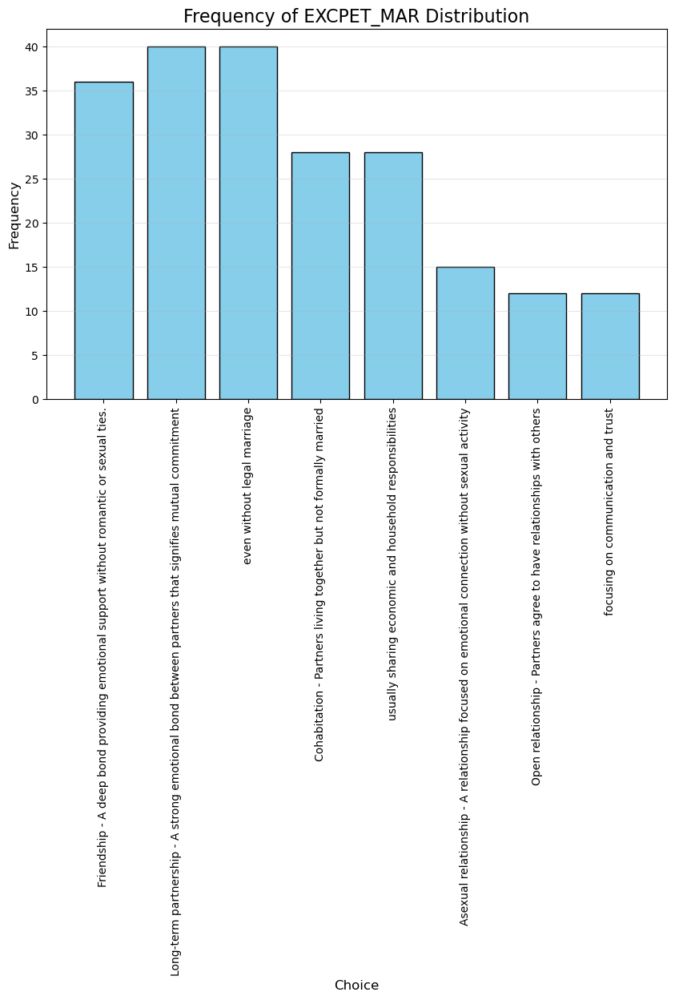

In [91]:
except_mar_data = MARR_dataset['EXCPET_MAR'].dropna()
EXCPET_MAR_all_choices = except_mar_data.str.split(',')
flat_choices = [item.strip() for sublist in EXCPET_MAR_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of EXCPET_MAR Distribution', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

In [92]:
#Encoding rules
coding_LOVE = {"LOVE-1": "STATUS","LOVE-1_6_TEXT": "STATUS_Other","LOVE-2": "TIMES", "LOVE-3": "IDEA_AGE", "LOVE-4": "FIRST_AGE", 
                "LOVE-5": "PURPOSE","LOVE-5_8_TEXT": "PURPOSE_Other" ,"LOVE-6": "REASON","LOVE-6_7_TEXT": "REASON_Other",
                "LOVE-7": "CRITERIA", "LOVE-7_9_TEXT": "CRITERIA_Other",
                "LOVE-8": "VIEW", "LOVE-8_6_TEXT": "VIEW_Other",
                "LOVE-9": "EXPECTATION_SINGLE", "LOVE-9_6_TEXT": "EXPECTATION_SINGLE_Other",
                "LOVE-10": "EXPECTATION", "LOVE-10_6_TEXT": "EXPECTATION_Other",
                "LOVE-11": "AFFECT", "LOVE-11_6_TEXT": "AFFECT_Other",
                "LOVE-12-16_1": "EVALUATE_MAN", 
                "LOVE-12-16_2": "EVALUATE_BESELF", 
                "LOVE-12-16_3": "EVALUATE_NEGOTIATE", 
                "LOVE-12-16_4": "EVALUATE_EMO", 
                "LOVE-12-16_5": "EVALUATE_HOPE", 
               }

coding_datasets(L_r, coding_LOVE)

In [93]:
LOVE_rule = ['Duration(inseconds)', 'Progress', 'ResponseId', 'STATUS', 'STATUS_Other', 'TIMES', 'IDEA_AGE', 'FIRST_AGE',
       'PURPOSE', 'PURPOSE_Other', 'REASON', 'REASON_Other',
       'CRITERIA', 'CRITERIA_Other', 'VIEW', 'VIEW_Other',
       'EXPECTATION_SINGLE', 'EXPECTATION_SINGLE_Other', 'EXPECTATION', 'EXPECTATION_Other', 'AFFECT',
       'AFFECT_Other', 'EVALUATE_MAN', 'EVALUATE_BESELF',
       'EVALUATE_NEGOTIATE', 'EVALUATE_EMO', 'EVALUATE_HOPE',
     ]

LOVE_dataset = get_combined(L_r, LOVE_rule)
LOVE_dataset

,Duration(inseconds),Progress,ResponseId,STATUS,STATUS_Other,TIMES,IDEA_AGE,FIRST_AGE,PURPOSE,PURPOSE_Other,REASON,REASON_Other,CRITERIA,CRITERIA_Other,VIEW,VIEW_Other,EXPECTATION_SINGLE,EXPECTATION_SINGLE_Other,EXPECTATION,EXPECTATION_Other,AFFECT,AFFECT_Other,EVALUATE_MAN,EVALUATE_BESELF,EVALUATE_NEGOTIATE,EVALUATE_EMO,EVALUATE_HOPE
0,Duration (in seconds),Progress,Response ID,What is your current marital status - Selected Choice,What is your current marital status - Other (please specify below) - Text,How many romantic relationships have you had in the past,What is your ideal age for being in a romantic relationship?,When was your first romantic experience,What are your main purposes for being in a relationship - Selected Choice,What are your main purposes for being in a relationship - Other (please specify below) - Text,What do you think are the main reasons why some college students choose not to be in a relationship - Selected Choice,What do you think are the main reasons why some college students choose not to be in a relationship - Other (please specify below) - Text,What are your criteria for choosing a partner - Selected Choice,What are your criteria for choosing a partner - Other (please specify below) - Text,How do you view romantic relationships during college - Selected Choice,How do you view romantic relationships during college - Other (please specify below) - Text,"If you currently have a partner, what are your plans or expectations for the future of this relationship - Selected Choice","If you currently have a partner, what are your plans or expectations for the future of this relationship - Other (please specify below) - Text","If you currently have a partner, what plans or expectations do you have for the future of this relationship - Selected Choice","If you currently have a partner, what plans or expectations do you have for the future of this relationship - Other (please specify below) - Text","Considering the end of a romantic relationship, how would it affect your studies or life - Selected Choice","Considering the end of a romantic relationship, how would it affect your studies or life - Other (please specify below) - Text","Please evaluate the following statements based on your feelings and emotions in an ideal romantic relationship or cohabitation. Each statement uses a 5-point scale (1 means ""completely disagree,"" and 5 means ""strongly agree""). Please select the option that best reflects your ideal situation. - I can manage the balance between my romantic relationship/cohabitation and my studies or work with ease.","Please evaluate the following statements based on your feelings and emotions in an ideal romantic relationship or cohabitation. Each statement uses a 5-point scale (1 means ""completely disagree,"" and 5 means ""strongly agree""). Please select the option that best reflects your ideal situation. - In a romantic relationship/cohabitation, I can be my true self.","Please evaluate the following statements based on your feelings and emotions in an ideal romantic relationship or cohabitation. Each statement uses a 5-point scale (1 means ""completely disagree,"" and 5 means ""strongly agree""). Please select the option that best reflects your ideal situation. - When problems arise, we can negotiate and solve them together.","Please evaluate the following statements based on your feelings and emotions in an ideal romantic relationship or cohabitation. Each statement uses a 5-point scale (1 means ""completely disagree,"" and 5 means ""strongly agree""). Please select the option that best reflects your ideal situation. - In our interactions, I know how to control my emotions.","Please evaluate the following statements based on your feelings and emotions in an ideal romantic relationship or cohabitation. Each statement uses a 5-point scale (1 means ""completely disagree,"" and 5 means ""strongly agree""). Please select the option that best reflects your ideal situation. - Even with many diffi

In [94]:
remove_non_numeric_rows(LOVE_dataset, "Duration(inseconds)")
LOVE_dataset

,Duration(inseconds),Progress,ResponseId,STATUS,STATUS_Other,TIMES,IDEA_AGE,FIRST_AGE,PURPOSE,PURPOSE_Other,REASON,REASON_Other,CRITERIA,CRITERIA_Other,VIEW,VIEW_Other,EXPECTATION_SINGLE,EXPECTATION_SINGLE_Other,EXPECTATION,EXPECTATION_Other,AFFECT,AFFECT_Other,EVALUATE_MAN,EVALUATE_BESELF,EVALUATE_NEGOTIATE,EVALUATE_EMO,EVALUATE_HOPE
0,2033.0,100,R_4MM1ltT1Nhg82pr,Single,NaN,Once,18-22,19-21,"Seeking emotional support and companionship,Pursuing marriage and long-term relationships,Personal growth and self-exploration,Obtaining happiness and fun in life",NaN,"Focusing on academics or career development,Economic pressure or limited resources,Influence from family or culture,Other (please specify below)",being a relationship is an exhausting thing in my opinion make a booty call may be better,"Compatibility of personality and worldview,Physical appearance and attractiveness, Similarity in values,Other (please specify below)",most important: that person must be positive and optimistic!,"Supportive, thinking that it can enrich the college experience",NaN,Other (please specify below),"if that person is good enough I would want to get married with her ,or I will focused on now",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,292.0,100,R_4X4Yrj2WHp3iDX9,In a relationship,NaN,Three times or more,18-22,Before 15,"Seeking emotional support and companionship,Obtaining happiness and fun in life",NaN,"Focusing on academics or career development,Economic pressure or limited resources,Lack of suitable partners",NaN,"Compatibility of personality and worldview,Physical appearance and attractiveness,Compatibility in lifestyle and hobbies",NaN,"Neutral, believing that whether to engage in a romantic relationship depends on personal choice",NaN,NaN,NaN,"The future is uncertain, and we are letting things develop naturally",NaN,"There might be some impact, but I would actively cope with it and adjust my mindset​​​​​",NaN,Somewhat agree,Strongly agree,Neither agree or disagree,Neither agree or disagree,Somewhat agree
2,205.0,100,R_4fHRrHvAjNYuldI,In a relationship,NaN,Three times or more,23-27,Before 15,"Seeking emotional support and companionship,Personal growth and self-exploration,Obtaining happiness and fun in life",NaN,"Lack of interest or need for a relationship,Lack of suitable partners,Fear of emotional setbacks or having concerns about dating",NaN,"Compatibility of personality and worldview,Physical appearance and attractiveness,family background,Compatibility in lifestyle and hobbies",NaN,"Supportive, thinking that it can enrich the college experience",NaN,NaN,NaN,"At this stage, our main focus is on being each other's companions, and we don't have specific future plans yet",NaN,"There would be no impact, and I could quickly return to my normal life and study routine",NaN,Strongly agree,Somewhat agree,Somewhat agree,Strongly agree,Somewhat agree
3,211.0,100,R_4eLd0ZLstEsjVTS,In a relationship,NaN,Twice,18-22,19-21,Having no specific purpose yet,NaN,Lack of interest or need for a relationship,NaN,"Compatibility of personality and worldview, Similarity in values,Compatibility in lifestyle and hobbies",NaN,"Supportive, thinking that it can enrich the college experience",NaN,NaN,NaN,We plan to get married in the future,NaN,"There might be some impact, but I would actively cope with it and adjust my mindset​​​​​",NaN,Somewhat agree,Strongly agree,Somewhat agree,Neither agree or disagree,Somewhat agree
4,324.0,100,R_4lWRnxmPQ3kFsRP,Single,NaN,Three times or more,23-27,Before 15,"Seeking emotional support and companionship,Pursuing marriage and long-term relationships,Personal growth and self-exploration,Obtaining happiness and fun in life",NaN,"Lack of suitable partners,Fear of emotional setbacks or having concerns about dating",NaN,"Compatibility of personality and worldview,Physical appearance and attractiveness,Educational background or level of knowledge,Economic conditions or job stability,family background, Similarity in values,Compatibility in life

In [95]:
#Delete responses whose progress is less than 30
LOVE_dataset["Progress"] = pd.to_numeric(LOVE_dataset["Progress"], errors="coerce")
LOVE_dataset = LOVE_dataset[(LOVE_dataset["Progress"] >= 30) & (LOVE_dataset["Duration(inseconds)"] >= 60)]
LOVE_dataset.reset_index(drop=True, inplace=True)

remove_empty_columns(LOVE_dataset)
handle_other_columns(LOVE_dataset)

LOVE_dataset

,Duration(inseconds),Progress,ResponseId,STATUS,TIMES,IDEA_AGE,FIRST_AGE,PURPOSE,REASON,CRITERIA,VIEW,EXPECTATION_SINGLE,EXPECTATION,AFFECT,EVALUATE_MAN,EVALUATE_BESELF,EVALUATE_NEGOTIATE,EVALUATE_EMO,EVALUATE_HOPE
0,2033.0,100,R_4MM1ltT1Nhg82pr,Single,Once,18-22,19-21,"Seeking emotional support and companionship,Pursuing marriage and long-term relationships,Personal growth and self-exploration,Obtaining happiness and fun in life",being a relationship is an exhausting thing in my opinion make a booty call may be better,most important: that person must be positive and optimistic!,"Supportive, thinking that it can enrich the college experience","if that person is good enough I would want to get married with her ,or I will focused on now",NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,292.0,100,R_4X4Yrj2WHp3iDX9,In a relationship,Three times or more,18-22,Before 15,"Seeking emotional support and companionship,Obtaining happiness and fun in life","Focusing on academics or career development,Economic pressure or limited resources,Lack of suitable partners","Compatibility of personality and worldview,Physical appearance and attractiveness,Compatibility in lifestyle and hobbies","Neutral, believing that whether to engage in a romantic relationship depends on personal choice",NaN,"The future is uncertain, and we are letting things develop naturally","There might be some impact, but I would actively cope with it and adjust my mindset​​​​​",Somewhat agree,Strongly agree,Neither agree or disagree,Neither agree or disagree,Somewhat agree
2,205.0,100,R_4fHRrHvAjNYuldI,In a relationship,Three times or more,23-27,Before 15,"Seeking emotional support and companionship,Personal growth and self-exploration,Obtaining happiness and fun in life","Lack of interest or need for a relationship,Lack of suitable partners,Fear of emotional setbacks or having concerns about dating","Compatibility of personality and worldview,Physical appearance and attractiveness,family background,Compatibility in lifestyle and hobbies","Supportive, thinking that it can enrich the college experience",NaN,"At this stage, our main focus is on being each other's companions, and we don't have specific future plans yet","There would be no impact, and I could quickly return to my normal life and study routine",Strongly agree,Somewhat agree,Somewhat agree,Strongly agree,Somewhat agree
3,211.0,100,R_4eLd0ZLstEsjVTS,In a relationship,Twice,18-22,19-21,Having no specific purpose yet,Lack of interest or need for a relationship,"Compatibility of personality and worldview, Similarity in values,Compatibility in lifestyle and hobbies","Supportive, thinking that it can enrich the college experience",NaN,We plan to get married in the future,"There might be some impact, but I would actively cope with it and adjust my mindset​​​​​",Somewhat agree,Strongly agree,Somewhat agree,Neither agree or disagree,Somewhat agree
4,324.0,100,R_4lWRnxmPQ3kFsRP,Single,Three times or more,23-27,Before 15,"Seeking emotional support and companionship,Pursuing marriage and long-term relationships,Personal growth and self-exploration,Obtaining happiness and fun in life","Lack of suitable partners,Fear of emotional setbacks or having concerns about dating","Compatibility of personality and worldview,Physical appearance and attractiveness,Educational background or level of knowledge,Economic conditions or job stability,family background, Similarity in values,Compatibility in lifestyle and hobbies","Supportive, thinking that it can enrich the college experience",We plan to get married in the future,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,198.0,100,R_4ROKFSz1JdilXnh,In a relationship,Once,18-22,19-21,"Seeking emotional support and companionship,Personal growth and self-exploration,Obtaining happiness and fun in life","Focusing on academics or career development,Economic pressure or limited resources,Lack of interest or need for a relationship,Lack of suitable partners,Fear of emotional setbacks or having concerns about dating,Influence from 

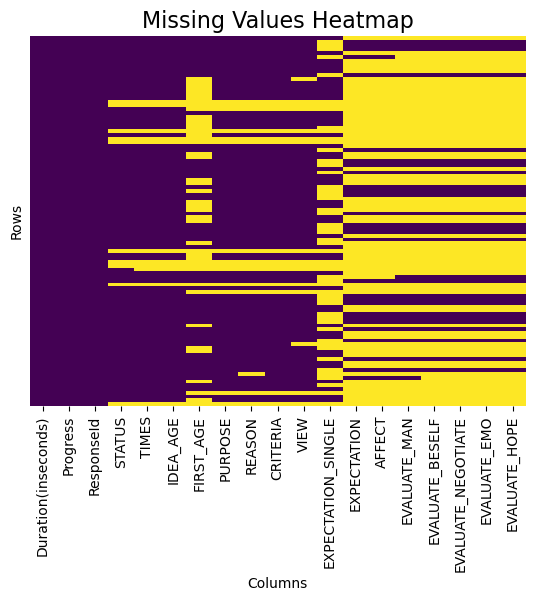

In [96]:
visualize_nan(LOVE_dataset, LOVE_dataset.columns)

In [97]:
LOVE_dataset.columns

Index(['Duration(inseconds)', 'Progress', 'ResponseId', 'STATUS', 'TIMES',
       'IDEA_AGE', 'FIRST_AGE', 'PURPOSE', 'REASON', 'CRITERIA', 'VIEW',
       'EXPECTATION_SINGLE', 'EXPECTATION', 'AFFECT', 'EVALUATE_MAN',
       'EVALUATE_BESELF', 'EVALUATE_NEGOTIATE', 'EVALUATE_EMO',
       'EVALUATE_HOPE'],
      dtype='object')

In [98]:
PURPOSE_map = {
    '以前现在未来都没有这方面的打算': np.nan,
    'no': 'Having no specific purpose yet',
    '做爱': 'Obtaining happiness and fun in life',
    '没有这个必要': np.nan,
    'being a relationship is an exhausting thing in my opinion make a booty call may be better': 'Obtaining happiness and fun in life'
}
LOVE_dataset.loc[:, "PURPOSE"] = LOVE_dataset["PURPOSE"].replace(PURPOSE_map)

REASON_map = {
    '我們是哥布林 而且是不會爆金幣的哥布林': 'Economic pressure or limited resources',
    '擔心談戀愛影響自己的情緒和狀態，不想改變現狀': 'Fear of emotional setbacks or having concerns about dating',
    '没有这个必要': np.nan,
    'being a relationship is an exhausting thing in my opinion make a booty call may be better': 'Fear of emotional setbacks or having concerns about dating'
}
LOVE_dataset.loc[:, "REASON"] = LOVE_dataset["REASON"].replace(REASON_map)

CRITERIA_map = {'无': np.nan, '感觉': 'No fixed standards'}
LOVE_dataset.loc[:, "CRITERIA"] = LOVE_dataset["CRITERIA"].replace(CRITERIA_map)

VIEW_map = {'非常反对': 'Opposed', '富人親身感受  窮人親眼目睹': np.nan, 
           '感觉大部分人的大学恋爱只是因为大学之前没有接触过恋爱所以为了谈恋爱而谈恋爱，大部分校园情侣不会考虑毕业之后两人的发展方向，即面临毕业即分手的情况。': 'Opposed, believing that it is not advisable to invest emotionally during the school period'}
LOVE_dataset.loc[:, "VIEW"] = LOVE_dataset["VIEW"].replace(VIEW_map)

EXPECTATION_SINGLE_map = {
    '无': np.nan,
    'Other (please specify below)': np.nan, '無伴侶':np.nan
}
LOVE_dataset.loc[:, "EXPECTATION_SINGLE"] = LOVE_dataset["EXPECTATION_SINGLE"].replace(EXPECTATION_SINGLE_map)

EVALUATE_map = {
    'Strongly disagree': 1, 
    'Somewhat disagree': 2, 
    'Neither agree or disagree': 3,
    'Somewhat agree': 4,
    'Strongly agree': 5
}

LOVE_dataset.loc[:, "EVALUATE_MAN"] = LOVE_dataset["EVALUATE_MAN"].replace(EVALUATE_map)
LOVE_dataset.loc[:, "EVALUATE_BESELF"] = LOVE_dataset["EVALUATE_BESELF"].replace(EVALUATE_map)
LOVE_dataset.loc[:, "EVALUATE_NEGOTIATE"] = LOVE_dataset["EVALUATE_NEGOTIATE"].replace(EVALUATE_map)
LOVE_dataset.loc[:, "EVALUATE_EMO"] = LOVE_dataset["EVALUATE_EMO"].replace(EVALUATE_map)
LOVE_dataset.loc[:, "EVALUATE_HOPE"] = LOVE_dataset["EVALUATE_HOPE"].replace(EVALUATE_map)

LOVE_dataset["EVALUATE_MAN"] = pd.to_numeric(LOVE_dataset["EVALUATE_MAN"], errors="coerce")
LOVE_dataset["EVALUATE_BESELF"] = pd.to_numeric(LOVE_dataset["EVALUATE_BESELF"], errors="coerce")
LOVE_dataset["EVALUATE_NEGOTIATE"] = pd.to_numeric(LOVE_dataset["EVALUATE_NEGOTIATE"], errors="coerce")
LOVE_dataset["EVALUATE_EMO"] = pd.to_numeric(LOVE_dataset["EVALUATE_EMO"], errors="coerce")
LOVE_dataset["EVALUATE_HOPE"] = pd.to_numeric(LOVE_dataset["EVALUATE_HOPE"], errors="coerce")

LOVE_dataset["ABILITY"] = LOVE_dataset["EVALUATE_MAN"] + LOVE_dataset["EVALUATE_BESELF"] + LOVE_dataset["EVALUATE_NEGOTIATE"] + LOVE_dataset["EVALUATE_EMO"] + LOVE_dataset["EVALUATE_HOPE"]

LOVE_dataset

/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/3007080747.py:39: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  LOVE_dataset.loc[:, "EVALUATE_MAN"] = LOVE_dataset["EVALUATE_MAN"].replace(EVALUATE_map)
/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/3007080747.py:40: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  LOVE_dataset.loc[:, "EVALUATE_BESELF"] = LOVE_dataset["EVALUATE_BESELF"].replace(EVALUATE_map)
/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/3007080747.py:41: FutureWarni

,Duration(inseconds),Progress,ResponseId,STATUS,TIMES,IDEA_AGE,FIRST_AGE,PURPOSE,REASON,CRITERIA,VIEW,EXPECTATION_SINGLE,EXPECTATION,AFFECT,EVALUATE_MAN,EVALUATE_BESELF,EVALUATE_NEGOTIATE,EVALUATE_EMO,EVALUATE_HOPE,ABILITY
0,2033.0,100,R_4MM1ltT1Nhg82pr,Single,Once,18-22,19-21,"Seeking emotional support and companionship,Pursuing marriage and long-term relationships,Personal growth and self-exploration,Obtaining happiness and fun in life",Fear of emotional setbacks or having concerns about dating,most important: that person must be positive and optimistic!,"Supportive, thinking that it can enrich the college experience","if that person is good enough I would want to get married with her ,or I will focused on now",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,292.0,100,R_4X4Yrj2WHp3iDX9,In a relationship,Three times or more,18-22,Before 15,"Seeking emotional support and companionship,Obtaining happiness and fun in life","Focusing on academics or career development,Economic pressure or limited resources,Lack of suitable partners","Compatibility of personality and worldview,Physical appearance and attractiveness,Compatibility in lifestyle and hobbies","Neutral, believing that whether to engage in a romantic relationship depends on personal choice",NaN,"The future is uncertain, and we are letting things develop naturally","There might be some impact, but I would actively cope with it and adjust my mindset​​​​​",4.0,5.0,3.0,3.0,4.0,19.0
2,205.0,100,R_4fHRrHvAjNYuldI,In a relationship,Three times or more,23-27,Before 15,"Seeking emotional support and companionship,Personal growth and self-exploration,Obtaining happiness and fun in life","Lack of interest or need for a relationship,Lack of suitable partners,Fear of emotional setbacks or having concerns about dating","Compatibility of personality and worldview,Physical appearance and attractiveness,family background,Compatibility in lifestyle and hobbies","Supportive, thinking that it can enrich the college experience",NaN,"At this stage, our main focus is on being each other's companions, and we don't have specific future plans yet","There would be no impact, and I could quickly return to my normal life and study routine",5.0,4.0,4.0,5.0,4.0,22.0
3,211.0,100,R_4eLd0ZLstEsjVTS,In a relationship,Twice,18-22,19-21,Having no specific purpose yet,Lack of interest or need for a relationship,"Compatibility of personality and worldview, Similarity in values,Compatibility in lifestyle and hobbies","Supportive, thinking that it can enrich the college experience",NaN,We plan to get married in the future,"There might be some impact, but I would actively cope with it and adjust my mindset​​​​​",4.0,5.0,4.0,3.0,4.0,20.0
4,324.0,100,R_4lWRnxmPQ3kFsRP,Single,Three times or more,23-27,Before 15,"Seeking emotional support and companionship,Pursuing marriage and long-term relationships,Personal growth and self-exploration,Obtaining happiness and fun in life","Lack of suitable partners,Fear of emotional setbacks or having concerns about dating","Compatibility of personality and worldview,Physical appearance and attractiveness,Educational background or level of knowledge,Economic conditions or job stability,family background, Similarity in values,Compatibility in lifestyle and hobbies","Supportive, thinking that it can enrich the college experience",We plan to get married in the future,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,198.0,100,R_4ROKFSz1JdilXnh,In a relationship,Once,18-22,19-21,"Seeking emotional support and companionship,Personal growth and self-exploration,Obtaining happiness and fun in life","Focusing on academics or career development,Economic pressure or limited resources,Lack of interest or need for a relationship,Lack of suitable partners,Fear of emotional setbacks or having concerns about dating,Influence from family or culture","Compatibility of personality and worldview,Educational background or level of knowledge,Compatibility in lifestyle and hobbies","Neutral, believing that whether to engage in a ro

In [99]:
#CategoricalDtype
categories_order_1 = ['Single', 'In a relationship', 'Engaged/Married', 'Divorced','Prefer not to say','nan']
status_dtype = CategoricalDtype(categories=categories_order_1, ordered=True)
LOVE_dataset['STATUS'] = LOVE_dataset['STATUS'].astype(status_dtype)


categories_order_2 = ['No romantic experience', 'Once', 'Twice','Three times or more','Prefer not to say']
times_dtype = CategoricalDtype(categories=categories_order_2, ordered=True)
LOVE_dataset['TIMES'] = LOVE_dataset['TIMES'].astype(times_dtype)

categories_order_3 = ['Before 18', '18-22', '23-27','Above 27']
idea_age_dtype = CategoricalDtype(categories=categories_order_3, ordered=True)
LOVE_dataset['IDEA_AGE'] = LOVE_dataset['IDEA_AGE'].astype(idea_age_dtype)

categories_order_4 = ['Before 15', '16-18', '19-21','22-25','Above 26','Prefer not to say']
first_age_dtype = CategoricalDtype(categories=categories_order_4, ordered=True)
LOVE_dataset['FIRST_AGE'] = LOVE_dataset['FIRST_AGE'].astype(first_age_dtype)

categories_order_5 = ['Fully supportive, believing that one must have a romantic relationship during college', 
                      'Supportive, thinking that it can enrich the college experience', 
                      'Neutral, believing that whether to engage in a romantic relationship depends on personal choice'
                      'Not very supportive, thinking taht it may affect academic performance',
                      'Opposed, believing that it is not advisable to invest emotionally during the school period']
view_dtype = CategoricalDtype(categories=categories_order_5, ordered=True)
LOVE_dataset['VIEW'] = LOVE_dataset['VIEW'].astype(view_dtype)

In [100]:
LOVE_dataset.columns

Index(['Duration(inseconds)', 'Progress', 'ResponseId', 'STATUS', 'TIMES',
       'IDEA_AGE', 'FIRST_AGE', 'PURPOSE', 'REASON', 'CRITERIA', 'VIEW',
       'EXPECTATION_SINGLE', 'EXPECTATION', 'AFFECT', 'EVALUATE_MAN',
       'EVALUATE_BESELF', 'EVALUATE_NEGOTIATE', 'EVALUATE_EMO',
       'EVALUATE_HOPE', 'ABILITY'],
      dtype='object')

In [101]:
options_love = ['STATUS', 'TIMES', 'IDEA_AGE', 'FIRST_AGE',
       'VIEW', "ABILITY",
       'EXPECTATION_SINGLE', 'EXPECTATION', 'AFFECT',
       'EVALUATE_MAN', 'EVALUATE_BESELF',
       'EVALUATE_NEGOTIATE', 'EVALUATE_EMO', 'EVALUATE_HOPE']
dropdown = widgets.Dropdown(
    options=options_love,
    value="STATUS",
    description="Variable"
)
dropdown

Dropdown(description='Variable', options=('STATUS', 'TIMES', 'IDEA_AGE', 'FIRST_AGE', 'VIEW', 'ABILITY', 'EXPE…

In [102]:
#Create an iteractive drawer of DV's count plot
@interact
def display_plot(variable=dropdown):
    data_clean = LOVE_dataset.dropna(subset=[variable])

    count_data = data_clean[variable].value_counts(normalize=True).reset_index()
    count_data.columns = [variable, 'percentage']
    count_data['percentage'] = (count_data['percentage'] * 100).round(2)

    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=variable, data=data_clean, palette='Set2')

    total = len(data_clean)
    for p in ax.patches:
        height = p.get_height()
        percentage = (height / total) * 100
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{percentage:.1f}%', ha='center', fontsize=12)

    plt.title(f'Distribution of {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, axis='y', alpha=0.3)
    plt.show()

interactive(children=(Dropdown(description='Variable', options=('STATUS', 'TIMES', 'IDEA_AGE', 'FIRST_AGE', 'V…

In [103]:
dropdown = widgets.Dropdown(
    options=options_love,
    value="STATUS",
    description="Variable"
)
@interact
def display_distribution(variable=dropdown):
    if variable not in LOVE_dataset.columns:
        print(f"Invalid variable: {variable}")
        return
    
    pmf = LOVE_dataset[variable].value_counts(normalize=True)
    pmf = pmf.sort_index()

    plt.figure(figsize=(10, 6))
    pmf.plot(kind='bar', color='lightgreen', edgecolor='black')
    plt.title(f'Probability Mass Function (PMF) for {variable}', fontsize=16)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Probability', fontsize=12)
    plt.grid(True, axis='y', alpha=0.3)
    plt.xticks(rotation=45)
    plt.show()

    if variable in ["STATUS", "TIMES", 'IDEA_AGE', 'FIRST_AGE', 'VIEW', 'EVALUATE_MAN', 'EVALUATE_BESELF', 'EVALUATE_EMO', 'EVALUATE_HOPE', 'ABILITY']:
        cdf = pmf.cumsum()

        plt.figure(figsize=(10, 6))
        plt.step(cdf.index, cdf.values, where='mid', color='skyblue')
        plt.title(f'Cumulative Distribution Function (CDF) for {variable}', fontsize=16)
        plt.xlabel(variable, fontsize=12)
        plt.ylabel('Cumulative Probability', fontsize=12)
        plt.grid(True, axis='y', alpha=0.3)
        plt.show()

interactive(children=(Dropdown(description='Variable', options=('STATUS', 'TIMES', 'IDEA_AGE', 'FIRST_AGE', 'V…

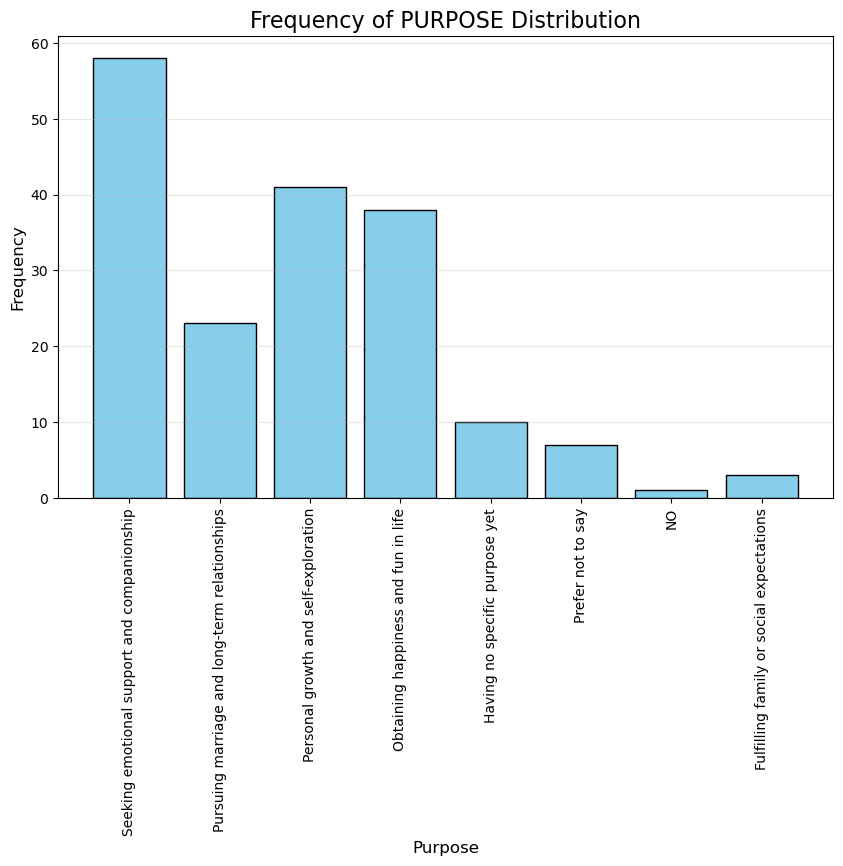

In [104]:
PURPOSE_data = LOVE_dataset[['PURPOSE']].dropna()
PURPOSE_all_choices = PURPOSE_data['PURPOSE'].str.split(',')
flat_choices = [item.strip() for sublist in PURPOSE_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of PURPOSE Distribution', fontsize=16)
plt.xlabel('Purpose', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

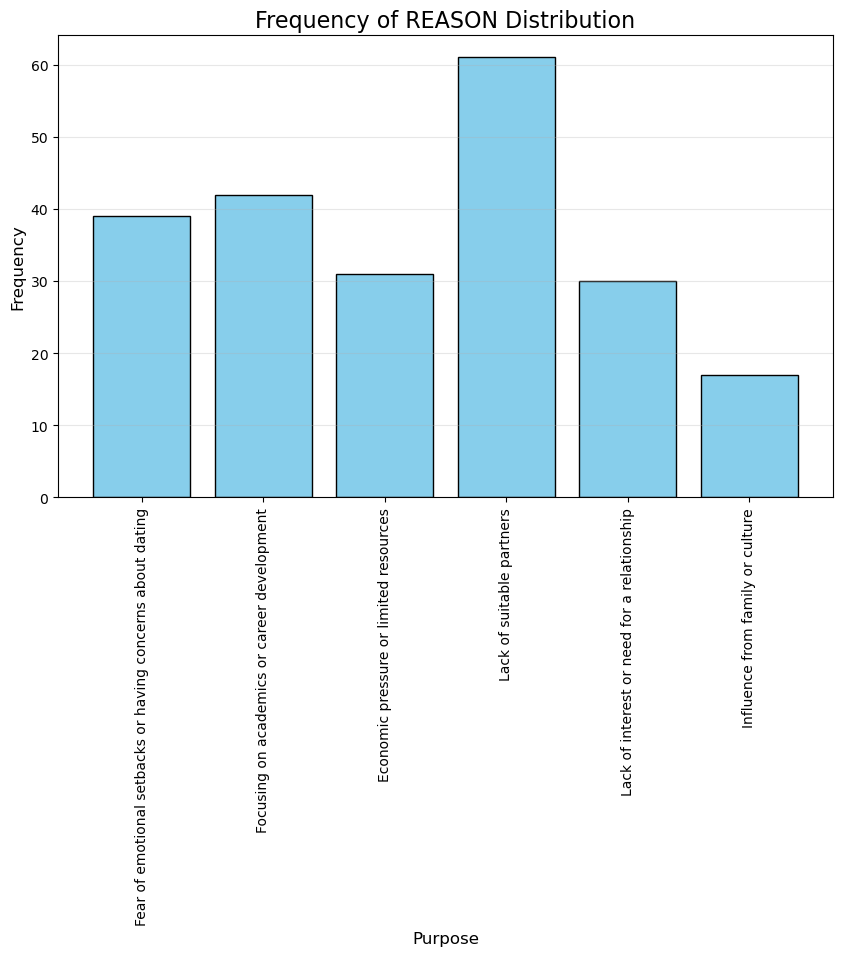

In [105]:
REASON_data = LOVE_dataset[['REASON']].dropna()
REASON_all_choices = REASON_data['REASON'].str.split(',')
flat_choices = [item.strip() for sublist in REASON_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of REASON Distribution', fontsize=16)
plt.xlabel('Purpose', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

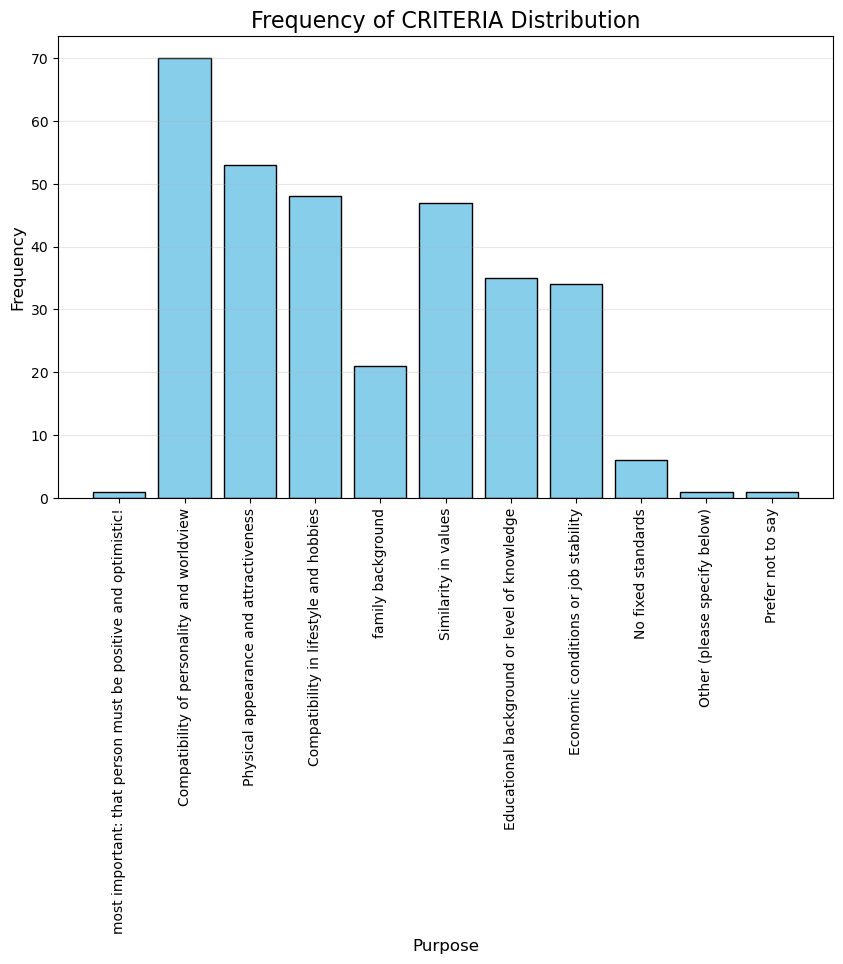

In [106]:
CRITERIA_data = LOVE_dataset[['CRITERIA']].dropna()
CRITERIA_all_choices = CRITERIA_data['CRITERIA'].str.split(',')
flat_choices = [item.strip() for sublist in CRITERIA_all_choices for item in sublist]

choice_counts = Counter(flat_choices)
choice_df = pd.DataFrame(choice_counts.items(), columns=['Choice', 'Frequency'])

plt.figure(figsize=(10, 6))
plt.bar(choice_df['Choice'], choice_df['Frequency'], color='skyblue', edgecolor='black')
plt.title('Frequency of CRITERIA Distribution', fontsize=16)
plt.xlabel('Purpose', fontsize=12)
plt.xticks(rotation=90)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.show()

/var/folders/f3/026zmp012l767l15ynvf83nc0000gn/T/ipykernel_17474/3988958280.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


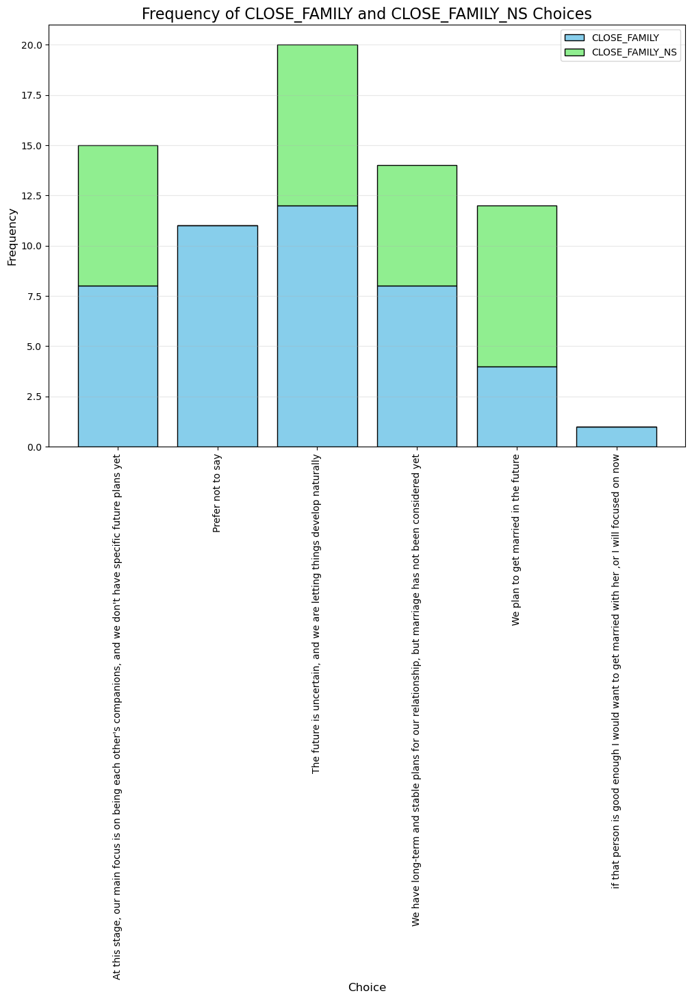

In [107]:
flat_choices_cf = LOVE_dataset['EXPECTATION_SINGLE'].dropna().tolist()
cf_counts = Counter(flat_choices_cf)

flat_choices_cfns = LOVE_dataset['EXPECTATION'].dropna().tolist()
cfns_counts = Counter(flat_choices_cfns)

all_choices = sorted(set(cf_counts.keys()).union(set(cfns_counts.keys())))

combined_data = {
    'Choice': all_choices,
    'EXPECTATION_SINGLE_data': [cf_counts.get(choice, 0) for choice in all_choices],
    'EXPECTATION_data': [cfns_counts.get(choice, 0) for choice in all_choices]
}
combined_df = pd.DataFrame(combined_data)

plt.figure(figsize=(12, 8))
plt.bar(combined_df['Choice'], combined_df['EXPECTATION_SINGLE_data'], 
        label='CLOSE_FAMILY', color='skyblue', edgecolor='black')
plt.bar(combined_df['Choice'], combined_df['EXPECTATION_data'], 
        bottom=combined_df['EXPECTATION_SINGLE_data'], 
        label='CLOSE_FAMILY_NS', color='lightgreen', edgecolor='black')

plt.title('Frequency of CLOSE_FAMILY and CLOSE_FAMILY_NS Choices', fontsize=16)
plt.xlabel('Choice', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

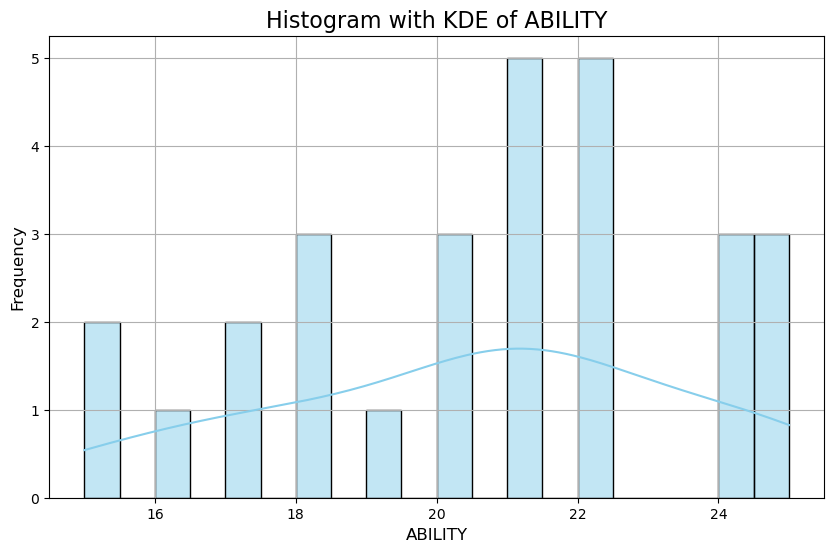

In [108]:
plt.figure(figsize=(10, 6))
sns.histplot(LOVE_dataset['ABILITY'], kde=True, color='skyblue', bins=20)
plt.title('Histogram with KDE of ABILITY', fontsize=16)
plt.xlabel('ABILITY', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)
plt.show()

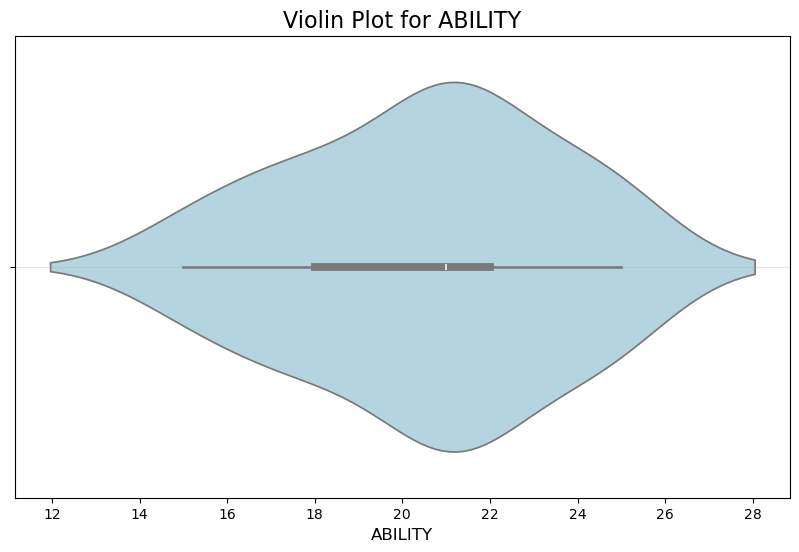

In [109]:
plt.figure(figsize=(10, 6))
sns.violinplot(
    x=LOVE_dataset['ABILITY'],
    color='lightblue',
)
plt.title('Violin Plot for ABILITY', fontsize=16)
plt.xlabel('ABILITY', fontsize=12)
plt.grid(True, axis='y', alpha=0.3)
plt.show()

In [224]:
DEMO_dataset["INCOME_SOURCE"]

0                                      Family support
1                                      Family support
2                                      Family support
3                                      Family support
4                                              Salary
5                                      Family support
6                                      Family support
7                                      Family support
8                       Family support,Salary,Savings
9                                      Family support
10                              Family support,Salary
11                  Family support,Scholarship,Salary
12                                     Family support
13                                     Family support
14                             Family support,Savings
15                                     Family support
16                              Family support,Salary
17                                                NaN
18                          